<a href="https://colab.research.google.com/github/deepakri201/nlst_explore/blob/main/Exploratory_analysis_NLST_126k.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This notebook explores the 126k series NLST results.

https://github.com/deepakri201/nlst_explore

SELECT
DISTINCT(findingSite.CodeMeaning)
FROM
`idc-external-025.terra.nlst-126k-measurements-clinical-acquisition`

CodeMeaning
Adrenal gland
Aorta
Brain
C1 vertebra
C2 vertebra
C3 vertebra
C4 vertebra
C5 vertebra
C6 vertebra
C7 vertebra
Clavicle
Colon
Common iliac artery
Common iliac vein
Deep muscle of back
Duodenum
Eighth rib
Eleventh rib
Esophagus
Face
Femur
Fifth rib
First rib
Fourth rib
Gallbladder
Gluteus maximus muscle
Gluteus medius muscle
Gluteus minius muscle
Hip
Humerus
Iliopsoas muscle
Inferior vena cava
Kidney
L1 vertebra
L2 vertebra
L3 vertebra
L4 vertebra
L5 vertebra
Left atrium
Left ventricle of heart
Liver
Lower lobe of lung
Middle lobe of right lung
Myocardium
Ninth rib
Pancreas
Portal vein and splenic vein
Pulmonary artery
Right atrium
Right ventricle of heart
Sacrum
Scapula
Second rib
Seventh rib
Sixth rib
Small Intestine
Spleen
Stomach
T1 vertebra
T10 vertebra
T11 vertebra
T12 vertebra
T2 vertebra
T3 vertebra
T4 vertebra
T5 vertebra
T6 vertebra
T7 vertebra
T8 vertebra
T9 vertebra
Tenth rib
Third rib
Trachea
Twelfth rib
Upper lobe of lung
Urinary bladder

SELECT
DISTINCT(Quantity.CodeMeaning)
FROM
`idc-external-025.terra.nlst-126k-measurements-clinical-acquisition`
ORDER BY Quantity.CodeMeaning ASC


10th percentile
90th percentile
Approximate volume
Elongation
Energy
Flatness
Intensity histogram entropy
Intensity histogram uniformity
Interquartile range
Least axis length
Major axis length
Maximum 3D diameter
Maximum grey level
Mean
Mean absolute deviation
Median
Minimum grey level
Minor axis length
Range
Robust mean absolute deviation
Root mean square
Skewness
Sphericity
Surface area
Surface to volume ratio
Variance
Volume

In [1]:
#@title Enter your Project ID here
# initialize this variable with your Google Cloud Project ID!
project_name = "idc-external-018" #@param {type:"string"}

import os
os.environ["GCP_PROJECT_ID"] = project_name

!gcloud config set project $project_name

from google.colab import auth
auth.authenticate_user()

Updated property [core/project].


# Environment setup

In [2]:
import os
import sys
import time
import json
import subprocess
import glob
import shutil

import numpy as np
import matplotlib.pyplot as plt

import pandas as pd
pd.options.mode.chained_assignment = None

import seaborn as sb
import db_dtypes

from google.cloud import bigquery
from google.cloud import storage

from collections import OrderedDict

import seaborn as sns

from pathlib import Path

import random

import collections
import scipy

In [3]:
!pip install bokeh==2.4.3

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.5/18.5 MB 35.4 MB/s eta 0:00:00
  Attempting uninstall: bokeh
    Found existing installation: bokeh 3.2.2
    Uninstalling bokeh-3.2.2:
      Successfully uninstalled bokeh-3.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
panel 1.2.2 requires bokeh<3.3.0,>=3.1.1, but you have bokeh 2.4.3 which is incompatible.


In [4]:
# https://docs.bokeh.org/en/latest/docs/user_guide/categorical.html
# http://jaredmmoore.com/bokeh-boxplot-color-by-factor-and-legend-outside-plot/
# https://github.com/jaredmoore/Bokeh_Plot_Examples/blob/master/Bokeh%2012.10%20Boxplot%20AutoGroup.ipynb

from bokeh.models import ColumnDataSource, OpenURL, TapTool
from bokeh.plotting import figure, output_file, show, save
from bokeh.io import output_notebook
from bokeh.colors import RGB
from bokeh.transform import jitter

from bokeh.models import HoverTool, PanTool, WheelZoomTool, BoxZoomTool, ResetTool, TapTool
from bokeh.models import Legend, LegendItem

from bokeh.palettes import brewer

from bokeh.layouts import row

from bokeh.io import export_png
from bokeh.io.export import get_screenshot_as_png

In [5]:
import bokeh
bokeh.__version__

'2.4.3'

# Parameterization

In [6]:
# table_id = "idc-external-025.terra.10k-series-data-061023-measurements-clinical-viewer_table_Deepa" # includes left/right laterality and smoking status
table_id_126k = "idc-external-025.terra.nlst-126k-measurements-clinical-acquisition"
table_id_10k = "idc-external-025.terra.10k-series-data-061023-measurements-clinical-viewer_table_Deepa" # includes left/right laterality and smoking status

# Functions

In [7]:
def color_list_generator(df, col):
  """

  Create a list of colors per col given a dataframe

  Arguments:
    df    : dataframe to get data from
    col   : column to use to get unique treatments.

  Returns:
    colormap   : the colormap created
    colors     : the actual colors

  Inspired by creating colors for each treatment
  Rough Source: http://bokeh.pydata.org/en/latest/docs/gallery/brewer.html#gallery-brewer
  Fine Tune Source: http://bokeh.pydata.org/en/latest/docs/gallery/iris.html

  """

  if (len(df[col].unique()))==1:
    colors = brewer["Dark2"][3][0:1] # Spectral, Dark2
  elif (len(df[col].unique()))==2:
    colors = brewer["Dark2"][3][0:2]
  elif (len(df[col].unique()))>8:
    num_colors = len(df[col].unique())
    num_colormaps = np.int32(np.ceil(num_colors/8))
    colormap_chained = brewer["Dark2"][8]*num_colormaps
    colors = colormap_chained[0:num_colors]
  else:
    colors = brewer["Dark2"][len(df[col].unique())]

  # Create a map between treatment and color.
  colormap = {i: colors[k] for k,i in enumerate(df[col].unique())}

  # sort these according to the key
  colormap = collections.OrderedDict(sorted(colormap.items()))

  # Return a list of colors for each value that we will be looking at.
  return colormap, [colormap[x] for x in df[col]]

# Download a SEG file from DICOM datastore, and corresponding CT files from IDC

In [ ]:
!pip install dicomweb-client
import pydicom
token = !gcloud auth print-access-token
token = token[0]

my_project = 'idc-external-025'
location = 'us-central1'
dataset_id = 'total_segmentator_nlst_total_070823'
dicom_store_id = '126k-series'

study_instance_uid = "1.2.840.113654.2.55.314461341690068877964639944018305135562"
series_instance_uid = "1.2.276.0.7230010.3.1.3.313263360.45219.1688798726.175205"
sop_instance_uid = "1.2.276.0.7230010.3.1.4.313263360.45219.1688798726.175206"

url = f"https://healthcare.googleapis.com/v1/projects/{my_project}/locations/{location}/datasets/{dataset_id}/dicomStores/{dicom_store_id}/dicomWeb"
headers = {
      "Authorization" : "Bearer %s" % token
   }
import dicomweb_client
client = dicomweb_client.api.DICOMwebClient(url, headers=headers)
retrievedInstance = client.retrieve_instance(
                 study_instance_uid=study_instance_uid,
                 series_instance_uid=series_instance_uid,
                sop_instance_uid=sop_instance_uid)
pydicom.filewriter.write_file("/content/file.dcm", retrievedInstance)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.9/60.9 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 25.7 MB/s eta 0:00:00


In [ ]:
# Get the referenced SeriesInstanceUID

dcm = pydicom.dcmread("/content/file.dcm")
referenced_series_instance_uid =  dcm.ReferencedSeriesSequence[0]['SeriesInstanceUID'].value
print('referenced_series_instance_uid: ' + str(referenced_series_instance_uid))


referenced_series_instance_uid: 1.2.840.113654.2.55.107872131069750320238583038287254717075


In [ ]:
!pip install https://github.com/GoogleCloudPlatform/healthcare-api-dicomweb-cli/archive/v1.0.zip

     \ 48.5 kB 494.7 kB/s 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.3/88.3 kB 1.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Created wheel for dcmweb: filename=dcmweb-1.0-py3-none-any.whl size=24777 sha256=2601c0063b2eb555b9b39f87e0fb951a17a48d7d2f9c58e4952ec3681436d568
  Stored in directory: /tmp/pip-ephem-wheel-cache-0s8f3vvq/wheels/84/e1/84/acc6effcd5fd69ecdca2a184c3859311c9335aa15a7cc35fb5
  Created wheel for fire: filename=fire-0.5.0-py2.py3-none-any.whl size=116934 sha256=d7daabf28c2976c74f13cd951a051a8f696c50b6b41222c6fd07fe0e4ebb36c7
  Stored in directory: /root/.cache/pip/wheels/90/d4/f7/9404e5db0116bd4d43e5666eaa3e70ab53723e1e3ea40c9a95
  Created wheel for hurry.filesize: filename=hurry.filesize-0.9-py3-none-any.whl size=4120 sha256=7ea497ddf0574ae69f80af0f99bcb7c3a1bc0c7b51d14be48d75a6e67b8aa3ae
  Stored in directory: /root/.cache/pip/wheels/e9/af/17/1c4cd045d88f

In [ ]:
!dcmweb \
  https://proxy.imaging.datacommons.cancer.gov/current/viewer-only-no-downloads-see-tinyurl-dot-com-slash-3j3d9jyp/dicomWeb/studies/1.2.840.113654.2.55.314461341690068877964639944018305135562/series/1.2.840.113654.2.55.107872131069750320238583038287254717075/instances/1.2.840.113654.2.55.90445998827706419967775947905443481066/ \
  retrieve

2023-09-14 21:24:12,297 -- No project ID could be determined. Consider running `gcloud config set project` or setting the GOOGLE_CLOUD_PROJECT environment variable
2023-09-14 21:24:13,403 -- host https://proxy.imaging.datacommons.cancer.gov/current/viewer-only-no-downloads-see-tinyurl-dot-com-slash-3j3d9jyp/dicomWeb/studies/1.2.840.113654.2.55.314461341690068877964639944018305135562/series/1.2.840.113654.2.55.107872131069750320238583038287254717075/instances/1.2.840.113654.2.55.90445998827706419967775947905443481066/ is inaccessible: Unexpected return code 404
 <!DOCTYPE html>
<html lang=en>
  <meta charset=utf-8>
  <meta name=viewport content="initial-scale=1, minimum-scale=1, width=device-width">
  <title>Error 404 (Not Found)!!1</title>
  <style>
    *{margin:0;padding:0}html,code{font:15px/22px arial,sans-serif}html{background:#fff;color:#222;padding:15px}body{margin:7% auto 0;max-width:390px;min-height:180px;padding:30px 0 15px}* > body{background:url(//www.google.com/images/error

In [ ]:
# # Retrieve the series -- cannot do this!!

# url = 'https://testing-proxy.canceridc.dev/v1/projects/canceridc-data/locations/us/datasets/idc/dicomStores/v10-viewer-only-no-downloads-see-tinyurl-dot-com-slash-3j3d9jyp/dicomWeb'
url = "https://proxy.imaging.datacommons.cancer.gov/current/viewer-only-no-downloads-see-tinyurl-dot-com-slash-3j3d9jyp/dicomWeb"
# url = "https://proxy.imaging.datacommons.cancer.gov/current/viewer-only-no-downloads-see-tinyurl-dot-com-slash-3j3d9jyp/dicomWeb/studies/1.3.6.1.4.1.14519.5.2.1.6279.6001.224985459390356936417021464571/series/1.3.6.1.4.1.14519.5.2.1.6279.6001.273525289046256012743471155680"
client = dicomweb_client.api.DICOMwebClient(url)

instances = client.retrieve_series(
    study_instance_uid=study_instance_uid,
    series_instance_uid=referenced_series_instance_uid
)

if not os.path.isdir("/content/ct_raw"):
  os.mkdir("/content/ct_raw")

for index, instance in enumerate(instances):
  filename = os.path.join("/content/ct_raw", str(index) + ".dcm")
  pydicom.filewriter.write_file(filename, instance)

HTTPError: ignored

# Anatomical consistency

## B.  NLST segmentation left vs right verification - Bland-Altman plot and correlation plot



The volumes of these should be similar across patients. We can use a Bland-Altman plot to plot the differences between the left and right volumes. We first make sure that the segmentation is complete by using Vamsi's segmentation completeness check query.

Do a loop over: kidney, adrenal gland, humerus, scapula, clavicle, femur, hip, autochthon, iliopsoas gluteus maximus, gluteus medius, gluteus minimus, all the ribs

In [ ]:
left_right_organs = ["Kidney", "Adrenal gland", "Humerus", "Scapula", "Femur", "Hip", "Autochthon", "Iliopsoas", "Gluteus maximus", "Gluteus medius", "Gluteus minimus",
                     "First rib", "Second rib", "Third rib", "Fourth rib", "Fifth rib", "Sixth rib", "Seventh rib", "Eighth rib", "Ninth rib", "Tenth rib", "Eleventh rib", "Twelfth rib"]

In [ ]:
def create_df_bland_altman(region, feature, table_id, project_name):

  client = bigquery.Client(project=project_name)

  query = f"""

      SELECT
        StudyInstanceUID,
        sourceSegmentedSeriesUID,
        age,
        gender,
        Value,
        lateralityModifier.CodeMeaning as laterality,
        segmentation_completeness_check,
        viewerUrl,
        SeriesNumber
      FROM
        `{table_id}` as clinical_table
      JOIN
        `idc-external-025.terra.segmentation_completeness_table` as segmentation_completeness
      ON
        clinical_table.sourceSegmentedSeriesUID = segmentation_completeness.rssSIUD AND
        clinical_table.lateralityModifier.CodeMeaning = segmentation_completeness.laterality AND
        clinical_table.findingSite.CodeMeaning = segmentation_completeness.bodyPart
      WHERE
        findingSite.CodeMeaning = @region AND
        Quantity.CodeMeaning = @feature AND
        segmentation_completeness_check = 'may_be_segmented_fully'
      ORDER BY
        clinical_table.sourceSegmentedSeriesUID;
        """

  job_config = bigquery.QueryJobConfig(query_parameters=[
                                                          bigquery.ScalarQueryParameter("region", "STRING", region),
                                                          bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                          ])
  df = client.query(query, job_config=job_config).to_dataframe()

  # dataframe for Left and Right separately
  df_left = df[df['laterality']=="Left"]
  df_right = df[df['laterality']=="Right"]
  df_left_and_right = df_left.merge(df_right, left_on='sourceSegmentedSeriesUID', right_on='sourceSegmentedSeriesUID')

  # add the ohif urls

  df_left_and_right['viewer_url'] = [None] * len(df_left_and_right)
  df_left_and_right['viewer_url'] = [os.path.join('https://idc-tester-dk-2-server.web.app/viewer',
                                                  f + '!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series')
                                      for f in df_left_and_right['StudyInstanceUID_x'].values]
  df_plot = df_left_and_right.copy(deep=True)

  # https://idc-tester-dk-2-server.web.app/viewer/1.3.6.1.4.1.14519.5.2.1.7009.9004.928330187000432794702104278091!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series

  # add the x and y columns

  new_column = [np.float32(f) for f in df_plot['Value_x'].values]
  df_plot['Value_x_numeric'] = new_column
  new_column = [np.float32(f) for f in df_plot['Value_y'].values]
  df_plot['Value_y_numeric'] = new_column

  df_plot['Value_x_numeric'] = df_plot['Value_x_numeric'] / 1000
  df_plot['Value_y_numeric'] = df_plot['Value_y_numeric'] / 1000

  df_plot['y'] = df_plot['Value_x_numeric'].values - df_plot['Value_y_numeric'].values
  df_plot['x'] = (df_plot['Value_x_numeric'].values + df_plot['Value_y_numeric'].values) / 2

  # divide by 1000 to convert to mL
  # df_plot['y'] = df_plot['y']/1000
  # df_plot['x'] = df_plot['x']/1000

  return df_plot


In [ ]:
# # From chat gpt....
# WITH filtered_data AS (
#   SELECT
#     c.StudyInstanceUID,
#     c.sourceSegmentedSeriesUID,
#     c.findingSite.CodeMeaning AS findingSite_CodeMeaning,
#     c.age,
#     c.gender,
#     c.Value,
#     c.lateralityModifier.CodeMeaning AS laterality,
#     s.viewerUrl,
#     s.SeriesNumber,
#     s.segmentation_completeness_check
#   FROM
#     `idc-external-025.terra.nlst-126k-measurements-clinical-acquisition` AS c
#   JOIN
#     `idc-external-025.terra.segmentation_completeness_table` AS s
#   ON
#     c.sourceSegmentedSeriesUID = s.rssSIUD
#     AND c.lateralityModifier.CodeMeaning = s.laterality
#     AND c.findingSite.CodeMeaning = s.bodyPart
#   WHERE
#     c.Quantity.CodeMeaning = "Volume"
#     AND s.segmentation_completeness_check = 'may_be_segmented_fully'
#     AND c.lateralityModifier.CodeMeaning IN ("Left", "Right")
# )

# SELECT
#   r.StudyInstanceUID,
#   r.sourceSegmentedSeriesUID,
#   r.SeriesNumber,
#   r.age,
#   r.gender,
#   r.findingSite_CodeMeaning,
#   r.laterality,
#   r.Value AS right_value,
#   l.Value AS left_value,
#   r.viewerUrl
# FROM
#   filtered_data r
# JOIN
#   filtered_data l
# ON
#   r.sourceSegmentedSeriesUID = l.sourceSegmentedSeriesUID
#   AND r.findingSite_CodeMeaning = l.findingSite_CodeMeaning
#   AND l.laterality = "Left"
# WHERE
#   r.laterality = "Right"
#   AND EXISTS (
#     SELECT 1
#     FROM filtered_data lr
#     WHERE lr.sourceSegmentedSeriesUID = r.sourceSegmentedSeriesUID
#       AND lr.findingSite_CodeMeaning = r.findingSite_CodeMeaning
#       AND lr.laterality = "Left"
#   )


In [ ]:
# def create_df_bland_altman(region, feature, table_id, project_name):

#   client = bigquery.Client(project=project_name)

#   query = f"""

#     SELECT
#       DISTINCT(SOPInstanceUID),
#       StudyInstanceUID,
#       sourceSegmentedSeriesUID,
#       age,
#       gender,
#       Value,
#       lateralityModifier.CodeMeaning as laterality
#     FROM
#       `{table_id}` as clinical_table
#     JOIN
#       `bigquery-public-data.idc_v15_clinical.nlst_ctab` as nlst_ctab
#     ON
#       clinical_table.PatientID = nlst_ctab.pid
#     WHERE
#         findingSite.CodeMeaning = @region AND
#         Quantity.CodeMeaning = @feature;

#     """

#   job_config = bigquery.QueryJobConfig(query_parameters=[
#                                                         bigquery.ScalarQueryParameter("region", "STRING", region),
#                                                         bigquery.ScalarQueryParameter("feature", "STRING", feature)
#                                                         ])
#   df = client.query(query, job_config=job_config).to_dataframe()

#   # dataframe for Left and Right separately
#   df_left = df[df['laterality']=="Left"]
#   df_right = df[df['laterality']=="Right"]
#   df_left_and_right = df_left.merge(df_right, left_on='sourceSegmentedSeriesUID', right_on='sourceSegmentedSeriesUID')

#   # add the ohif urls

#   df_left_and_right['viewer_url'] = [None] * len(df_left_and_right)
#   df_left_and_right['viewer_url'] = [os.path.join('https://idc-tester-dk-2-server.web.app/viewer',
#                                                   f + '!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series')
#                                       for f in df_left_and_right['StudyInstanceUID_x'].values]
#   df_plot = df_left_and_right.copy(deep=True)

#   # https://idc-tester-dk-2-server.web.app/viewer/1.3.6.1.4.1.14519.5.2.1.7009.9004.928330187000432794702104278091!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series

#   # add the x and y columns

#   new_column = [np.float32(f) for f in df_plot['Value_x'].values]
#   df_plot['Value_x_numeric'] = new_column
#   new_column = [np.float32(f) for f in df_plot['Value_y'].values]
#   df_plot['Value_y_numeric'] = new_column

#   df_plot['Value_x_numeric'] = df_plot['Value_x_numeric'] / 1000
#   df_plot['Value_y_numeric'] = df_plot['Value_y_numeric'] / 1000

#   df_plot['y'] = df_plot['Value_x_numeric'].values - df_plot['Value_y_numeric'].values
#   df_plot['x'] = (df_plot['Value_x_numeric'].values + df_plot['Value_y_numeric'].values) / 2

#   # divide by 1000 to convert to mL
#   # df_plot['y'] = df_plot['y']/1000
#   # df_plot['x'] = df_plot['x']/1000

#   return df_plot


In [ ]:
def create_seaborn_plot_bland_altman(df_plot, region):

  fig = plt.figure()

  # add 0 line
  x_min = np.min(df_plot['x'].values)
  x_max = np.max(df_plot['x'].values)
  plt.axhline(0, color='black')

  # add bias line
  bias_value = np.mean(df_plot['y'].values)
  plt.axhline(bias_value, color='red')

  # add bias + 2*std line
  loa_top = bias_value + 2*np.std(df_plot['y'].values) # standard deviation of the differences
  plt.axhline(loa_top, color='blue')

  # add bias - 2*std line
  loa_bottom = bias_value - 2*np.std(df_plot['y'].values) # standard deviation of the differences
  plt.axhline(loa_bottom, color='blue')

  # add scatter plot
  sns.scatterplot(data=df_plot, x="x", y="y", s=8) # s=5

  plt.xlabel('(Left volume + Right volume) / 2')
  plt.ylabel('Left volume - Right volume')
  plt.title(region)

  # plt.show()

  return fig, bias_value, loa_top, loa_bottom

In [ ]:
# def create_bokeh_plot_bland_altman(df_plot):

#   ########## create bokeh plot with ohif urls

#   output_notebook()

#   # set the seed so jitter will be the same for each run
#   np.random.seed(0)
#   random.seed(0)

#   hover = HoverTool(tooltips=[
#     (''.join(["(",'feature',")"]), "($y)")
#   ])

#   wZoom = WheelZoomTool()
#   bZoom = BoxZoomTool()
#   reset = ResetTool()
#   tap = TapTool()
#   pan = PanTool()

#   p = figure(tools = [hover, wZoom, bZoom, reset, tap, pan])

#   # add scatter plot
#   l1 = p.circle(x='x', y='y', source=df_plot, size=3, alpha=1)

#   # add 0 line
#   x_min = np.min(df_plot['x'].values)
#   x_max = np.max(df_plot['x'].values)
#   l_0 = p.line([x_min, x_max], [0, 0], color='black')

#   # add bias line
#   bias_value = np.mean(df_plot['y'].values)
#   l_bias = p.line([x_min, x_max], [bias_value, bias_value], color="red")

#   # add bias + 2*std line
#   loa_top = bias_value + 2*np.std(df_plot['x'].values)
#   l_loa_top = p.line([x_min, x_max], [loa_top, loa_top], color='blue')

#   # add bias - 2*std line
#   loa_bottom = bias_value - 2*np.std(df_plot['x'].values)
#   l_loa_bottom = p.line([x_min, x_max], [loa_bottom, loa_bottom], color='blue')

#   print('bias_value: ' + str(bias_value))
#   print('loa top: ' + str(loa_top))
#   print('loa bottom: ' + str(loa_bottom))

#   # Add url
#   url="@viewer_url"
#   taptool = p.select(type=TapTool)
#   taptool.callback = OpenURL(url=url)

#   # Setup plot titles and such.
#   p.title.text = 'Age vs ' + region + ' ' + feature
#   p.xaxis.axis_label = 'Age'
#   # p.xgrid.grid_line_color = None
#   p.ygrid.grid_line_color = "white"
#   p.grid.grid_line_width = 2
#   # p.xaxis.major_label_text_font_size="0pt"
#   # p.xaxis.major_label_orientation = np.pi/4
#   p.yaxis.axis_label= region + ' ' + feature

#   # show the plot
#   show(p)

#   return

In [ ]:
def create_bokeh_plot_bland_altman_outliers(df_plot, bias_value, loa_top, loa_bottom, output_filename):

  ########## create bokeh plot with ohif urls

  # output_notebook()

  # set the seed so jitter will be the same for each run
  np.random.seed(0)
  random.seed(0)

  hover = HoverTool(tooltips=[
    (''.join(["(",'feature',")"]), "($y)")
  ])

  wZoom = WheelZoomTool()
  bZoom = BoxZoomTool()
  reset = ResetTool()
  tap = TapTool()
  pan = PanTool()

  p = figure(tools = [hover, wZoom, bZoom, reset, tap, pan])

  # add scatter plot
  l1 = p.circle(x='x', y='y', source=df_plot, size=3, alpha=1)

  # add 0 line
  x_min = np.min(df_plot['x'].values)
  x_max = np.max(df_plot['x'].values)
  l_0 = p.line([x_min, x_max], [0, 0], color='black')

  # add bias line
  l_bias = p.line([x_min, x_max], [bias_value, bias_value], color="red")

  # add bias + 2*std line
  l_loa_top = p.line([x_min, x_max], [loa_top, loa_top], color='blue')

  # add bias - 2*std line
  l_loa_bottom = p.line([x_min, x_max], [loa_bottom, loa_bottom], color='blue')

  # Add url
  url="@viewer_url"
  taptool = p.select(type=TapTool)
  taptool.callback = OpenURL(url=url)

  # Setup plot titles and such.
  p.title.text = 'Bland-Altman plot'
  p.xaxis.axis_label = '(Left volume + Right volume) / 2'
  # p.xgrid.grid_line_color = None
  p.ygrid.grid_line_color = "white"
  p.grid.grid_line_width = 2
  # p.xaxis.major_label_text_font_size="0pt"
  # p.xaxis.major_label_orientation = np.pi/4
  p.yaxis.axis_label= 'Left volume - Right volume'

  # show the plot
  # show(p)

  output_file(output_filename,mode='inline')
  save(p)

  return

In [ ]:
def create_seaborn_correlation_plot(df_plot, region):

  fig = plt.figure()

  # add x = y line
  x_min = np.min(df_plot['Value_x_numeric'].values)
  x_max = np.max(df_plot['Value_x_numeric'].values)
  y_min = np.min(df_plot['Value_y_numeric'].values)
  y_max = np.max(df_plot['Value_y_numeric'].values)
  plt.plot([x_min,x_max], [y_min,y_max], color='black')

  # add scatter plot
  sns.scatterplot(data=df_plot, x="Value_x_numeric", y="Value_y_numeric", s=8) # s=5
  plt.xlabel('Left volume')
  plt.ylabel('Right volume')
  plt.title(region)

  # plt.show()

  # Calculate correlation value
  corr_value = np.corrcoef(df_plot['Value_x_numeric'], df_plot['Value_y_numeric'])[0,1]

  return fig, corr_value

In [ ]:
# def create_bokeh_correlation_plot(df_plot):

#   ########## create bokeh plot with ohif urls

#   output_notebook()

#   # set the seed so jitter will be the same for each run
#   np.random.seed(0)
#   random.seed(0)

#   hover = HoverTool(tooltips=[
#     (''.join(["(",'feature',")"]), "($y)")
#   ])

#   wZoom = WheelZoomTool()
#   bZoom = BoxZoomTool()
#   reset = ResetTool()
#   tap = TapTool()
#   pan = PanTool()

#   p = figure(tools = [hover, wZoom, bZoom, reset, tap, pan])

#   # add scatter plot
#   l1 = p.circle(x='Value_x_numeric', y='Value_y_numeric', source=df_plot, size=3, alpha=1)

#   # add y=x line
#   x_min = np.min(df_plot['x'].values)
#   x_max = np.max(df_plot['Value_x_numeric'].values)
#   y_min = 0
#   y_max = np.max(df_plot['Value_y_numeric'].values)
#   l2 = p.line([x_min,x_max], [y_min,y_max], color='black')

#   # Add url
#   url="@viewer_url"
#   taptool = p.select(type=TapTool)
#   taptool.callback = OpenURL(url=url)

#   # Setup plot titles and such.
#   p.title.text = region + ' ' + feature + ' Left vs right correlation'
#   p.xaxis.axis_label = 'Left' + feature
#   # p.xgrid.grid_line_color = None
#   p.ygrid.grid_line_color = "white"
#   p.grid.grid_line_width = 2
#   p.yaxis.axis_label= 'Right' + feature

#   # show the plot
#   show(p)

#   return

### Plots

The pdf will hold the BA plot and correlation plot for each of the L/R pairs. Additionally, we save the bokeh plots as html to make it interactive. WE also save a table with the bias values, LOA values and correlation.

In [ ]:
feature = "Volume"
table_id = "idc-external-025.terra.nlst-126k-measurements-clinical-acquisition"

if not os.path.isdir("/content/bokeh_figures_left_vs_right"):
  os.mkdir("/content/bokeh_figures_left_vs_right")
if not os.path.isdir("/content/pdf_figures_left_vs_right"):
  os.mkdir("/content/pdf_figures_left_vs_right")

corr_values_csv = "/content/corr_values_left_vs_right.csv"

*** region: Kidney ***
/content/pdf_figures_left_vs_right/BlandAltman_and_correlation_plots_Kidney.pdf
outliers exist, plotting bokeh plot
*** region: Adrenal gland ***
/content/pdf_figures_left_vs_right/BlandAltman_and_correlation_plots_Adrenal gland.pdf
outliers exist, plotting bokeh plot
*** region: Humerus ***
/content/pdf_figures_left_vs_right/BlandAltman_and_correlation_plots_Humerus.pdf
outliers exist, plotting bokeh plot
*** region: Scapula ***
/content/pdf_figures_left_vs_right/BlandAltman_and_correlation_plots_Scapula.pdf
outliers exist, plotting bokeh plot
*** region: Femur ***
/content/pdf_figures_left_vs_right/BlandAltman_and_correlation_plots_Femur.pdf
no values exist for this organ, skipping
*** region: Hip ***
/content/pdf_figures_left_vs_right/BlandAltman_and_correlation_plots_Hip.pdf
outliers exist, plotting bokeh plot
*** region: Autochthon ***
/content/pdf_figures_left_vs_right/BlandAltman_and_correlation_plots_Autochthon.pdf
no values exist for this organ, skipping

<ipython-input-104-89b2f29fe14d>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


outliers exist, plotting bokeh plot
*** region: Seventh rib ***
/content/pdf_figures_left_vs_right/BlandAltman_and_correlation_plots_Seventh rib.pdf
outliers exist, plotting bokeh plot
*** region: Eighth rib ***
/content/pdf_figures_left_vs_right/BlandAltman_and_correlation_plots_Eighth rib.pdf
outliers exist, plotting bokeh plot
*** region: Ninth rib ***
/content/pdf_figures_left_vs_right/BlandAltman_and_correlation_plots_Ninth rib.pdf
outliers exist, plotting bokeh plot
*** region: Tenth rib ***
/content/pdf_figures_left_vs_right/BlandAltman_and_correlation_plots_Tenth rib.pdf
outliers exist, plotting bokeh plot
*** region: Eleventh rib ***
/content/pdf_figures_left_vs_right/BlandAltman_and_correlation_plots_Eleventh rib.pdf
outliers exist, plotting bokeh plot
*** region: Twelfth rib ***
/content/pdf_figures_left_vs_right/BlandAltman_and_correlation_plots_Twelfth rib.pdf
outliers exist, plotting bokeh plot


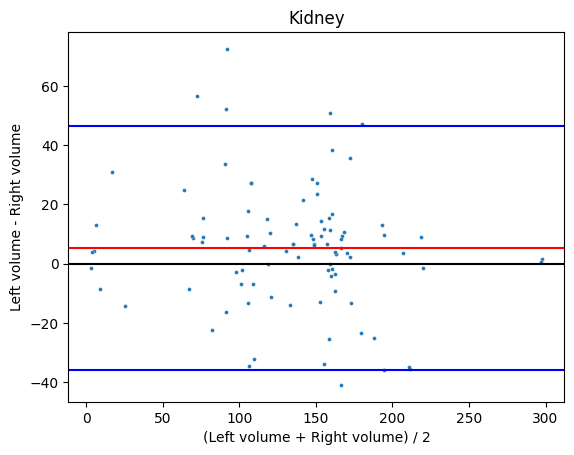

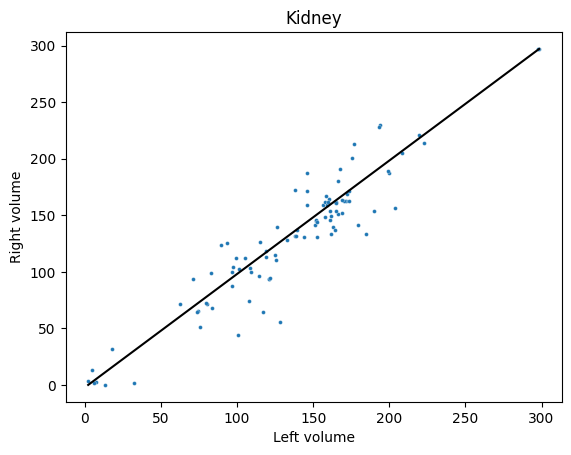

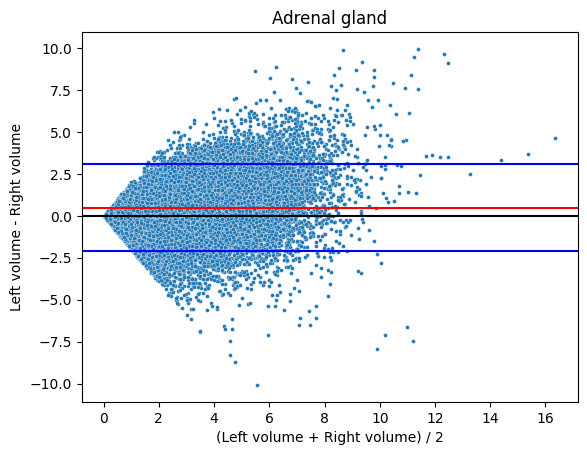

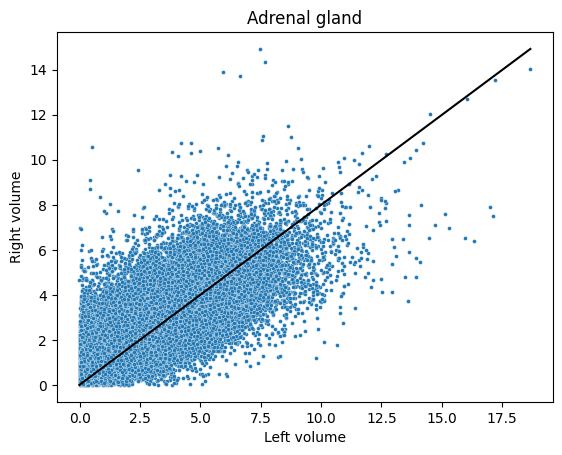

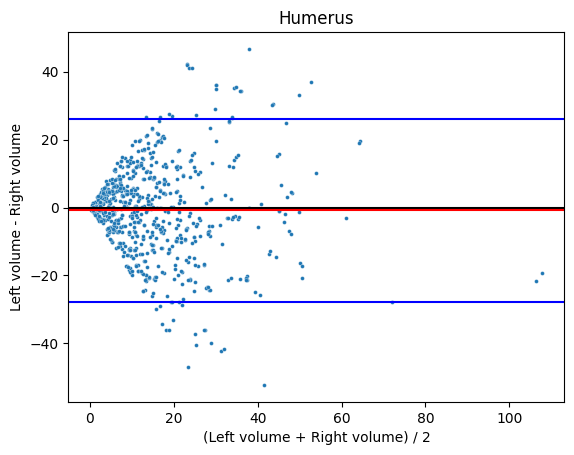

...

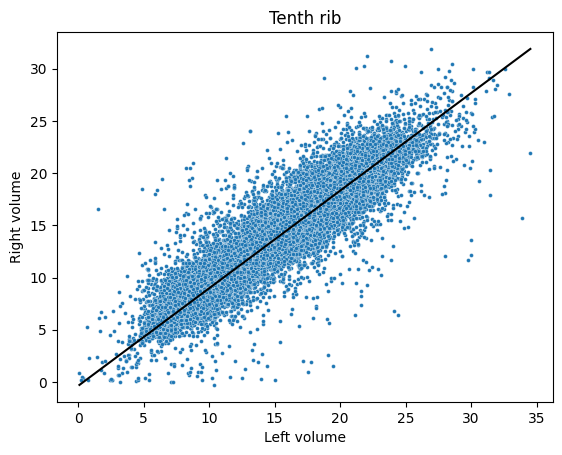

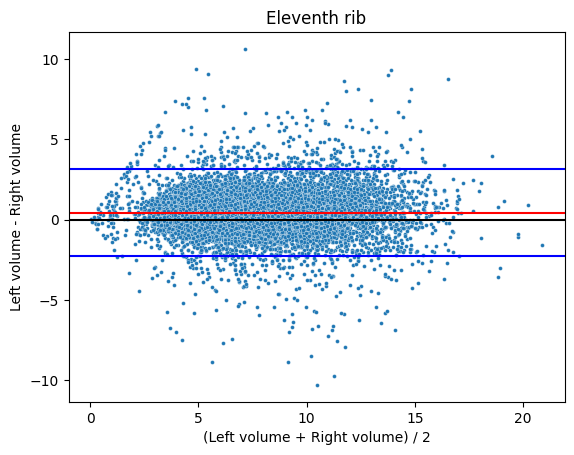

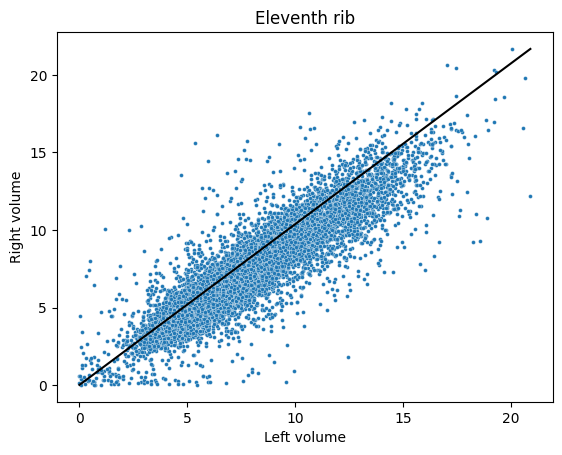

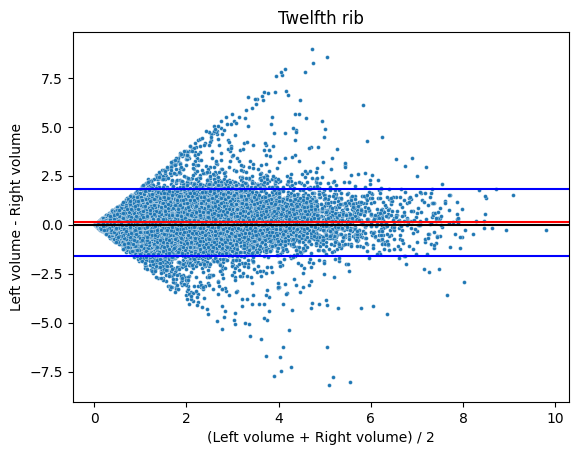

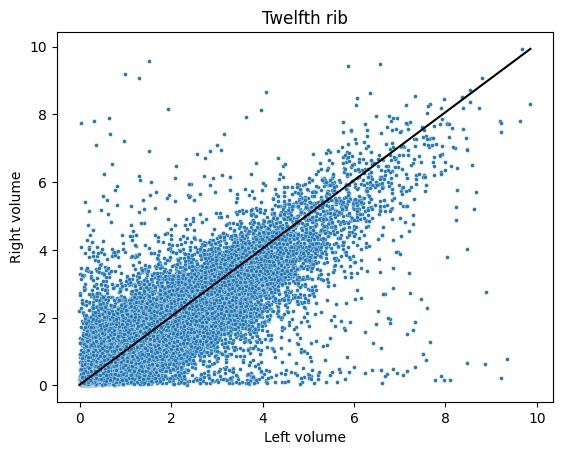

In [ ]:
from matplotlib.backends.backend_pdf import PdfPages

df_csv = pd.DataFrame()
bias_values = []
loa_top_values = []
loa_bottom_values = []
corr_values = []
region_list = []
number_of_patients = []

for region in left_right_organs:

  print('*** region: ' + str(region) + ' ***')

  pdf_file = '/content/pdf_figures_left_vs_right/BlandAltman_and_correlation_plots_' + str(region) + '.pdf'
  print(pdf_file)
  pp = PdfPages(pdf_file)

  # BA plot
  df_plot = create_df_bland_altman(region, feature, table_id, project_name)
  if (df_plot.empty) or (len(df_plot)==1):
    print('no values exist for this organ, skipping')
    continue
  else:
    plot1, bias_value, loa_top, loa_bottom = create_seaborn_plot_bland_altman(df_plot, region)
    number_of_patients.append(len(df_plot))
    region_list.append(region)

  # Get the outliers and only plot these using Bokeh
  df_plot_outliers_top = df_plot[df_plot['y']>loa_top]
  df_plot_outliers_bottom = df_plot[df_plot['y']<loa_bottom]
  df_plot_outliers = pd.concat([df_plot_outliers_top, df_plot_outliers_bottom])
  if not df_plot_outliers.empty:
    print('outliers exist, plotting bokeh plot')
    output_filename = os.path.join("/content/bokeh_figures_left_vs_right/", str(region) + ".html")
    create_bokeh_plot_bland_altman_outliers(df_plot_outliers, bias_value, loa_top, loa_bottom, output_filename)

  # Correlation of L vs R
  plot2, corr_value = create_seaborn_correlation_plot(df_plot, region)

  # Save figures to pdf
  pp.savefig(plot1)
  pp.savefig(plot2)

  # Save values to df_csv
  bias_values.append(bias_value)
  loa_top_values.append(loa_top)
  loa_bottom_values.append(loa_bottom)
  corr_values.append(corr_value)

  pp.close()

In [ ]:
# Save csv
df_csv['region'] = region_list
df_csv['number_of_patients'] = number_of_patients
df_csv['bias'] = bias_values
df_csv['loa_top'] = loa_top_values
df_csv['loa_bottom'] = loa_bottom_values
df_csv['corr'] = corr_values
df_csv.to_csv(corr_values_csv, index=False)

In [ ]:
# Zip files

!zip -r /content/bokeh_figures_left_vs_right.zip /content/bokeh_figures_left_vs_right
!zip -r /content/pdf_figures_left_vs_right.zip /content/pdf_figures_left_vs_right


  adding: content/bokeh_figures_left_vs_right/ (stored 0%)
  adding: content/bokeh_figures_left_vs_right/Kidney.html (deflated 69%)
  adding: content/bokeh_figures_left_vs_right/First rib.html (deflated 82%)
  adding: content/bokeh_figures_left_vs_right/Third rib.html (deflated 84%)
  adding: content/bokeh_figures_left_vs_right/Adrenal gland.html (deflated 83%)
  adding: content/bokeh_figures_left_vs_right/Seventh rib.html (deflated 84%)
  adding: content/bokeh_figures_left_vs_right/Twelfth rib.html (deflated 80%)
  adding: content/bokeh_figures_left_vs_right/Fourth rib.html (deflated 84%)
  adding: content/bokeh_figures_left_vs_right/Scapula.html (deflated 72%)
  adding: content/bokeh_figures_left_vs_right/Fifth rib.html (deflated 84%)
  adding: content/bokeh_figures_left_vs_right/Ninth rib.html (deflated 84%)
  adding: content/bokeh_figures_left_vs_right/Eighth rib.html (deflated 84%)
  adding: content/bokeh_figures_left_vs_right/Humerus.html (deflated 70%)
  adding: content/bokeh_fi

In [ ]:
# Download files

from google.colab import files
files.download("/content/bokeh_figures_left_vs_right.zip")
files.download("/content/pdf_figures_left_vs_right.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# # Outliers from the bokeh plot

# df_plot_outliers_top = df_plot[df_plot['y']>loa_top]
# df_plot_outliers_bottom = df_plot[df_plot['y']<loa_bottom]
# df_plot_outliers = pd.concat([df_plot_outliers_top, df_plot_outliers_bottom])

# create_bokeh_correlation_plot(df_plot_outliers)

## C. Organ volume comparison to literature

Here we compare the volume of segmentations to what we find in the literature. We make sure that we have the entire organ segmented, using Vamsi's query. We also get the age ranges and mean and standard deviation values.

We do the above analysis for the kidney left, kidney right, liver and spleen. Possibly we can do the bones later.

#### Lung lobe volume

Replicate Table 1 and 2 in this paper: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7490509/

We get the volumes of the lung lobes and compare these values to literature.

In [ ]:
def create_df_organ_comparison(region, feature, table_id, project_name, include_laterality=False):

  client = bigquery.Client(project=project_name)

  if (include_laterality):

    query = f"""

        SELECT
          PatientID,
          StudyInstanceUID,
          sourceSegmentedSeriesUID,
          age,
          gender,
          Value,
          lateralityModifier.CodeMeaning as laterality,
          segmentation_completeness_check,
          viewerUrl,
          SeriesNumber
        FROM
          `{table_id}` as clinical_table
        JOIN
          `idc-external-025.terra.segmentation_completeness_table` as segmentation_completeness
        ON
          clinical_table.sourceSegmentedSeriesUID = segmentation_completeness.rssSIUD AND
          clinical_table.lateralityModifier.CodeMeaning = segmentation_completeness.laterality AND
          clinical_table.findingSite.CodeMeaning = segmentation_completeness.bodyPart
        WHERE
          findingSite.CodeMeaning = @region AND
          Quantity.CodeMeaning = @feature AND
          segmentation_completeness_check = 'may_be_segmented_fully'
        ORDER BY
          clinical_table.sourceSegmentedSeriesUID;
          """

  else:

      query = f"""

      SELECT
        PatientID
        StudyInstanceUID,
        sourceSegmentedSeriesUID,
        age,
        gender,
        Value,
        lateralityModifier.CodeMeaning as laterality,
        segmentation_completeness_check,
        viewerUrl,
        SeriesNumber
      FROM
        `{table_id}` as clinical_table
      JOIN
        `idc-external-025.terra.segmentation_completeness_table` as segmentation_completeness
      ON
        clinical_table.sourceSegmentedSeriesUID = segmentation_completeness.rssSIUD AND
        clinical_table.findingSite.CodeMeaning = segmentation_completeness.bodyPart
      WHERE
        findingSite.CodeMeaning = @region AND
        Quantity.CodeMeaning = @feature AND
        segmentation_completeness_check = 'may_be_segmented_fully'
      ORDER BY
        clinical_table.sourceSegmentedSeriesUID;
        """

  job_config = bigquery.QueryJobConfig(query_parameters=[
                                                          bigquery.ScalarQueryParameter("region", "STRING", region),
                                                          bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                          ])
  df = client.query(query, job_config=job_config).to_dataframe()

  return df


In [ ]:
feature = "Approximate volume"
table_id = "idc-external-025.terra.nlst-126k-measurements-clinical-acquisition"

region_list = ["Lower lobe of lung", "Middle lobe of right lung", "Upper lobe of lung"]
laterality_list = [True, False, True]
df_plot = pd.DataFrame()
for region,laterality in zip(region_list,laterality_list):
  df = create_df_organ_comparison(region, feature, table_id, project_name, include_laterality=laterality)
  # include region column
  df['region'] = [region] * len(df)
  df_plot = pd.concat([df,df_plot])

new_column = [np.float32(f) for f in df_plot['Value'].values]
df_plot['Value_numeric'] = new_column
df_plot['Value_numeric'] = df_plot['Value_numeric'] / 1000

In [ ]:
# create new column with laterality joined

# first if laterality is None, set to ""
laterality = df_plot["laterality"].values
# laterality = ["" for f in laterality if f is None else f]
laterality = ["" if f is None else f for f in laterality]

df_plot["region_joined"] = [f + " " + g for f,g in zip(df_plot['region'].values,laterality)]

Text(0, 0.5, 'Voxel volume in mL')

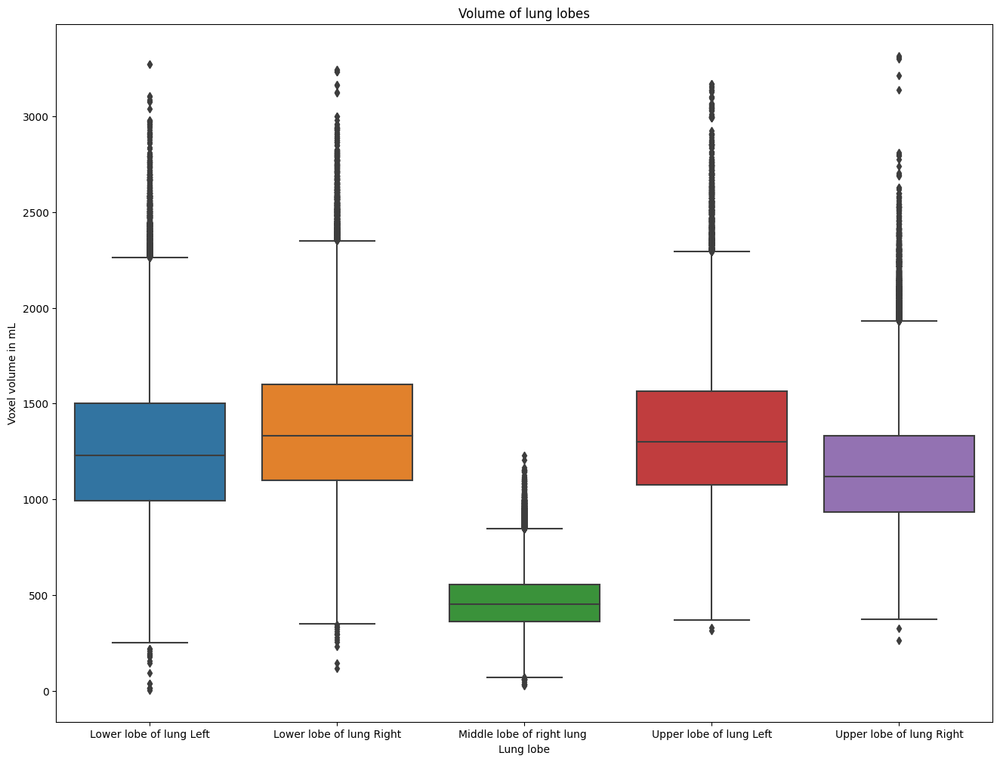

In [ ]:
fig = plt.figure(figsize=(16, 12))
region_list = sorted(set(df_plot['region_joined'].values))
ax = sns.boxplot(df_plot, x = "region_joined", y = "Value_numeric", order = region_list)
ax.set_title('Volume of lung lobes')
ax.set_xlabel('Lung lobe')
ax.set_ylabel('Voxel volume in mL')
# plt.xticks(rotation=45)


In [ ]:
# For each lung lobe + laterality, calculate the combination
# get the mean and standard deviation, and min and max
df_min = []
df_max = []
df_mean = []
df_stddev = []
for region in region_list:
  df = df_plot[df_plot["region_joined"]==region]
  df_min.append(np.min(df["Value_numeric"].values))
  df_max.append(np.max(df["Value_numeric"].values))
  df_mean.append(np.mean(df["Value_numeric"].values))
  df_stddev.append(np.std(df["Value_numeric"].values))
df_stats = pd.DataFrame()
df_stats['region'] = region_list
df_stats['min'] = df_min
df_stats['max'] = df_max
df_stats['mean'] = df_mean
df_stats['stddev'] = df_stddev

df_stats

,region,min,max,mean,stddev
0,Lower lobe of lung Left,4.752000,3269.673096,1263.535034,373.570770
1,Lower lobe of lung Right,118.043999,3244.022949,1362.978271,369.136108
2,Middle lobe of right lung,27.108000,1231.281006,465.646851,140.638138
3,Upper lobe of lung Left,313.794006,3168.368896,1338.421387,348.819458
4,Upper lobe of lung Right,264.789001,3315.572998,1150.974609,296.658569


In [ ]:
# Do the same but combine for the left lung and right lung

region_list_lr = ["Left", "Right"]
df_min = []
df_max = []
df_mean = []
df_stddev = []
for region in region_list_lr:
  df = df_plot[df_plot['region_joined'].str.contains(region)]
  df_min.append(np.min(df["Value_numeric"].values))
  df_max.append(np.max(df["Value_numeric"].values))
  df_mean.append(np.mean(df["Value_numeric"].values))
  df_stddev.append(np.std(df["Value_numeric"].values))
df_stats_lr = pd.DataFrame()
df_stats_lr['region'] = region_list_lr
df_stats_lr['min'] = df_min
df_stats_lr['max'] = df_max
df_stats_lr['mean'] = df_mean
df_stats_lr['stddev'] = df_stddev

df_stats_lr

,region,min,max,mean,stddev
0,Left,4.752000,3269.673096,1300.942749,363.353058
1,Right,118.043999,3315.572998,1256.103760,350.957062


In [ ]:
# same but for total
df_min = np.min(df_plot['Value_numeric'].values)
df_max = np.max(df_plot['Value_numeric'].values)
df_mean = np.mean(df_plot['Value_numeric'].values)
df_stddev = np.std(df_plot['Value_numeric'].values)
df_whole = pd.DataFrame()
df_whole['region'] = ["Whole"]
df_whole['min'] = [df_min]
df_whole['max'] = [df_max]
df_whole['mean'] = [df_mean]
df_whole['stddev'] = [df_stddev]

df_whole

,region,min,max,mean,stddev
0,Whole,4.752,3315.572998,1112.594604,461.874084


In [ ]:
# Outlier analysis of Left lower lobe

# df_plot[df_plot['region_joined']=="Lower lobe of lung Left"]
df_plot_lower_lobe_lung_left = df_plot[df_plot['region_joined']=="Lower lobe of lung Left"]
df_plot_lower_lobe_lung_left.loc[(df_plot_lower_lobe_lung_left['Value_numeric'] < 5)]


# df.loc[(df['column_name'] >= A) & (df['column_name'] <= B)]


,PatientID,StudyInstanceUID,sourceSegmentedSeriesUID,age,gender,Value,laterality,segmentation_completeness_check,viewerUrl,SeriesNumber,region,Value_numeric,region_joined
37946,109089,1.2.840.113654.2.55.25241986681739796863976100...,1.2.840.113654.2.55.17035339313620575728935601...,59,F,4752.000000000,Left,may_be_segmented_fully,https://idc-tester-dk-2-server.web.app/viewer/...,5,Lower lobe of lung,4.752,Lower lobe of lung Left


In [ ]:
# Total values

num_patients = len(set(df_plot['PatientID'].values))
num_series = len(set(df_plot['sourceSegmentedSeriesUID'].values))
df_calc = df_plot.drop_duplicates(['PatientID'])
percentage_males = len(df_calc[df_calc['gender']=="M"]) / len(df_calc)
age_mean = np.mean(df_calc["age"].values)
age_stddev = np.std(df_calc["age"].values)

print("num_patients: " + str(num_patients))
print('num_series: ' + str(num_series))
print("percentage_males: " + str(percentage_males))
print('age_mean: ' + str(age_mean))
print('age_stddev: ' + str(age_stddev))

num_patients: 26193
num_series: 125707
percentage_males: 0.5908830603596381
age_mean: 61.42660252739282
age_stddev: 5.023995198059138


#### (OLD) Vertebrae volume

In [ ]:
def create_df_organ_comparison(region, feature, table_id, project_name, include_laterality=False):

  client = bigquery.Client(project=project_name)

  if (include_laterality):

    query = f"""

        SELECT
          StudyInstanceUID,
          sourceSegmentedSeriesUID,
          age,
          gender,
          Value,
          lateralityModifier.CodeMeaning as laterality,
          segmentation_completeness_check,
          viewerUrl,
          SeriesNumber
        FROM
          `{table_id}` as clinical_table
        JOIN
          `idc-external-025.terra.segmentation_completeness_table` as segmentation_completeness
        ON
          clinical_table.sourceSegmentedSeriesUID = segmentation_completeness.rssSIUD AND
          clinical_table.lateralityModifier.CodeMeaning = segmentation_completeness.laterality AND
          clinical_table.findingSite.CodeMeaning = segmentation_completeness.bodyPart
        WHERE
          findingSite.CodeMeaning = @region AND
          Quantity.CodeMeaning = @feature AND
          segmentation_completeness_check = 'may_be_segmented_fully'
        ORDER BY
          clinical_table.sourceSegmentedSeriesUID;
          """

  else:

      query = f"""

      SELECT
        StudyInstanceUID,
        sourceSegmentedSeriesUID,
        age,
        gender,
        Value,
        lateralityModifier.CodeMeaning as laterality,
        segmentation_completeness_check,
        viewerUrl,
        SeriesNumber
      FROM
        `{table_id}` as clinical_table
      JOIN
        `idc-external-025.terra.segmentation_completeness_table` as segmentation_completeness
      ON
        clinical_table.sourceSegmentedSeriesUID = segmentation_completeness.rssSIUD AND
        clinical_table.findingSite.CodeMeaning = segmentation_completeness.bodyPart
      WHERE
        findingSite.CodeMeaning = @region AND
        Quantity.CodeMeaning = @feature AND
        segmentation_completeness_check = 'may_be_segmented_fully'
      ORDER BY
        clinical_table.sourceSegmentedSeriesUID;
        """

  job_config = bigquery.QueryJobConfig(query_parameters=[
                                                          bigquery.ScalarQueryParameter("region", "STRING", region),
                                                          bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                          ])
  df = client.query(query, job_config=job_config).to_dataframe()

  return df


In [ ]:
def create_df_organ_comparison_search(region_search, feature, table_id, project_name, include_laterality=False):

  client = bigquery.Client(project=project_name)

  if (include_laterality):

    query = f"""

        SELECT
          StudyInstanceUID,
          sourceSegmentedSeriesUID,
          age,
          gender,
          findingSite.CodeMeaning as findingSite_CodeMeaning,
          Value,
          lateralityModifier.CodeMeaning as laterality,
          segmentation_completeness_check,
          viewerUrl,
          SeriesNumber
        FROM
          `{table_id}` as clinical_table
        JOIN
          `idc-external-025.terra.segmentation_completeness_table` as segmentation_completeness
        ON
          clinical_table.sourceSegmentedSeriesUID = segmentation_completeness.rssSIUD AND
          clinical_table.lateralityModifier.CodeMeaning = segmentation_completeness.laterality AND
          clinical_table.findingSite.CodeMeaning = segmentation_completeness.bodyPart
        WHERE
          # findingSite.CodeMeaning = @region AND
          findingSite.CodeMeaning LIKE '%vertebra%' AND
          Quantity.CodeMeaning = @feature AND
          segmentation_completeness_check = 'may_be_segmented_fully'
        ORDER BY
          clinical_table.sourceSegmentedSeriesUID;
          """

  else:

      query = f"""

      SELECT
        StudyInstanceUID,
        sourceSegmentedSeriesUID,
        age,
        gender,
        findingSite.CodeMeaning as findingSite_CodeMeaning,
        Value,
        lateralityModifier.CodeMeaning as laterality,
        segmentation_completeness_check,
        viewerUrl,
        SeriesNumber
      FROM
        `{table_id}` as clinical_table
      JOIN
        `idc-external-025.terra.segmentation_completeness_table` as segmentation_completeness
      ON
        clinical_table.sourceSegmentedSeriesUID = segmentation_completeness.rssSIUD AND
        clinical_table.findingSite.CodeMeaning = segmentation_completeness.bodyPart
      WHERE
        # findingSite.CodeMeaning = @region AND
        findingSite.CodeMeaning LIKE '%vertebra%' AND
        Quantity.CodeMeaning = @feature AND
        segmentation_completeness_check = 'may_be_segmented_fully'
      ORDER BY
        clinical_table.sourceSegmentedSeriesUID;
        """

  job_config = bigquery.QueryJobConfig(query_parameters=[
                                                          bigquery.ScalarQueryParameter("region_search", "STRING", region_search),
                                                          bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                          ])
  df = client.query(query, job_config=job_config).to_dataframe()

  return df


In [ ]:
feature = "Approximate volume"
table_id = "idc-external-025.terra.nlst-126k-measurements-clinical-acquisition"


In [ ]:
### Kidney ###

region = "Kidney"
df_plot = create_df_organ_comparison(region, feature, table_id, project_name, include_laterality=True)
new_column = [np.float32(f) for f in df_plot['Value'].values]
df_plot['Value_numeric'] = new_column
df_plot['Value_numeric'] = df_plot['Value_numeric'] / 1000

num_series = len(set(df_plot['sourceSegmentedSeriesUID'].values))
print('num_series: ' + str(num_series))

df_plot_left = df_plot[df_plot['laterality']=="Left"]
df_plot_right = df_plot[df_plot['laterality']=="Right"]
print('kidney left num series: ' + str(len(df_plot_left)))
print('kidney right num series: ' + str(len(df_plot_right)))

left_males = df_plot_left[df_plot_left['gender']=='M']['Value_numeric'].values
left_females = df_plot_left[df_plot_left['gender']=='F']['Value_numeric'].values
right_males = df_plot_right[df_plot_right['gender']=='M']['Value_numeric'].values
right_females = df_plot_right[df_plot_right['gender']=='F']['Value_numeric'].values

left_males_mean = np.mean(left_males)
left_males_stddev = np.std(left_males)
left_females_mean = np.mean(left_females)
left_females_stddev = np.std(left_females)

right_males_mean = np.mean(right_males)
right_males_stddev = np.std(right_males)
right_females_mean = np.mean(right_females)
right_females_stddev = np.std(right_females)

print('kidney left males mean: ' + str(left_males_mean) + ' stddev: ' + str(left_males_stddev))
print('kidney left females mean: ' + str(left_females_mean) + ' stddev: ' + str(left_females_stddev))
print('kidney right males mean: ' + str(right_males_mean) + ' stddev: ' + str(right_males_stddev))
print('kidney right females mean: ' + str(right_females_mean) + ' stddev: ' + str(right_females_stddev))


num_series: 511
kidney left num series: 341
kidney right num series: 266
kidney left males mean: 118.164825 stddev: 73.800354
kidney left females mean: 82.85511 stddev: 48.87062
kidney right males mean: 117.359375 stddev: 77.18215
kidney right females mean: 85.88005 stddev: 49.243988


In [ ]:
### Spleen ###

region = "Spleen"
df_plot = create_df_organ_comparison(region, feature, table_id, project_name, include_laterality=False)
new_column = [np.float32(f) for f in df_plot['Value'].values]
df_plot['Value_numeric'] = new_column
df_plot['Value_numeric'] = df_plot['Value_numeric'] / 1000

num_series = len(set(df_plot['sourceSegmentedSeriesUID'].values))
print('num_series: ' + str(num_series))

males = df_plot[df_plot['gender']=='M']['Value_numeric'].values
females = df_plot[df_plot['gender']=='F']['Value_numeric'].values

males_mean = np.mean(males)
males_stddev = np.std(males)
females_mean = np.mean(females)
females_stddev = np.std(females)

print('spleen males mean: ' + str(males_mean) + ' stddev: ' + str(males_stddev))
print('spleen females mean: ' + str(females_mean) + ' stddev: ' + str(females_stddev))


num_series: 48632
spleen males mean: 196.86768 stddev: 83.17003
spleen females mean: 143.68916 stddev: 61.446053


In [ ]:
### Liver ###

region = "Liver"
df_plot = create_df_organ_comparison(region, feature, table_id, project_name, include_laterality=False)
new_column = [np.float32(f) for f in df_plot['Value'].values]
df_plot['Value_numeric'] = new_column
df_plot['Value_numeric'] = df_plot['Value_numeric'] / 1000

num_series = len(set(df_plot['sourceSegmentedSeriesUID'].values))
print('num_series: ' + str(num_series))

males = df_plot[df_plot['gender']=='M']['Value_numeric'].values
females = df_plot[df_plot['gender']=='F']['Value_numeric'].values

males_mean = np.mean(males)
males_stddev = np.std(males)
females_mean = np.mean(females)
females_stddev = np.std(females)

print('liver males mean: ' + str(males_mean) + ' stddev: ' + str(males_stddev))
print('liver females mean: ' + str(females_mean) + ' stddev: ' + str(females_stddev))

num_series: 1467
liver males mean: 1703.3385 stddev: 355.95856
liver females mean: 1465.7146 stddev: 348.17947


In [ ]:
# Distribution of volumes of vertebra - all. Compare to literature.

region_search = "vertebra"
df_plot = create_df_organ_comparison_search(region_search, feature, table_id, project_name, include_laterality=False)
new_column = [np.float32(f) for f in df_plot['Value'].values]
df_plot['Value_numeric'] = new_column
df_plot['Value_numeric'] = df_plot['Value_numeric'] / 1000

In [ ]:
region_order = set(df_plot['findingSite_CodeMeaning'].values)
from natsort import natsorted, ns
region_order = natsorted(region_order, key=lambda y: y.lower())

region_order_cervical = []
[region_order_cervical.append(f) for f in region_order if f.startswith("C")]
region_order_thoracic = []
[region_order_thoracic.append(f) for f in region_order if f.startswith("T")]
region_order_lumbar = []
[region_order_lumbar.append(f) for f in region_order if f.startswith("L")]

region_order_list = []
[region_order_list.append(f) for f in region_order_cervical]
[region_order_list.append(f) for f in region_order_thoracic]
[region_order_list.append(f) for f in region_order_lumbar]
print(region_order_list)


['C1 vertebra', 'C2 vertebra', 'C3 vertebra', 'C4 vertebra', 'C5 vertebra', 'C6 vertebra', 'C7 vertebra', 'T1 vertebra', 'T2 vertebra', 'T3 vertebra', 'T4 vertebra', 'T5 vertebra', 'T6 vertebra', 'T7 vertebra', 'T8 vertebra', 'T9 vertebra', 'T10 vertebra', 'T11 vertebra', 'T12 vertebra', 'L1 vertebra', 'L2 vertebra', 'L3 vertebra', 'L4 vertebra', 'L5 vertebra']


Text(0.5, 0, 'Vertebra')

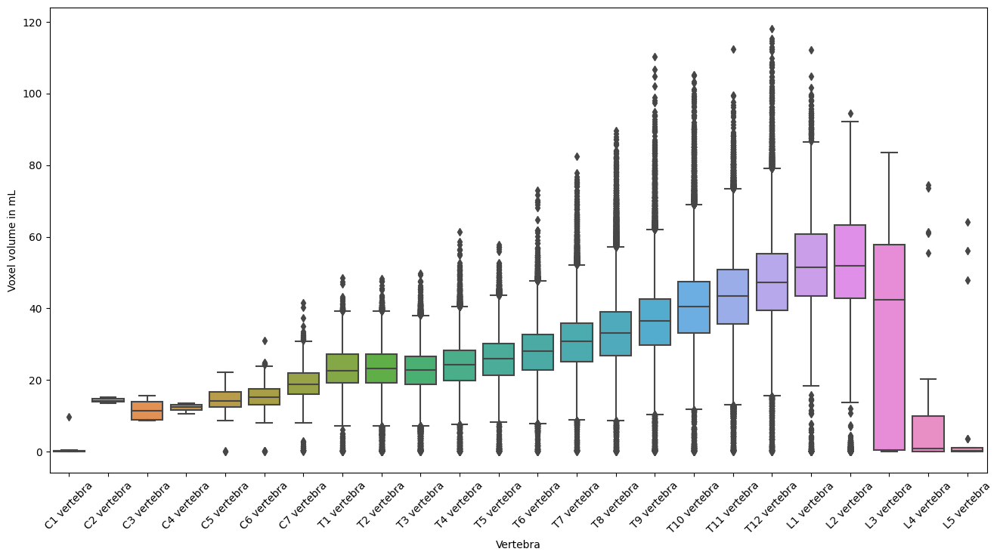

In [ ]:
fig = plt.figure(figsize=(16, 8))

# ax = sns.violinplot(df_plot,x="findingSite_CodeMeaning",y="Value_numeric", order=region_order_list)
# plt.xticks(rotation=45)
# ax.set_ylabel("Voxel volume in mL")
# ax.set_xlabel("Vertebra")

ax = sns.boxplot(data=df_plot, x="findingSite_CodeMeaning", y="Value_numeric", order=region_order_list)
plt.xticks(rotation=45)
ax.set_ylabel("Voxel volume in mL")
ax.set_xlabel("Vertebra")


In [ ]:
# Return a df
# For each vertebra, get the median value and min and max. And return a sample OHIF url for each.
# So the table should be num_vertebra vs 3

# Group by vertebra
grouped = df_plot.groupby("findingSite_CodeMeaning")
# Calculate the median volume and stddev for each vertebra
median_volume = grouped['Value_numeric'].transform('median')
stddev_volume = grouped['Value_numeric'].transform('std')
# Add the median and stddev columns into the dataframe
df_plot['median'] = median_volume.values
df_plot['stddev'] = stddev_volume.values
# Calculate the difference between the median and each row
deviation = df_plot['Value_numeric'] - median_volume
# Get the maximum positive deviation
max_positive_deviation = df_plot.loc[deviation.groupby(df_plot['findingSite_CodeMeaning']).idxmax()]
# Get the minimum deviation - should be close to the actual median
min_deviation = df_plot.loc[deviation.groupby(df_plot['findingSite_CodeMeaning']).idxmin()]

max_deviation_df = max_positive_deviation.copy(deep=True)
max_deviation_df['deviation'] = len(max_deviation_df) * ['max']
min_deviation_df = min_deviation.copy(deep=True)
min_deviation_df['deviation'] = len(min_deviation_df) * ['min']
deviation_df = pd.concat([min_deviation_df, max_deviation_df])
deviation_df = deviation_df.drop(labels=["StudyInstanceUID", "sourceSegmentedSeriesUID", "age","gender","Value", "laterality", "segmentation_completeness_check"],axis=1)
deviation_df.to_csv("/content/deviation_vertebrae_volume.csv")

In [ ]:
# Checking an outlier in T8 vertebra with max:
# T8 covers more than 1 vertebra -
# https://idc-tester-dk-2-server.web.app/viewer/1.3.6.1.4.1.14519.5.2.1.7009.9004.236003780683445052412666835881!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series

#### Vertebral volume

We will use three checks:
1. segmentation completeness for each vertebrae
2. keep series where there are <=2 vertebrae for >50% slices
3. remove outliers from the volumes

In [28]:
# Use Vamsi’s check -- this will return the patients where at the most there are 2 vertebraes on a slice

def create_df_organ_comparison_search_with_segmentations_at_slice_check(region1, region2, feature, table_id, project_name):

  client = bigquery.Client(project=project_name)

  query = f"""

  SELECT
    clinical_table.StudyInstanceUID,
    sourceSegmentedSeriesUID,
    age,
    gender,
    findingSite.CodeMeaning as findingSite_CodeMeaning,
    Value,
    lateralityModifier.CodeMeaning as laterality,
    segmentation_completeness_check,
    segmentation_completeness.viewerUrl,
    segmentation_completeness.SeriesNumber
  FROM
    `{table_id}` as clinical_table
  JOIN
    `idc-external-025.terra.segmentation_completeness_table` as segmentation_completeness
  ON
    clinical_table.sourceSegmentedSeriesUID = segmentation_completeness.rssSIUD AND
    clinical_table.findingSite.CodeMeaning = segmentation_completeness.bodyPart
  JOIN
    # `idc-external-025.terra.segmentations-at-slice` as segmentations_at_slice
    `idc-external-025.terra.overlap_check_threshold_two_vertebra` as overlap_check_threshold_two_vertebra
  ON
    # segmentations_at_slice.rssSIUD = clinical_table.sourceSegmentedSeriesUID
    overlap_check_threshold_two_vertebra.rssSIUD = clinical_table.sourceSegmentedSeriesUID
  WHERE
    findingSite.CodeMeaning = @region1 AND
    Quantity.CodeMeaning = @feature AND
    segmentation_completeness_check = 'may_be_segmented_fully' AND # from segmentation_completeness table
    # segmentations = @region2 # from segmentations_at_slice table
    # REGEXP_CONTAINS(segmentations, @region2) AND # region2 should be in substring
    # array_length(regexp_extract_all(segmentations, r'\/')) < 2 # only include vertebra where either 1 or 2 are on slice
    overlap_check_threshold_two_vertebra.classifier = "<=2"
  ORDER BY
    clinical_table.sourceSegmentedSeriesUID;
    """

  job_config = bigquery.QueryJobConfig(query_parameters=[
                                                          bigquery.ScalarQueryParameter("region1", "STRING", region1),
                                                          bigquery.ScalarQueryParameter("region2", "STRING", region2),
                                                          bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                          ])
  df = client.query(query, job_config=job_config).to_dataframe()

  return df

In [31]:
region1_list = ['C1 vertebra', 'C2 vertebra', 'C3 vertebra', 'C4 vertebra', 'C5 vertebra', 'C6 vertebra', 'C7 vertebra', 'T1 vertebra', 'T2 vertebra', 'T3 vertebra', 'T4 vertebra', 'T5 vertebra', 'T6 vertebra', 'T7 vertebra', 'T8 vertebra', 'T9 vertebra', 'T10 vertebra', 'T11 vertebra', 'T12 vertebra', 'L1 vertebra', 'L2 vertebra', 'L3 vertebra', 'L4 vertebra', 'L5 vertebra']
region2_list = ['Vertebrae C1', 'Vertebrae C2', 'Vertebrae C3', 'Vertebrae C4', 'Vertebrae C5', 'Vertebrae C6', 'Vertebrae C7', 'Vertebrae T1', 'Vertebrae T2', 'Vertebrae T3', 'Vertebrae T4', 'Vertebrae T5', 'Vertebrae T6', 'Vertebrae T7', 'Vertebrae T8', 'Vertebrae T9', 'Vertebrae T10', 'Vertebrae T11', 'Vertebrae T12', 'Vertebrae L1', 'Vertebrae L2', 'Vertebrae L3', 'Vertebrae L4', 'Vertebrae L5']
feature = "Approximate volume"
table_id = "idc-external-025.terra.nlst-126k-measurements-clinical-acquisition"
df_plot = pd.DataFrame()

for region1,region2 in zip(region1_list,region2_list):
  print(region1)
  df = create_df_organ_comparison_search_with_segmentations_at_slice_check(region1, region2, feature, table_id, project_name)
  df_plot = pd.concat([df_plot,df])

new_column = [np.float32(f) for f in df_plot['Value'].values]
df_plot['Value_numeric'] = new_column
df_plot['Value_numeric'] = df_plot['Value_numeric'] / 1000


C1 vertebra
C2 vertebra
C3 vertebra
C4 vertebra
C5 vertebra
C6 vertebra
C7 vertebra
T1 vertebra
T2 vertebra
T3 vertebra
T4 vertebra
T5 vertebra
T6 vertebra
T7 vertebra
T8 vertebra
T9 vertebra
T10 vertebra
T11 vertebra
T12 vertebra
L1 vertebra
L2 vertebra
L3 vertebra
L4 vertebra
L5 vertebra


Text(0.5, 0, 'Vertebra')

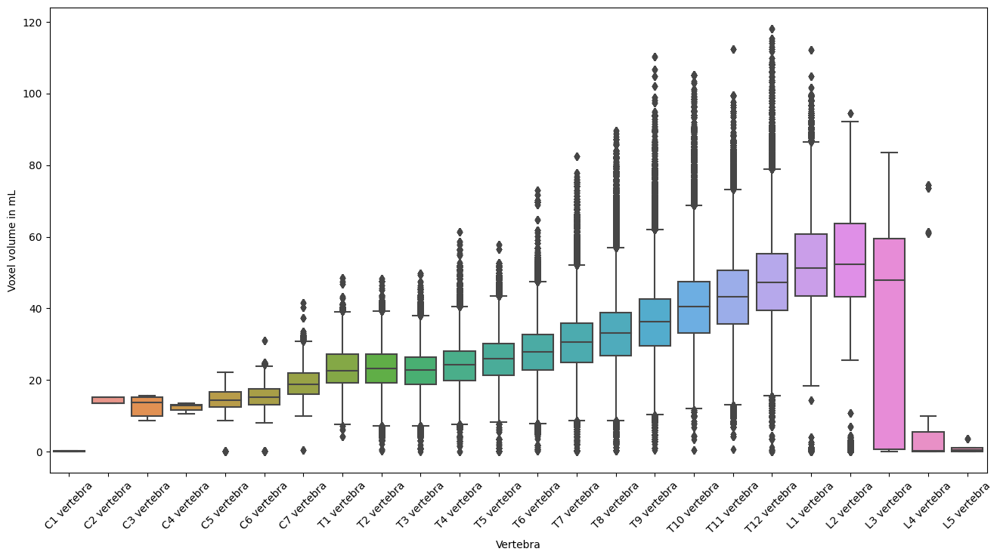

In [32]:
fig = plt.figure(figsize=(16, 8))

# ax = sns.violinplot(df_plot,x="findingSite_CodeMeaning",y="Value_numeric", order=region_order_list)
# plt.xticks(rotation=45)
# ax.set_ylabel("Voxel volume in mL")
# ax.set_xlabel("Vertebra")

ax = sns.boxplot(data=df_plot, x="findingSite_CodeMeaning", y="Value_numeric", order=region1_list)
plt.xticks(rotation=45)
ax.set_ylabel("Voxel volume in mL")
ax.set_xlabel("Vertebra")

Now add the third heuristic, by removing the outliers

In [43]:
grouped = df_plot.groupby("findingSite_CodeMeaning")

# Calculate the median volume and stddev for each vertebra
median_volume = grouped['Value_numeric'].transform('median')
stddev_volume = grouped['Value_numeric'].transform('std')
# Add the median and stddev columns into the dataframe
df_plot['median'] = median_volume.values
df_plot['stddev'] = stddev_volume.values

# Calculate Q1 and Q3
q1_volume = grouped['Value_numeric'].transform('quantile', q=0.25)
q3_volume = grouped['Value_numeric'].transform('quantile', q=0.75)
# Add Q1 and Q3 to dataframe
df_plot['q1'] = q1_volume.values
df_plot['q3'] = q3_volume.values

# Calculate the outlier min and max
df_plot['outlier_min_volume'] = df_plot['q1'].values - (1.5 * (df_plot['q3'].values - df_plot['q1'].values))
df_plot['outlier_max_volume'] = df_plot['q3'].values + (1.5 * (df_plot['q3'].values - df_plot['q1'].values))

print('df_plot: ' + str(len(df_plot)))

# Remove rows from df_plot that fall below outlier_min_volume or above outlier_max_volume
df_plot_keep = df_plot.copy(deep=True)
df_plot_keep = df_plot_keep.query('Value_numeric > outlier_min_volume')
df_plot_keep = df_plot_keep.query('Value_numeric < outlier_max_volume')

print('df_plot_keep: ' + str(len(df_plot_keep)))


df_plot: 14562343
df_plot_keep: 14504642


Here we plot without the outliers, aka make the whis a high value.

We have already removed the outliers, so if we keep whis=1.5, then new outliers will be calculated from the new smaller range of data.

Text(0.5, 0, 'Vertebra')

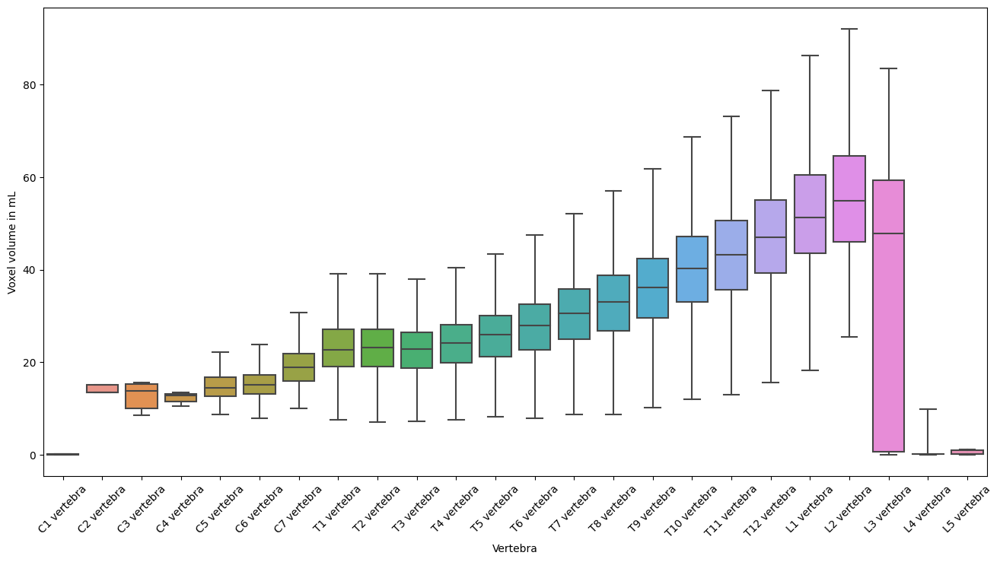

In [46]:
fig = plt.figure(figsize=(16, 8))

ax = sns.boxplot(data=df_plot_keep, x="findingSite_CodeMeaning", y="Value_numeric", order=region1_list, whis=100)
plt.xticks(rotation=45)
ax.set_ylabel("Voxel volume in mL")
ax.set_xlabel("Vertebra")

Get the deviation

In [90]:
# Now from this one get the min and max deviation to examine

# Calculate the difference between the median and each row
# deviation = df_plot['Value_numeric'] - median_volume
# deviation = np.abs(df_plot_keep['Value_numeric'] - median_volume)

deviation = np.abs(df_plot_keep['Value_numeric'] - df_plot_keep['median'])
deviation_df = pd.DataFrame()
deviation_df['findingSite_CodeMeaning'] = df_plot_keep['findingSite_CodeMeaning']
deviation_df['deviation'] = deviation

df_plot_keep['deviation'] = deviation

# For each vertebrae get the min and max absolute value of deviation
# regions = set(deviation_df['findingSite_CodeMeaning'].values)
# from natsort import natsorted, ns
# regions = natsorted(regions, key=lambda y: y.lower())

min_max_deviation_df = pd.DataFrame()
min_max_deviation_values = []

# for region in regions:
for region in region1_list:
  df_group = df_plot_keep[df_plot_keep['findingSite_CodeMeaning']==region]
  min_index = np.argmin(df_group['deviation'].values)
  max_index = np.argmax(df_group['deviation'].values)
  min_row_df = df_group.iloc[[min_index]]
  max_row_df = df_group.iloc[[max_index]]
  min_row_df['deviation_direction'] = ['min']
  max_row_df['deviation_direction'] = ['max']
  min_max_deviation_df = pd.concat([min_max_deviation_df, min_row_df, max_row_df])

In [91]:
min_max_deviation_df

,StudyInstanceUID,sourceSegmentedSeriesUID,age,gender,findingSite_CodeMeaning,Value,laterality,segmentation_completeness_check,viewerUrl,SeriesNumber,Value_numeric,median,stddev,q1,q3,outlier_min_volume,outlier_max_volume,deviation,deviation_direction
0,1.2.840.113654.2.55.12751336006333983111904862...,1.2.840.113654.2.55.24746933308648769320703539...,61,M,C1 vertebra,108.000000000,None,may_be_segmented_fully,https://idc-tester-dk-2-server.web.app/viewer/...,2,0.108000,0.108000,0.034381,0.081000,0.162000,-0.040500,0.283500,0.000000,min
12,1.2.840.113654.2.55.13947783756465045505535776...,1.2.840.113654.2.55.26738599196204207818909971...,56,M,C1 vertebra,162.000000000,None,may_be_segmented_fully,https://idc-tester-dk-2-server.web.app/viewer/...,3,0.162000,0.108000,0.034381,0.081000,0.162000,-0.040500,0.283500,0.054000,max
7,1.2.840.113654.2.55.12347950975219871534903642...,1.2.840.113654.2.55.28881081495188112908961721...,72,F,C2 vertebra,13554.000000000,None,may_be_segmented_fully,https://idc-tester-dk-2-server.web.app/viewer/...,3,13.554000,13.554000,0.821825,13.554000,15.174000,11.124000,17.604000,0.000000,min
0,1.2.840.113654.2.55.12347950975219871534903642...,1.2.840.113654.2.55.16768696469290993667013505...,72,F,C2 vertebra,15174.000000000,None,may_be_segmented_fully,https://idc-tester-dk-2-server.web.app/viewer/...,4,15.174000,13.554000,0.821825,13.554000,15.174000,11.124000,17.604000,1.620000,max
50,1.3.6.1.4.1.14519.5.2.1.7009.9004.223891007165...,1.3.6.1.4.1.14519.5.2.1.7009.9004.897431168120...,56,M,C3 vertebra,14013.000000000,None,may_be_segmented_fully,https://idc-tester-dk-2-server.web.app/viewer/...,2,14.013000,13.770000,2.658199,9.983250,15.268500,2.055375,23.196375,0.242999,min
23,1.2.840.113654.2.55.12347950975219871534903642...,1.2.840.113654.2.55.28881081495188112908961721...,72,F,C3 vertebra,8613.000000000,None,may_be_segmented_fully,https://idc-tester-dk-2-server.web.app/viewer/...,3,8.613000,13.770000,2.658199,9.983250,15.268500,2.055375,23.196375,5.157001,max
146,1.3.6.1.4.1.14519.5.2.1.7009.9004.370104687156...,1.3.6.1.4.1.14519.5.2.1.7009.9004.103362965596...,65,M,C4 vertebra,12852.000000000,None,may_be_segmented_fully,https://idc-tester-dk-2-server.web.app/viewer/...,4,12.852000,12.852000,1.073513,11.529000,13.176000,9.058501,15.646499,0.000000,min
39,1.2.840.113654.2.55.20927216293155246231227703...,1.2.840.113654.2.55.21158389594277025231325672...,61,M,C4 vertebra,10449.000000000,None,may_be_segmented_fully,https://idc-tester-dk-2-server.web.app/viewer/...,4,10.449000,12.852000,1.073513,11.529000,13.176000,9.058501,15.646499,2.403000,max
1107,1.2.840.113654.2.55.30977553626858667148810132...,1.2.840.113654.2.55.34705714056491558887946499...,67,F,C5 vertebra,14418.000000000,None,may_be_segmented_fully,https://idc-tester-dk-2-server.web.app/viewer/...,5,14.418000,14.418000,3.587311,12.447000,16.767000,5.966999,23.247001,0.000000,min
1205,1.2.840.113654.2.55.25583231401295934329056470...,1.2.840.113654.2.55.59587339256730176388550624...,60,M,C5 vertebra,22167.000000000,None,may_be_segmented_fully,https://idc-tester-dk-2-server.web.app/viewer/...,6,22.167000,14.418000,3.587311,12.447000,16.767000,5.966999,23.247001,7.749000,max


In [92]:
# deviation_df = deviation_df.drop(labels=["StudyInstanceUID", "sourceSegmentedSeriesUID", "age","gender","Value", "laterality", "segmentation_completeness_check"],axis=1)
min_max_deviation_df.to_csv("/content/deviation_vertebrae_volume.csv")

In [ ]:

# grouped = df_plot.groupby("findingSite_CodeMeaning")
# # Calculate the median volume and stddev for each vertebra
# median_volume = grouped['Value_numeric'].transform('median')
# stddev_volume = grouped['Value_numeric'].transform('std')
# # Add the median and stddev columns into the dataframe
# df_plot['median'] = median_volume.values
# df_plot['stddev'] = stddev_volume.values
# # Calculate the difference between the median and each row
# # deviation = df_plot['Value_numeric'] - median_volume
# deviation = np.abs(df_plot['Value_numeric'] - median_volume)
# deviation_df = pd.DataFrame()
# deviation_df['findingSite_CodeMeaning'] = df_plot['findingSite_CodeMeaning']
# deviation_df['deviation'] = deviation

# df_plot['deviation'] = deviation

# # For each vertebrae get the min and max absolute value of deviation
# # regions = set(deviation_df['findingSite_CodeMeaning'].values)
# # from natsort import natsorted, ns
# # regions = natsorted(regions, key=lambda y: y.lower())

# min_max_deviation_df = pd.DataFrame()
# min_max_deviation_values = []

# # for region in regions:
# for region in region1_list:
#   df_group = df_plot[df_plot['findingSite_CodeMeaning']==region]
#   min_index = np.argmin(df_group['deviation'].values)
#   max_index = np.argmax(df_group['deviation'].values)
#   min_row_df = df_group.iloc[[min_index]]
#   max_row_df = df_group.iloc[[max_index]]
#   min_row_df['deviation_direction'] = ['min']
#   max_row_df['deviation_direction'] = ['max']
#   min_max_deviation_df = pd.concat([min_max_deviation_df, min_row_df, max_row_df])


In [48]:
# Let's compare the M vs F and plot the mean for each vertebra

df_plot_males = df_plot_keep[df_plot_keep['gender']=="M"]
df_plot_females = df_plot_keep[df_plot_keep["gender"]=="F"]

mean_males = []
mean_females = []
std_males = []
std_females = []
for region in region1_list:
  mean_male = np.mean(df_plot_males[df_plot_males['findingSite_CodeMeaning'] == region]['Value_numeric'].values)
  mean_female = np.mean(df_plot_females[df_plot_females['findingSite_CodeMeaning'] == region]['Value_numeric'].values)
  std_male = np.std(df_plot_males[df_plot_males['findingSite_CodeMeaning'] == region]['Value_numeric'].values)
  std_female = np.std(df_plot_females[df_plot_females['findingSite_CodeMeaning'] == region]['Value_numeric'].values)
  mean_males.append(mean_male)
  mean_females.append(mean_female)
  std_males.append(std_male)
  std_females.append(std_female)

df_plot_mean_and_std = pd.DataFrame()
df_plot_mean_and_std['findingSite_CodeMeaning'] = region1_list
df_plot_mean_and_std['mean_males'] = mean_males
df_plot_mean_and_std['mean_females'] = mean_females
df_plot_mean_and_std['std_males'] = std_males
df_plot_mean_and_std['std_females'] = std_females

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:265: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:223: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:257: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


(array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
        13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23.]),
 [Text(0.0, 0, 'C1 vertebra'),
  Text(1.0, 0, 'C2 vertebra'),
  Text(2.0, 0, 'C3 vertebra'),
  Text(3.0, 0, 'C4 vertebra'),
  Text(4.0, 0, 'C5 vertebra'),
  Text(5.0, 0, 'C6 vertebra'),
  Text(6.0, 0, 'C7 vertebra'),
  Text(7.0, 0, 'T1 vertebra'),
  Text(8.0, 0, 'T2 vertebra'),
  Text(9.0, 0, 'T3 vertebra'),
  Text(10.0, 0, 'T4 vertebra'),
  Text(11.0, 0, 'T5 vertebra'),
  Text(12.0, 0, 'T6 vertebra'),
  Text(13.0, 0, 'T7 vertebra'),
  Text(14.0, 0, 'T8 vertebra'),
  Text(15.0, 0, 'T9 vertebra'),
  Text(16.0, 0, 'T10 vertebra'),
  Text(17.0, 0, 'T11 vertebra'),
  Text(18.0, 0, 'T12 vertebra'),
  Text(19.0, 0, 'L1 vertebra'),
  Text(20.0, 0, 'L2 vertebra'),
  Text(21.0, 0, 'L3 vertebra'),
  Text(22.0, 0, 'L4 vertebra'),
  Text(23.0, 0, 'L5 vertebra')])

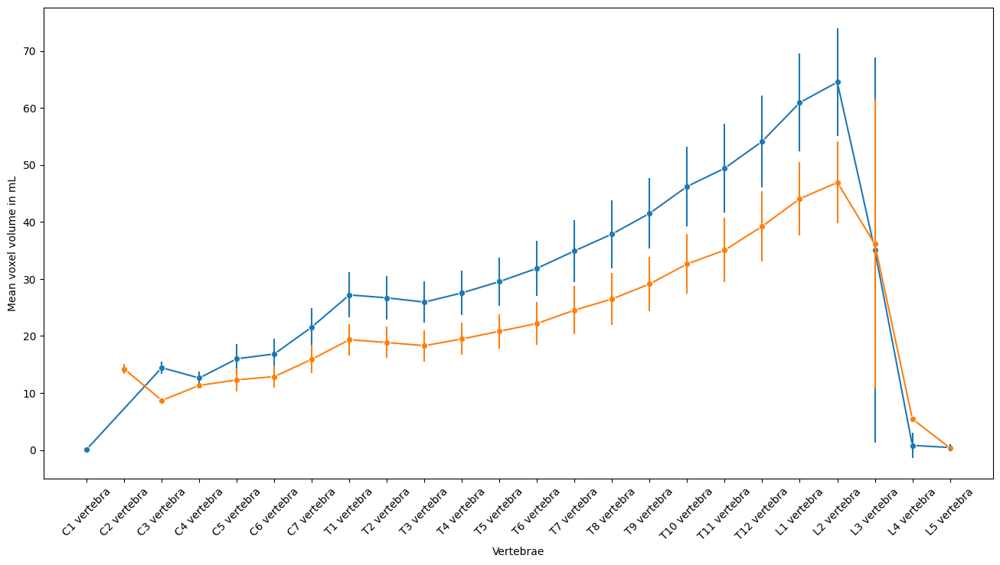

In [66]:
fig = plt.figure(figsize=(16,8))
ax = sns.lineplot(data=df_plot_mean_and_std, x = 'findingSite_CodeMeaning', y = 'mean_males' , markers=True, dashes=False, marker='o')
ax = sns.lineplot(data=df_plot_mean_and_std, x = "findingSite_CodeMeaning", y = 'mean_females', markers=True, dashes=False, marker='o')
ax.set_xticks(np.linspace(0,len(region1_list)-1,len(region1_list)))
ax.set_xticklabels(region1_list)
ax.set_xlabel('Vertebrae')
ax.set_ylabel('Mean voxel volume in mL')
# plot std dev for males
for n in range(0,len(df_plot_mean_and_std)):
  plt.plot([n, n],
          [df_plot_mean_and_std['mean_males'].values[n] - df_plot_mean_and_std['std_males'].values[n], df_plot_mean_and_std['mean_males'].values[n] + df_plot_mean_and_std['std_males'].values[n]],
          c='C0')
# plot std dev for females
for n in range(0,len(df_plot_mean_and_std)):
  plt.plot([n, n],
          [df_plot_mean_and_std['mean_females'].values[n] - df_plot_mean_and_std['std_females'].values[n], df_plot_mean_and_std['mean_females'].values[n] + df_plot_mean_and_std['std_females'].values[n]],
          c='C1')
plt.xticks(rotation=45)

(array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
        13., 14., 15., 16.]),
 [Text(0.0, 0, 'T1 vertebra'),
  Text(1.0, 0, 'T2 vertebra'),
  Text(2.0, 0, 'T3 vertebra'),
  Text(3.0, 0, 'T4 vertebra'),
  Text(4.0, 0, 'T5 vertebra'),
  Text(5.0, 0, 'T6 vertebra'),
  Text(6.0, 0, 'T7 vertebra'),
  Text(7.0, 0, 'T8 vertebra'),
  Text(8.0, 0, 'T9 vertebra'),
  Text(9.0, 0, 'T10 vertebra'),
  Text(10.0, 0, 'T11 vertebra'),
  Text(11.0, 0, 'T12 vertebra'),
  Text(12.0, 0, 'L1 vertebra'),
  Text(13.0, 0, 'L2 vertebra'),
  Text(14.0, 0, 'L3 vertebra'),
  Text(15.0, 0, 'L4 vertebra'),
  Text(16.0, 0, 'L5 vertebra')])

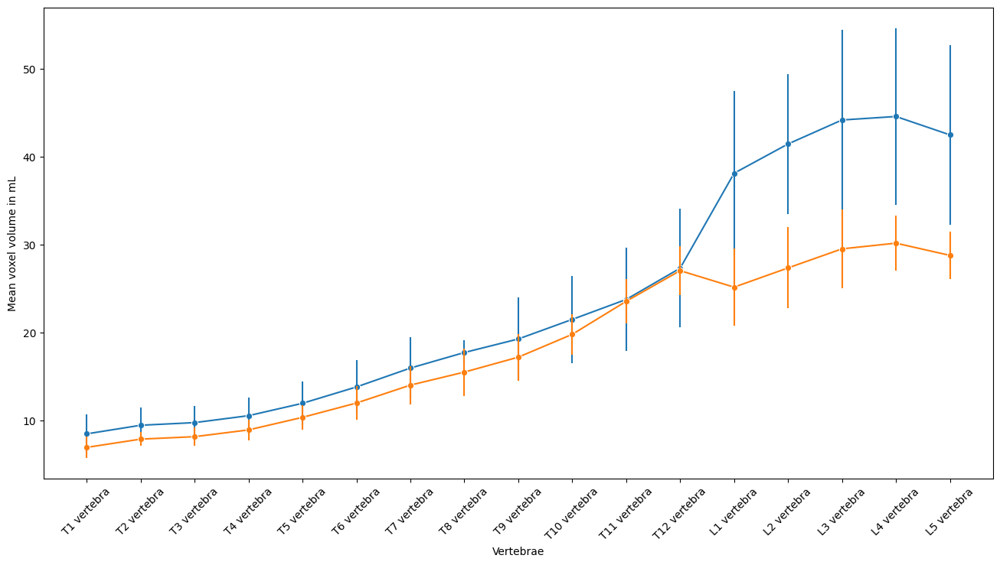

In [69]:
# Add in the values from the paper - mean and standard deviation

region1_list_paper = region1_list[7:]

df_plot_mean_and_std_paper = pd.DataFrame()
df_plot_mean_and_std_paper['findingSite_CodeMeaning'] = region1_list_paper
df_plot_mean_and_std_paper['mean_males'] = [8.48, 9.46, 9.76, 10.55, 11.96, 13.82, 15.97, 17.74, 19.28, 21.51, 23.78, 27.34, 38.15, 41.48, 44.21, 44.61, 42.52]
df_plot_mean_and_std_paper['mean_females'] = [6.94, 7.88, 8.16, 8.93, 10.36, 11.99, 14.03, 15.51, 17.21, 19.81,  23.57, 27.06, 25.18, 27.37, 29.54, 30.19, 28.80]
df_plot_mean_and_std_paper['std_males'] = [2.1, 1.95, 1.81, 1.97, 2.37, 3.01, 3.41, 1.28, 4.68, 4.86, 5.81, 6.67, 9.25, 7.87, 10.14, 9.96, 10.14]
df_plot_mean_and_std_paper['std_females'] = [1.11, 0.7, 0.97, 1.11, 1.3, 1.85, 2.08, 2.61, 2.56, 2.2, 2.42, 2.72, 4.31, 4.53, 4.4, 3.07, 2.63]

fig = plt.figure(figsize=(16,8))
ax = sns.lineplot(data=df_plot_mean_and_std_paper, x = 'findingSite_CodeMeaning', y = 'mean_males' , markers=True, dashes=False, marker='o')
ax = sns.lineplot(data=df_plot_mean_and_std_paper, x = "findingSite_CodeMeaning", y = 'mean_females', markers=True, dashes=False, marker='o')
ax.set_xticks(np.linspace(0,len(region1_list_paper)-1,len(region1_list_paper)))
ax.set_xticklabels(region1_list_paper)
ax.set_xlabel('Vertebrae')
ax.set_ylabel('Mean voxel volume in mL')
# plot std dev for males
for n in range(0,len(df_plot_mean_and_std_paper)):
  plt.plot([n, n],
          [df_plot_mean_and_std_paper['mean_males'].values[n] - df_plot_mean_and_std_paper['std_males'].values[n], df_plot_mean_and_std_paper['mean_males'].values[n] + df_plot_mean_and_std_paper['std_males'].values[n]],
          c='C0')
# plot std dev for females
for n in range(0,len(df_plot_mean_and_std_paper)):
  plt.plot([n, n],
          [df_plot_mean_and_std_paper['mean_females'].values[n] - df_plot_mean_and_std_paper['std_females'].values[n], df_plot_mean_and_std_paper['mean_females'].values[n] + df_plot_mean_and_std_paper['std_females'].values[n]],
          c='C1')
plt.xticks(rotation=45)

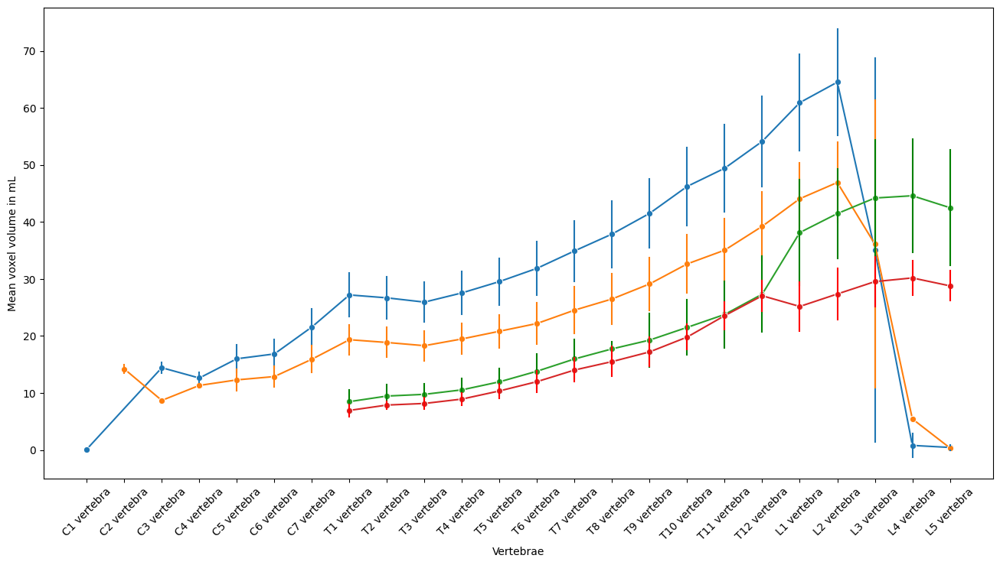

In [78]:
# Combine both plots

fig = plt.figure(figsize=(16,8))
ax = sns.lineplot(data=df_plot_mean_and_std, x = 'findingSite_CodeMeaning', y = 'mean_males' , marker='o')
ax = sns.lineplot(data=df_plot_mean_and_std, x = "findingSite_CodeMeaning", y = 'mean_females', marker='o')
ax.set_xticks(np.linspace(0,len(region1_list)-1,len(region1_list)))
ax.set_xticklabels(region1_list)
ax.set_xlabel('Vertebrae')
ax.set_ylabel('Mean voxel volume in mL')
# plot std dev for males
for n in range(0,len(df_plot_mean_and_std)):
  plt.plot([n, n],
          [df_plot_mean_and_std['mean_males'].values[n] - df_plot_mean_and_std['std_males'].values[n], df_plot_mean_and_std['mean_males'].values[n] + df_plot_mean_and_std['std_males'].values[n]],
          c='C0')
# plot std dev for females
for n in range(0,len(df_plot_mean_and_std)):
  plt.plot([n, n],
          [df_plot_mean_and_std['mean_females'].values[n] - df_plot_mean_and_std['std_females'].values[n], df_plot_mean_and_std['mean_females'].values[n] + df_plot_mean_and_std['std_females'].values[n]],
          c='C1')
plt.xticks(rotation=45)

################

# Add in the values from the paper - mean and standard deviation

region1_list_paper = region1_list[7:]

df_plot_mean_and_std_paper = pd.DataFrame()
df_plot_mean_and_std_paper['findingSite_CodeMeaning'] = region1_list_paper
df_plot_mean_and_std_paper['mean_males'] = [8.48, 9.46, 9.76, 10.55, 11.96, 13.82, 15.97, 17.74, 19.28, 21.51, 23.78, 27.34, 38.15, 41.48, 44.21, 44.61, 42.52]
df_plot_mean_and_std_paper['mean_females'] = [6.94, 7.88, 8.16, 8.93, 10.36, 11.99, 14.03, 15.51, 17.21, 19.81,  23.57, 27.06, 25.18, 27.37, 29.54, 30.19, 28.80]
df_plot_mean_and_std_paper['std_males'] = [2.1, 1.95, 1.81, 1.97, 2.37, 3.01, 3.41, 1.28, 4.68, 4.86, 5.81, 6.67, 9.25, 7.87, 10.14, 9.96, 10.14]
df_plot_mean_and_std_paper['std_females'] = [1.11, 0.7, 0.97, 1.11, 1.3, 1.85, 2.08, 2.61, 2.56, 2.2, 2.42, 2.72, 4.31, 4.53, 4.4, 3.07, 2.63]

ax = sns.lineplot(data=df_plot_mean_and_std_paper, x = 'findingSite_CodeMeaning', y = 'mean_males' , marker='o')
ax = sns.lineplot(data=df_plot_mean_and_std_paper, x = "findingSite_CodeMeaning", y = 'mean_females',  marker='o')
# ax.set_xticks(np.linspace(0,len(region1_list_paper)-1,len(region1_list_paper)))
# ax.set_xticklabels(region1_list_paper)
ax.set_xlabel('Vertebrae')
ax.set_ylabel('Mean voxel volume in mL')
# plot std dev for males
for n in range(0,len(df_plot_mean_and_std_paper)):
  plt.plot([n+7, n+7],
          [df_plot_mean_and_std_paper['mean_males'].values[n] - df_plot_mean_and_std_paper['std_males'].values[n], df_plot_mean_and_std_paper['mean_males'].values[n] + df_plot_mean_and_std_paper['std_males'].values[n]],
           c = 'g')
# plot std dev for females
for n in range(0,len(df_plot_mean_and_std_paper)):
  plt.plot([n+7, n+7],
          [df_plot_mean_and_std_paper['mean_females'].values[n] - df_plot_mean_and_std_paper['std_females'].values[n], df_plot_mean_and_std_paper['mean_females'].values[n] + df_plot_mean_and_std_paper['std_females'].values[n]],
           c = 'r')
# plt.xticks(rotation=45)

## D. NLST segmentation consistency over time

Use Vamsi's query to get the regions that are fully segmented.

Then get the stddev of the values per patient to see how the volumes differ over time.

For some organs they should be stable.

In [ ]:
def query_for_stddev(region, feature, table_id, project_name):

  client = bigquery.Client(project=project_name)

  # query = f"""

  #   WITH select_patients AS(

  #   SELECT
  #     DISTINCT(clinical_table.sourceSegmentedSeriesUID),
  #     clinical_table.PatientID,
  #     clinical_table.StudyInstanceUID,
  #     age,
  #     gender,
  #     Value,
  #   FROM
  #     `{table_id}` as clinical_table
  #   JOIN
  #     `idc-external-025.terra.segmentation_completeness_table` as segmentation_completeness
  #   ON
  #     clinical_table.sourceSegmentedSeriesUID = segmentation_completeness.rssSIUD AND
  #     # clinical_table.lateralityModifier.CodeMeaning = segmentation_completeness.laterality AND
  #     clinical_table.findingSite.CodeMeaning = segmentation_completeness.bodyPart
  #   WHERE
  #     findingSite.CodeMeaning = @region AND
  #     Quantity.CodeMeaning = @feature AND
  #     segmentation_completeness_check = 'may_be_segmented_fully'
  #   ORDER BY
  #     clinical_table.PatientID,
  #     clinical_table.StudyInstanceUID
  #     )

  #   SELECT
  #     PatientID,
  #     ANY_VALUE(StudyInstanceUID) AS StudyInstanceUID, # will get any url though
  #     ANY_VALUE(gender) as gender,
  #     STDDEV_POP(Value) AS stddev
  #   FROM
  #     select_patients
  #   GROUP BY
  #     PatientID;
  #   """

  query = f"""

    SELECT
      DISTINCT(clinical_table.sourceSegmentedSeriesUID),
      clinical_table.PatientID,
      clinical_table.StudyInstanceUID,
      age,
      gender,
      Value,
      SeriesNumber,
      ViewerUrl
    FROM
      `{table_id}` as clinical_table
    JOIN
      `idc-external-025.terra.segmentation_completeness_table` as segmentation_completeness
    ON
      clinical_table.sourceSegmentedSeriesUID = segmentation_completeness.rssSIUD AND
      # clinical_table.lateralityModifier.CodeMeaning = segmentation_completeness.laterality AND
      clinical_table.findingSite.CodeMeaning = segmentation_completeness.bodyPart
    WHERE
      findingSite.CodeMeaning = @region AND
      Quantity.CodeMeaning = @feature AND
      segmentation_completeness_check = 'may_be_segmented_fully'
    ORDER BY
      clinical_table.PatientID,
      clinical_table.StudyInstanceUID;

    """

  job_config = bigquery.QueryJobConfig(query_parameters=[
                                                        bigquery.ScalarQueryParameter("region", "STRING", region),
                                                        bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                        ])
  df = client.query(query, job_config=job_config).to_dataframe()

  return df

In [ ]:
def create_bokeh_plot_stddev(df_plot, feature, region, output_filename):


########## create bokeh plot with ohif urls

  # output_notebook()

  # set the seed so jitter will be the same for each run
  np.random.seed(0)
  random.seed(0)

  #--- create df of the feature we want to plot ---#

  new_column = [np.float32(f) for f in df_plot['Value'].values]
  df_plot['Value_numeric'] = new_column

  # order df_plot according to SeriesDescriptions
  df_plot = df_plot.sort_values(by=['gender']) # want alphabetical order

  SeriesDescriptions_list = list(set(list(df_plot['gender'].values)))
  SeriesDescriptions_list = sorted(SeriesDescriptions_list)
  num_SeriesDescriptions = len(SeriesDescriptions_list)

  #--- Plot using bokeh ---#

  hover = HoverTool(tooltips=[
    (''.join(["(",'feature',")"]), "($y)")
  ])

  wZoom = WheelZoomTool()
  bZoom = BoxZoomTool()
  reset = ResetTool()
  tap = TapTool()
  pan = PanTool()

  # Get a color for each region
  colormap, colors = color_list_generator(df_plot, 'gender')
  df_plot['colors'] = colors
  colormap_list_keys = list(colormap.keys())
  SeriesDescriptions = colormap_list_keys

  cats = df_plot.gender.unique()

  colors = list(colormap.values())

  cats2 = []
  for c in range(0,len(cats)):
    cats2.append(cats[c])
    cats2.append(cats[c]+"_boxplot")
  regions = cats2

  colors2 = []
  for c in range(0,len(colors)):
    colors2.append(colors[c])
    colors2.append(colors[c])

  p = figure(tools = [hover, wZoom, bZoom, reset, tap, pan],
            x_range=regions)

  # l = p.circle(y='Value_numeric', x=jitter('SeriesDescription', width=0.6, range=p.x_range), source=df_plot, alpha=1, color='colors')
  # https://stackoverflow.com/questions/64942935/jitter-in-scatterplot-for-non-numeric-x-axis
  def jitter(x):
      # return x + random.uniform(0, .5) -.25
      # return x + random.uniform(0, 0.5) + 0.5
      return x + random.uniform(0, 0.75) + 0.2
  type_ids = dict()
  for n in range(0,len(colormap_list_keys)):
    type_ids[colormap_list_keys[n]] = (n*2)
  df_plot['gender_id'] = df_plot['gender'].apply(lambda x:type_ids[x])
  df_plot['jitter_type'] = df_plot['gender_id'].apply(lambda x: jitter(x))
  l1 = p.circle(y='Value_numeric',x='jitter_type',source=df_plot, alpha=1, color='colors')

  legend = Legend(items=[LegendItem(label=dict(field="gender"), renderers=[l1])])

  p.add_layout(legend, 'below')

  ### Include the box plots ###
  # find the quartiles and IQR for each category

  df_plot2 = df_plot.copy(deep=True)
  df_plot2['gender2'] = [str(f) + '_boxplot' for f in list(df_plot['gender'].values)]

  # regions are in order we want
  category_gender = pd.api.types.CategoricalDtype(categories=regions, ordered=True)
  df_plot2['gender2'] = df_plot2['gender2'].astype(category_gender)

  groups = df_plot2.groupby('gender2')
  q1 = groups.quantile(q=0.25)
  q2 = groups.quantile(q=0.5)
  q3 = groups.quantile(q=0.75)
  iqr = q3 - q1
  upper = q3 + 1.5*iqr
  lower = q1 - 1.5*iqr

  # Form the source data to call vbar for upper and lower
  # boxes to be formed later.
  upper_source = ColumnDataSource(data=dict(
      x=cats2,
      bottom=q2.Value_numeric,
      top=q3.Value_numeric,
      fill_color=colors2,
      legend=cats2
  ))

  lower_source = ColumnDataSource(data=dict(
      x=cats2,
      bottom=q1.Value_numeric,
      top=q2.Value_numeric,
      fill_color=colors2
  ))


  # stems (Don't need colors of treatment)
  p.segment(cats2, upper.Value_numeric, cats2, q3.Value_numeric, line_color="black")
  p.segment(cats2, lower.Value_numeric, cats2, q1.Value_numeric, line_color="black")

  # Add the upper and lower quartiles
  l=p.vbar(source = upper_source, x='x', width=0.6, bottom='bottom', top='top', fill_color='fill_color', line_color="black")
  p.vbar(source = lower_source, x='x', width=0.6, bottom='bottom', top='top', fill_color='fill_color', line_color="black")

  # whiskers (almost-0 height rects simpler than segments)
  p.rect(cats2, lower.Value_numeric, 0.2, 0.0001, line_color="black")
  p.rect(cats2, upper.Value_numeric, 0.2, 0.0001, line_color="black")

  # Using the newer autogrouped syntax.
  # Grab a renderer, in this case upper quartile and then
  # create the legend explicitly.
  # Guidance from: https://groups.google.com/a/continuum.io/forum/#!msg/bokeh/uEliQlgj390/Jyhsc5HqAAAJ
  # legend = Legend(items=[LegendItem(label=dict(field="x"), renderers=[l])])

  # Setup plot titles and such.
  p.title.text = region + ' ' + feature + ' stddev over each patient'
  p.xgrid.grid_line_color = None
  p.ygrid.grid_line_color = "white"
  p.grid.grid_line_width = 2
  p.xaxis.major_label_text_font_size="0pt"
  p.xaxis.major_label_orientation = np.pi/4
  p.xaxis.axis_label = "M vs F"
  p.yaxis.axis_label= region + ' ' + feature
  # p.legend.location = (100,10)

  p.xaxis.major_tick_line_color = None  # turn off x-axis major ticks
  p.xaxis.minor_tick_line_color = None  # turn off x-axis minor ticks

  url="@viewer_url"
  taptool = p.select(type=TapTool)
  taptool.callback = OpenURL(url=url)

  # show(p)
  output_file(output_filename,mode='inline')
  save(p)

  # output_figures_directory = "/content/figures"
  # if not os.path.isdir(output_figures_directory):
  #   os.mkdir(output_figures_directory)

  # output_figure_filename = os.path.join(output_figures_directory, "figure_5.html")
  # output_file(output_figure_filename,mode='inline')

  return

In [ ]:
if not os.path.isdir("/content/bokeh_figures_segmentation_over_time"):
  os.mkdir("/content/bokeh_figures_segmentation_over_time")
if not os.path.isdir("/content/pdf_figures_segmentation_over_time"):
  os.mkdir("/content/pdf_figures_segmentation_over_time")

from matplotlib.backends.backend_pdf import PdfPages


In [ ]:
region_list = ["Spleen", "Liver", "L1 vertebra", "T7 vertebra"]
features = "Volume"
table_id = "idc-external-025.terra.nlst-126k-measurements-clinical-acquisition"
segmentation_over_time_csv = "/content/segmentation_over_time.csv"

In [ ]:
region = "Spleen"
df_plot = query_for_stddev(region, feature, table_id, project_name)

*** region: Spleen ***
/content/pdf_figures_segmentation_over_time/violin_stddev_plot_Spleen.pdf


<ipython-input-43-9926fb24abc7>:88: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  q1 = groups.quantile(q=0.25)
<ipython-input-43-9926fb24abc7>:89: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  q2 = groups.quantile(q=0.5)
<ipython-input-43-9926fb24abc7>:90: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  q3 = groups.quantile(q=0.75)


*** region: Liver ***
/content/pdf_figures_segmentation_over_time/violin_stddev_plot_Liver.pdf


<ipython-input-43-9926fb24abc7>:88: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  q1 = groups.quantile(q=0.25)
<ipython-input-43-9926fb24abc7>:89: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  q2 = groups.quantile(q=0.5)
<ipython-input-43-9926fb24abc7>:90: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  q3 = groups.quantile(q=0.75)


*** region: L1 vertebra ***
/content/pdf_figures_segmentation_over_time/violin_stddev_plot_L1 vertebra.pdf


<ipython-input-43-9926fb24abc7>:88: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  q1 = groups.quantile(q=0.25)
<ipython-input-43-9926fb24abc7>:89: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  q2 = groups.quantile(q=0.5)
<ipython-input-43-9926fb24abc7>:90: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  q3 = groups.quantile(q=0.75)


*** region: T7 vertebra ***
/content/pdf_figures_segmentation_over_time/violin_stddev_plot_T7 vertebra.pdf


<ipython-input-43-9926fb24abc7>:88: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  q1 = groups.quantile(q=0.25)
<ipython-input-43-9926fb24abc7>:89: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  q2 = groups.quantile(q=0.5)
<ipython-input-43-9926fb24abc7>:90: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  q3 = groups.quantile(q=0.75)


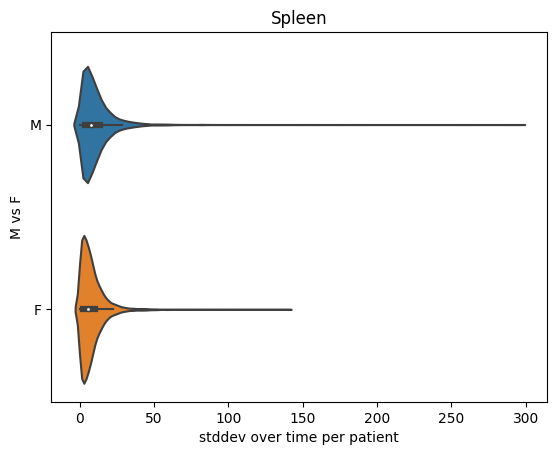

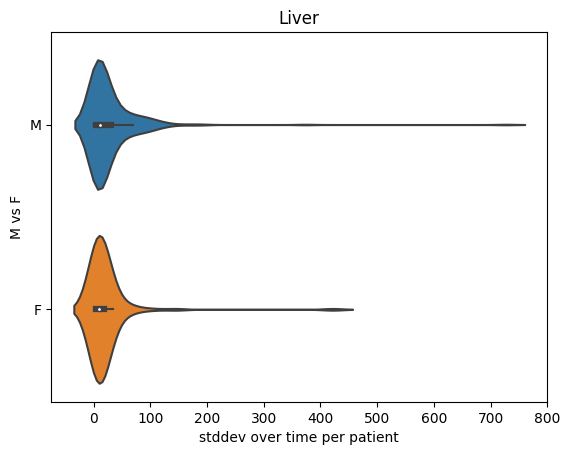

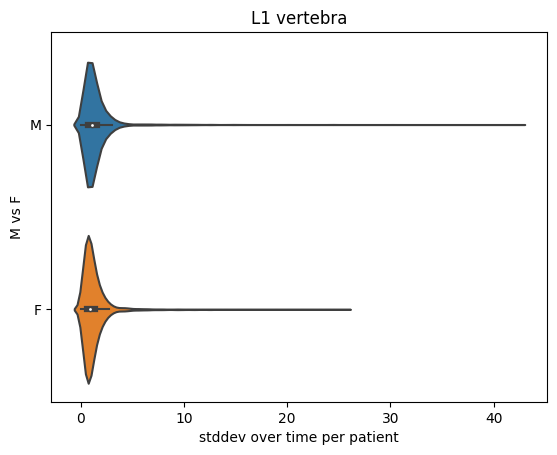

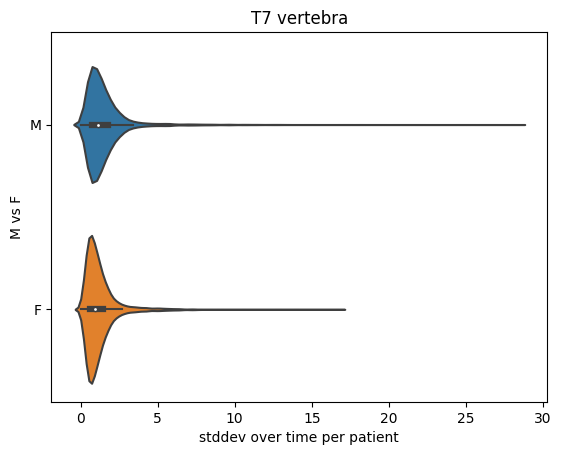

In [ ]:
number_of_males_list = []
number_of_females_list = []
median_stddev_males_list = []
median_stddev_females_list = []
region_list_analyzed = []

for region in region_list:

  print ('*** region: ' + str(region) + ' ***')

  df_plot = query_for_stddev(region, feature, table_id, project_name)
  df_plot['Value_numeric'] = [np.float32(f) for f in df_plot['Value'].values]
  df_plot['Value_numeric'] = df_plot['Value_numeric'] / 1000.0

  ### calculate the stddev ourselves, and pick the row with the one that deviates the most  ###

  # Step 1: Group by 'Patient'
  grouped = df_plot.groupby('PatientID')
  # Step 2: Calculate the median volume and stddev volume for each patient
  median_volume = grouped['Value_numeric'].transform('median')
  stddev_volume = grouped['Value_numeric'].transform('std')
  # Step 3: Calculate the absolute deviation of volume from the median for each row
  absolute_deviation = abs(df_plot['Value_numeric'] - median_volume)
  df_plot['median'] = median_volume.values
  df_plot['stddev'] = stddev_volume.values
  # Step 4: Find the row with the maximum absolute deviation for each patient
  max_deviation_row = df_plot.loc[absolute_deviation.groupby(df_plot['PatientID']).idxmax()]

  df_plot_keep = max_deviation_row

  ### Plot ###

  if len(df_plot)>1:

    region_list_analyzed.append(region)

    ### Violin plot for differences ###

    fig = plt.figure()
    ax = sns.violinplot(data=df_plot_keep, x="stddev", y="gender")
    ax.set(xlabel = "stddev over time per patient", ylabel = "M vs F", title = region)
    pdf_file = '/content/pdf_figures_segmentation_over_time/violin_stddev_plot_' + str(region) + '.pdf'
    print(pdf_file)
    pp = PdfPages(pdf_file)
    pp.savefig(fig)
    pp.close()

    ### Bokeh plot ###

    output_filename = os.path.join("/content/bokeh_figures_segmentation_over_time", str(region) + ".html")

    df_plot_bokeh = df_plot_keep.copy(deep=True)
    # remove columns Value, Value_numeric
    df_plot_bokeh = df_plot_bokeh.drop(['Value'], axis=1)
    df_plot_bokeh = df_plot_bokeh.drop(['Value_numeric'], axis=1)
    df_plot_bokeh = df_plot_bokeh.rename(columns={"stddev": "Value"})
    # add the ohif urls
    df_plot_bokeh['viewer_url'] = [None] * len(df_plot_bokeh)
    df_plot_bokeh['viewer_url'] = [os.path.join("https://idc-tester-dk-2-server.web.app/viewer",
                                          f + "!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series")
                            for f in df_plot_bokeh['StudyInstanceUID'].values]

    create_bokeh_plot_stddev(df_plot_bokeh, feature, region, output_filename)

    ### Median values etc ###

    median_stddev_males = np.median(df_plot[df_plot['gender']=='M']['stddev'].values)
    median_stddev_females = np.median(df_plot[df_plot['gender']=="F"]['stddev'].values)
    number_of_males = len(df_plot[df_plot['gender']=='M']['stddev'].values)
    number_of_females = len(df_plot[df_plot['gender']=='F']['stddev'].values)

    number_of_males_list.append(number_of_males)
    median_stddev_males_list.append(median_stddev_males)
    number_of_females_list.append(number_of_females)
    median_stddev_females_list.append(median_stddev_females)


In [ ]:
# Save csv
df_csv = pd.DataFrame()
df_csv['region'] = region_list_analyzed
df_csv['number_of_males'] = number_of_males_list
df_csv['median_stddev_of_males'] = median_stddev_males_list
df_csv['number_of_females'] = number_of_females_list
df_csv['median_stddev_of_females'] = median_stddev_females_list
df_csv.to_csv(segmentation_over_time_csv, index=False)

Download all the segmentation_over_time plots

In [ ]:
# Zip files

!zip -r /content/bokeh_figures_segmentation_over_time.zip /content/bokeh_figures_segmentation_over_time
!zip -r /content/pdf_figures_segmentation_over_time.zip /content/pdf_figures_segmentation_over_time


updating: content/bokeh_figures_segmentation_over_time/ (stored 0%)
updating: content/bokeh_figures_segmentation_over_time/Spleen.html (deflated 83%)
updating: content/bokeh_figures_segmentation_over_time/Liver.html (deflated 74%)
updating: content/bokeh_figures_segmentation_over_time/T7 vertebra.html (deflated 83%)
updating: content/bokeh_figures_segmentation_over_time/L1 vertebra.html (deflated 82%)
updating: content/pdf_figures_segmentation_over_time/ (stored 0%)
updating: content/pdf_figures_segmentation_over_time/violin_stddev_plot_Liver.pdf (deflated 25%)
updating: content/pdf_figures_segmentation_over_time/.ipynb_checkpoints/ (stored 0%)
updating: content/pdf_figures_segmentation_over_time/violin_stddev_plot_L1 vertebra.pdf (deflated 25%)
updating: content/pdf_figures_segmentation_over_time/violin_stddev_plot_Spleen.pdf (deflated 24%)
updating: content/pdf_figures_segmentation_over_time/violin_stddev_plot_T7 vertebra.pdf (deflated 24%)


In [ ]:
# Download files

from google.colab import files
files.download("/content/bokeh_figures_segmentation_over_time.zip")
files.download("/content/pdf_figures_segmentation_over_time.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## (OLD) D.  NLST segmentation consistency over time

In [ ]:
def query_for_stddev_with_limits(region, feature, table_id, project_name, region1=None, region2=None):

  if (region1 and region2):
    print('including limits')

    query = f"""

      #--- Only include the series that have a region in between region1 and region2 ---#

      WITH select_series AS(

        SELECT
          DISTINCT(sourceSegmentedSeriesUID) as sourceSegmentedSeriesUID
          FROM
            `{table_id}`
          WHERE
            findingSite.CodeMeaning IN (@region1, @region2) AND
            sourceSegmentedSeriesUID IN (
              SELECT
                sourceSegmentedSeriesUID
              FROM
                `{table_id}`
              WHERE
                findingSite.CodeMeaning = @region
          )
          GROUP BY
            sourceSegmentedSeriesUID,
            StudyInstanceUID
          HAVING
            COUNT(DISTINCT findingSite.CodeMeaning) = 2

      ),

      select_patients AS(

      SELECT
        # DISTINCT(clinical_table.sourceSegmentedSeriesUID),
        select_series.sourceSegmentedSeriesUID,
        clinical_table.PatientID,
        clinical_table.StudyInstanceUID,
        dicom_all.StudyDate,
        age,
        gender,
        Value
      FROM
        select_series
      JOIN
        `{table_id}` as clinical_table
      ON
        select_series.sourceSegmentedSeriesUID = clinical_table.sourceSegmentedSeriesUID
      JOIN
        `bigquery-public-data.idc_current.dicom_all` as dicom_all
      ON
        clinical_table.StudyInstanceUID = dicom_all.StudyInstanceUID
      WHERE
        findingSite.CodeMeaning = @region AND
        Quantity.CodeMeaning = @feature
      )

      SELECT
        PatientID,
        ANY_VALUE(StudyInstanceUID) AS StudyInstanceUID, # will get any url though
        ANY_VALUE(gender) as gender,
        STDDEV_POP(Value) AS stddev
      FROM
        select_patients
      GROUP BY
        PatientID
      """

    client = bigquery.Client(project=project_name)
    job_config = bigquery.QueryJobConfig(query_parameters=[
                                                          bigquery.ScalarQueryParameter("region", "STRING", region),
                                                          bigquery.ScalarQueryParameter("region1", "STRING", region1),
                                                          bigquery.ScalarQueryParameter("region2", "STRING", region2),
                                                          bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                          ])
    df = client.query(query, job_config=job_config).to_dataframe()

  else:
    print('not including limits')
    df = query_for_stddev(region, feature, table_id, project_name)

  return df

In [ ]:
def query_for_stddev(region, feature, table_id, project_name):

  client = bigquery.Client(project=project_name)

  query = f"""

    WITH select_patients AS(

    SELECT
      DISTINCT(clinical_table.sourceSegmentedSeriesUID),
      clinical_table.PatientID,
      clinical_table.StudyInstanceUID,
      dicom_all.StudyDate,
      age,
      gender,
      Value
    FROM
      `{table_id}` as clinical_table
    JOIN
      `bigquery-public-data.idc_current.dicom_all` as dicom_all
    ON
      clinical_table.StudyInstanceUID = dicom_all.StudyInstanceUID
    WHERE
      findingSite.CodeMeaning = @region AND
      Quantity.CodeMeaning = @feature
    ORDER BY
      clinical_table.PatientID,
      clinical_table.StudyInstanceUID,
      dicom_all.StudyDate
    )

    SELECT
      PatientID,
      ANY_VALUE(StudyInstanceUID) AS StudyInstanceUID, # will get any url though
      ANY_VALUE(gender) as gender,
      STDDEV_POP(Value) AS stddev
    FROM
      select_patients
    GROUP BY
      PatientID;
    """

  job_config = bigquery.QueryJobConfig(query_parameters=[
                                                        bigquery.ScalarQueryParameter("region", "STRING", region),
                                                        bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                        ])
  df = client.query(query, job_config=job_config).to_dataframe()

  return df



In [ ]:
def create_seaborn_plot_histogram(df_plot, feature, region):

  histogram = sns.histplot(data=df_plot, x="stddev")
  histogram.set(xlabel = feature, ylabel = "Count", title = feature + ' stddev over time for ' + region)

  return

In [ ]:
def create_bokeh_plot_stddev(df_plot, feature, region):


########## create bokeh plot with ohif urls

  output_notebook()

  # set the seed so jitter will be the same for each run
  np.random.seed(0)
  random.seed(0)

  #--- create df of the feature we want to plot ---#

  new_column = [np.float32(f) for f in df_plot['Value'].values]
  df_plot['Value_numeric'] = new_column

  # order df_plot according to SeriesDescriptions
  df_plot = df_plot.sort_values(by=['gender']) # want alphabetical order

  SeriesDescriptions_list = list(set(list(df_plot['gender'].values)))
  SeriesDescriptions_list = sorted(SeriesDescriptions_list)
  num_SeriesDescriptions = len(SeriesDescriptions_list)

  #--- Plot using bokeh ---#

  hover = HoverTool(tooltips=[
    (''.join(["(",'feature',")"]), "($y)")
  ])

  wZoom = WheelZoomTool()
  bZoom = BoxZoomTool()
  reset = ResetTool()
  tap = TapTool()
  pan = PanTool()

  # Get a color for each region
  colormap, colors = color_list_generator(df_plot, 'gender')
  df_plot['colors'] = colors
  colormap_list_keys = list(colormap.keys())
  SeriesDescriptions = colormap_list_keys

  cats = df_plot.gender.unique()

  colors = list(colormap.values())

  cats2 = []
  for c in range(0,len(cats)):
    cats2.append(cats[c])
    cats2.append(cats[c]+"_boxplot")
  regions = cats2

  colors2 = []
  for c in range(0,len(colors)):
    colors2.append(colors[c])
    colors2.append(colors[c])

  p = figure(tools = [hover, wZoom, bZoom, reset, tap, pan],
            x_range=regions)

  # l = p.circle(y='Value_numeric', x=jitter('SeriesDescription', width=0.6, range=p.x_range), source=df_plot, alpha=1, color='colors')
  # https://stackoverflow.com/questions/64942935/jitter-in-scatterplot-for-non-numeric-x-axis
  def jitter(x):
      # return x + random.uniform(0, .5) -.25
      # return x + random.uniform(0, 0.5) + 0.5
      return x + random.uniform(0, 0.75) + 0.2
  type_ids = dict()
  for n in range(0,len(colormap_list_keys)):
    type_ids[colormap_list_keys[n]] = (n*2)
  df_plot['gender_id'] = df_plot['gender'].apply(lambda x:type_ids[x])
  df_plot['jitter_type'] = df_plot['gender_id'].apply(lambda x: jitter(x))
  l1 = p.circle(y='Value_numeric',x='jitter_type',source=df_plot, alpha=1, color='colors')

  legend = Legend(items=[LegendItem(label=dict(field="gender"), renderers=[l1])])

  p.add_layout(legend, 'below')

  ### Include the box plots ###
  # find the quartiles and IQR for each category

  df_plot2 = df_plot.copy(deep=True)
  df_plot2['gender2'] = [str(f) + '_boxplot' for f in list(df_plot['gender'].values)]

  # regions are in order we want
  category_gender = pd.api.types.CategoricalDtype(categories=regions, ordered=True)
  df_plot2['gender2'] = df_plot2['gender2'].astype(category_gender)

  groups = df_plot2.groupby('gender2')
  q1 = groups.quantile(q=0.25)
  q2 = groups.quantile(q=0.5)
  q3 = groups.quantile(q=0.75)
  iqr = q3 - q1
  upper = q3 + 1.5*iqr
  lower = q1 - 1.5*iqr

  # Form the source data to call vbar for upper and lower
  # boxes to be formed later.
  upper_source = ColumnDataSource(data=dict(
      x=cats2,
      bottom=q2.Value_numeric,
      top=q3.Value_numeric,
      fill_color=colors2,
      legend=cats2
  ))

  lower_source = ColumnDataSource(data=dict(
      x=cats2,
      bottom=q1.Value_numeric,
      top=q2.Value_numeric,
      fill_color=colors2
  ))


  # stems (Don't need colors of treatment)
  p.segment(cats2, upper.Value_numeric, cats2, q3.Value_numeric, line_color="black")
  p.segment(cats2, lower.Value_numeric, cats2, q1.Value_numeric, line_color="black")

  # Add the upper and lower quartiles
  l=p.vbar(source = upper_source, x='x', width=0.6, bottom='bottom', top='top', fill_color='fill_color', line_color="black")
  p.vbar(source = lower_source, x='x', width=0.6, bottom='bottom', top='top', fill_color='fill_color', line_color="black")

  # whiskers (almost-0 height rects simpler than segments)
  p.rect(cats2, lower.Value_numeric, 0.2, 0.0001, line_color="black")
  p.rect(cats2, upper.Value_numeric, 0.2, 0.0001, line_color="black")

  # Using the newer autogrouped syntax.
  # Grab a renderer, in this case upper quartile and then
  # create the legend explicitly.
  # Guidance from: https://groups.google.com/a/continuum.io/forum/#!msg/bokeh/uEliQlgj390/Jyhsc5HqAAAJ
  # legend = Legend(items=[LegendItem(label=dict(field="x"), renderers=[l])])

  # Setup plot titles and such.
  p.title.text = region + ' ' + feature
  p.xgrid.grid_line_color = None
  p.ygrid.grid_line_color = "white"
  p.grid.grid_line_width = 2
  p.xaxis.major_label_text_font_size="0pt"
  p.xaxis.major_label_orientation = np.pi/4
  p.xaxis.axis_label = "M vs F"
  p.yaxis.axis_label= region + ' ' + feature
  # p.legend.location = (100,10)

  p.xaxis.major_tick_line_color = None  # turn off x-axis major ticks
  p.xaxis.minor_tick_line_color = None  # turn off x-axis minor ticks

  url="@viewer_url"
  taptool = p.select(type=TapTool)
  taptool.callback = OpenURL(url=url)

  show(p)

  # output_figures_directory = "/content/figures"
  # if not os.path.isdir(output_figures_directory):
  #   os.mkdir(output_figures_directory)

  # output_figure_filename = os.path.join(output_figures_directory, "figure_5.html")
  # output_file(output_figure_filename,mode='inline')

  return

In [ ]:
# region = "Left atrium"
region = "Spleen"
region_1 = "T7 vertebra"
region_2 = "L5 vertebra" # pick the lowest to make sure we include entire spleen # "T11 vertebra"
feature = "Volume"
table_id = "idc-external-025.terra.nlst-126k-measurements-clinical-acquisition"

df_plot = query_for_stddev_with_limits(region, feature, table_id, project_name, region_1, region_2)

including limits


In [ ]:
df_plot = df_plot.rename(columns={"stddev": "Value"})
# add the ohif urls
df_plot['viewer_url'] = [None] * len(df_plot)
df_plot['viewer_url'] = [os.path.join("https://idc-tester-dk-2-server.web.app/viewer",
                                      f + "!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series")
                         for f in df_plot['StudyInstanceUID'].values]


In [ ]:
create_bokeh_plot_stddev(df_plot, feature, region)

<ipython-input-84-2de8c1c5fc43>:88: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  q1 = groups.quantile(q=0.25)
<ipython-input-84-2de8c1c5fc43>:89: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  q2 = groups.quantile(q=0.5)
<ipython-input-84-2de8c1c5fc43>:90: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  q3 = groups.quantile(q=0.75)


In [ ]:
df_plot = df_plot.rename(columns={"Value": "stddev"})
df_plot['stddev'] = df_plot['stddev']/1000


median stddev for M: 0.0
median stddev for F: 0.0


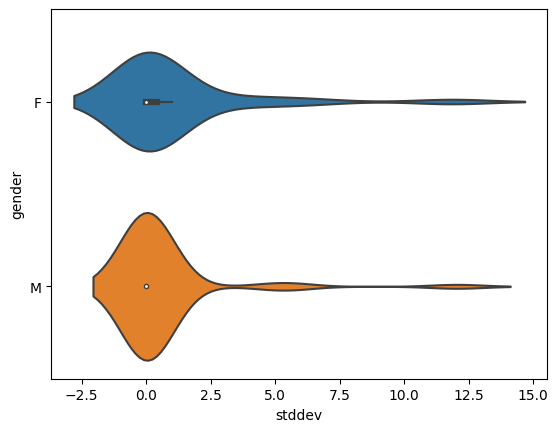

In [ ]:
# Violin plot for differences

sns.violinplot(data=df_plot, x="stddev", y="gender")

median_stddev_males = np.median(df_plot[df_plot['gender']=='M']['stddev'].values)
median_stddev_females = np.median(df_plot[df_plot['gender']=="F"]['stddev'].values)
print('median stddev for M: ' + str(median_stddev_males))
print('median stddev for F: ' + str(median_stddev_females))

In [ ]:
df_plot.sort_values(by='stddev', ascending=False)

,PatientID,StudyInstanceUID,gender,stddev,viewer_url,Value_numeric
62,208430,1.3.6.1.4.1.14519.5.2.1.7009.9004.175250409792...,M,12.038625,https://idc-tester-dk-2-server.web.app/viewer/...,12038.62500
64,202752,1.3.6.1.4.1.14519.5.2.1.7009.9004.278807847997...,F,11.859188,https://idc-tester-dk-2-server.web.app/viewer/...,11859.18750
30,108413,1.2.840.113654.2.55.31537030865167111413516567...,F,6.284250,https://idc-tester-dk-2-server.web.app/viewer/...,6284.25000
35,133793,1.2.840.113654.2.55.12343981048299553122189153...,M,5.608940,https://idc-tester-dk-2-server.web.app/viewer/...,5608.94043
49,200864,1.3.6.1.4.1.14519.5.2.1.7009.9004.188933146177...,M,5.024813,https://idc-tester-dk-2-server.web.app/viewer/...,5024.81250
...,...,...,...,...,...,...
27,115860,1.2.840.113654.2.55.42703785465288664877291462...,M,0.000000,https://idc-tester-dk-2-server.web.app/viewer/...,0.00000
28,113685,1.2.840.113654.2.55.71215652888504480853328396...,M,0.000000,https://idc-tester-dk-2-server.web.app/viewer/...,0.00000
29,121421,1.2.840.113654.2.55.40185826593273558688606439...,M,0.000000,https://idc-tester-dk-2-server.web.app/viewer/...,0.00000
31,111760,1.2.840.113654.2.55.22284015235846466276355537...,F,0.000000,https://idc-tester-dk-2-server.web.app/viewer/...,0.00000


including limits
median stddev for M: 1.0559768847545186
median stddev for F: 0.7751633705124134


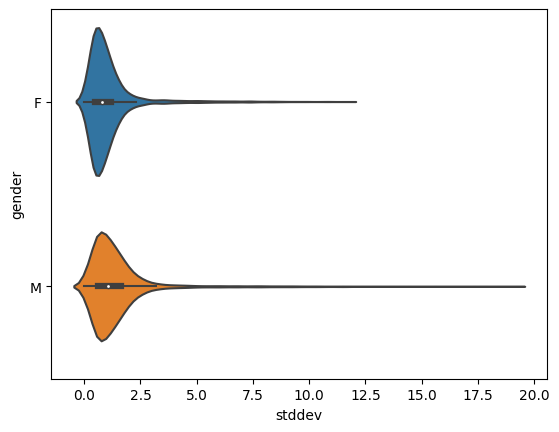

In [ ]:
### T8 vertebra ###

region = "T8 vertebra"
region_1 = "T7 vertebra"
region_2 = "T9 vertebra"
feature = "Volume"
table_id = "idc-external-025.terra.nlst-126k-measurements-clinical-acquisition"

df_plot = query_for_stddev_with_limits(region, feature, table_id, project_name, region_1, region_2)
df_plot['stddev'] = df_plot['stddev']/1000

# add the ohif urls
df_plot['viewer_url'] = [None] * len(df_plot)
df_plot['viewer_url'] = [os.path.join("https://idc-tester-dk-2-server.web.app/viewer",
                                      f + "!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series")
                         for f in df_plot['StudyInstanceUID'].values]

# Violin plot for differences

sns.violinplot(data=df_plot, x="stddev", y="gender")

median_stddev_males = np.median(df_plot[df_plot['gender']=='M']['stddev'].values)
median_stddev_females = np.median(df_plot[df_plot['gender']=="F"]['stddev'].values)

print('median stddev for M: ' + str(median_stddev_males))
print('median stddev for F: ' + str(median_stddev_females))

In [ ]:
df_plot.sort_values(by='stddev', ascending=False)

,PatientID,StudyInstanceUID,gender,stddev,viewer_url
24226,118243,1.2.840.113654.2.55.12904057215754691253398490...,M,19.123755,https://idc-tester-dk-2-server.web.app/viewer/...
20479,107057,1.2.840.113654.2.55.21925981890986417021191340...,M,18.417689,https://idc-tester-dk-2-server.web.app/viewer/...
23952,104478,1.2.840.113654.2.55.72971704379246899088224754...,M,18.329131,https://idc-tester-dk-2-server.web.app/viewer/...
18065,101816,1.2.840.113654.2.55.63284053907344979539798424...,M,18.063947,https://idc-tester-dk-2-server.web.app/viewer/...
17472,100322,1.2.840.113654.2.55.87307811628708020735222627...,M,16.923856,https://idc-tester-dk-2-server.web.app/viewer/...
...,...,...,...,...,...
15039,104079,1.2.840.113654.2.55.26681343928343859759304373...,M,0.000000,https://idc-tester-dk-2-server.web.app/viewer/...
25226,212389,1.3.6.1.4.1.14519.5.2.1.7009.9004.231162429727...,M,0.000000,https://idc-tester-dk-2-server.web.app/viewer/...
12942,216486,1.3.6.1.4.1.14519.5.2.1.7009.9004.275875666580...,M,0.000000,https://idc-tester-dk-2-server.web.app/viewer/...
15038,108611,1.2.840.113654.2.55.54786877177786911966463847...,M,0.000000,https://idc-tester-dk-2-server.web.app/viewer/...


## E. How do the volumes compare to other ground truth datasets

We can compare the distribution of volumes of particular organs to the expert delineations of another dataset.

Since we have the expert delineations in IDC for NSCLC-Radiomics we can compare those. Let's compare the esophagus since that was likely delineated the same way. The heart in NSCLC is not divided into segments, but in TotalSegmentator it is

Plot two histograms of the distributions and do a significance to see if they are not statistically different from each other

NLST

In [ ]:
region = "Esophagus"
feature = "Volume"

In [ ]:
client = bigquery.Client(project=project_name)

query = f"""

  SELECT
     DISTINCT(SOPInstanceUID),
     StudyInstanceUID,
     age,
     gender,
     Value,
     nlst_ctab.sct_ab_desc
  FROM
    `idc-external-025.terra.nlst-126k-measurements-clinical-acquisition` as clinical_table
  JOIN
    `bigquery-public-data.idc_v15_clinical.nlst_ctab` as nlst_ctab
  ON
    clinical_table.PatientID = nlst_ctab.pid
  WHERE
      findingSite.CodeMeaning = @region AND
      Quantity.CodeMeaning = @feature;

  """

job_config = bigquery.QueryJobConfig(query_parameters=[
                                                      bigquery.ScalarQueryParameter("region", "STRING", region),
                                                      bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                      ])
df_nlst = client.query(query, job_config=job_config).to_dataframe()

NSCLC

In [ ]:
region = "Esophagus"
feature = "Volume of Mesh"

In [ ]:
# Query to get a single feature for all series for a single region

client = bigquery.Client(project=project_name)
table_id = ".".join(['bigquery-public-data', 'idc_current', 'quantitative_measurements'])
print(table_id)

query = f"""
  # Query to get a single feature for all series for a single region

  WITH features AS (
    -- Select the data that includes the volume measurement
    -- Include the series it is derived from and the corresponding region
    SELECT
      sourceSegmentedSeriesUID,
      SOPInstanceUID,
      SeriesDescription,
      -- the region - e.g. heart, trachea, aorta, esophagus
      findingSite.CodeMeaning as region,
      -- the value of the feature of interest
      Value
    FROM
      -- IDC table to query from that holds metadata in the form of quantitative measurements
      `bigquery-public-data.idc_current.quantitative_measurements`
    WHERE
      -- feature to retrieve data for
      Quantity.CodeMeaning = @feature AND
      findingSite.CodeMeaning = @region
  )

  -- Select additional fields from the main dicom_all table, including the portal url
  SELECT
    DISTINCT(features.sourceSegmentedSeriesUID),
    features.SOPInstanceUID,
    dicom_all.StudyInstanceUID,
    dicom_all.PatientID,
    features.SeriesDescription,
    features.region,
    features.Value,
    CONCAT("https://viewer.imaging.datacommons.cancer.gov/viewer/",dicom_all.StudyInstanceUID) as viewer_url

  FROM
    features
  LEFT JOIN
    -- dicom_all is the main IDC table that contains the metadata extracted from the DICOM objects
    `bigquery-public-data.idc_current.dicom_all` as dicom_all
  ON
    -- join the two above temporary tables on this field
    features.sourceSegmentedSeriesUID = dicom_all.SeriesInstanceUID
  WHERE
    -- only include data from the NSCLC collection
    dicom_all.collection_id = "nsclc_radiomics" # AND
    -- we want the original NSCLC data, and our annotations
    # Source_DOI IN("10.5281/zenodo.7539035", "10.5281/zenodo.7975081", "10.7937/K9/TCIA.2015.PF0M9REI")
  ORDER BY
    -- specifies the ordering of the data returned
    dicom_all.PatientID,
    features.sourceSegmentedSeriesUID

"""

job_config = bigquery.QueryJobConfig(query_parameters=[
                                                      bigquery.ScalarQueryParameter("region", "STRING", region),
                                                      bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                      ])
df_nsclc = client.query(query, job_config=job_config).to_dataframe()

bigquery-public-data.idc_current.quantitative_measurements


Plot histogram of volume values

In [ ]:
df_nlst = df_nlst[['Value']]
df_nlst['collection_id'] = ["NLST"] * len(df_nlst)

df_nsclc = df_nsclc[['Value']]
df_nsclc['collection_id'] = ["NSCLC-Radiomics"] * len(df_nsclc)

In [ ]:
df = pd.concat([df_nlst, df_nsclc])
df['Value2'] = [np.float32(f) for f in df['Value'].values]
df['Value2'] = df['Value2'] / 1000.00

Median of expert annotated NSCLC-Radiomics: 40.902283
Median of TotalSegmentator on NLST: 37.41075


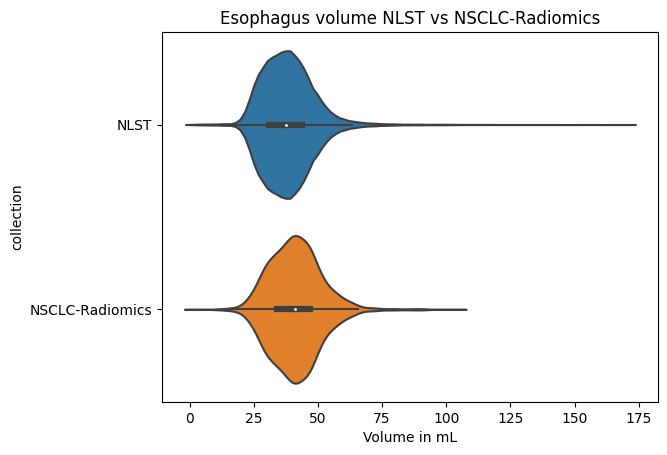

In [ ]:
# Histograms of Volume values
# histogram = sns.histplot(data=df, x="Value", hue="collection_id")
# histogram.set(xlabel = feature, ylabel = "Count", title = feature + ' Esophagus')

# boxplot = sns.boxplot(df, x='Value2', y="collection_id")
# median_nsclc = np.median(df[df['collection_id']=="NSCLC-Radiomics"]['Value2'].values)
# median_nlst = np.median(df[df['collection_id']=="NLST"]['Value2'].values)

violinplot = sns.violinplot(df, x='Value2', y="collection_id")
violinplot.set_title('Esophagus volume NLST vs NSCLC-Radiomics')
violinplot.set_xlabel('Volume in mL')
violinplot.set_ylabel('collection')
median_nsclc = np.median(df[df['collection_id']=="NSCLC-Radiomics"]['Value2'].values)
median_nlst = np.median(df[df['collection_id']=="NLST"]['Value2'].values)

print('Median of expert annotated NSCLC-Radiomics: ' + str(median_nsclc))
print('Median of TotalSegmentator on NLST: ' + str(median_nlst))

In [ ]:
# Check if these differences are significant

from scipy.stats import mannwhitneyu

U1, p = mannwhitneyu(df[df['collection_id']=="NSCLC-Radiomics"]['Value2'].values,
                     df[df['collection_id']=="NLST"]['Value2'].values)
print(U1)
print(p)

375784493.5
5.970708041586427e-38


It shows there is a significant difference between the two datasets... but we do not want that.

## Outliers in size using metrics other than volume

Check for outliers using Maximum 3D diameter and Major axis length.

In [ ]:
def create_df_organ_comparison(region, feature, table_id, project_name, include_laterality=False):

  client = bigquery.Client(project=project_name)

  if (include_laterality):

    query = f"""

        SELECT
          StudyInstanceUID,
          sourceSegmentedSeriesUID,
          age,
          gender,
          Value,
          lateralityModifier.CodeMeaning as laterality,
          segmentation_completeness_check,
          viewerUrl,
          SeriesNumber
        FROM
          `{table_id}` as clinical_table
        JOIN
          `idc-external-025.terra.segmentation_completeness_table` as segmentation_completeness
        ON
          clinical_table.sourceSegmentedSeriesUID = segmentation_completeness.rssSIUD AND
          clinical_table.lateralityModifier.CodeMeaning = segmentation_completeness.laterality AND
          clinical_table.findingSite.CodeMeaning = segmentation_completeness.bodyPart
        WHERE
          findingSite.CodeMeaning = @region AND
          Quantity.CodeMeaning = @feature AND
          segmentation_completeness_check = 'may_be_segmented_fully'
        ORDER BY
          clinical_table.sourceSegmentedSeriesUID;
          """

  else:

      query = f"""

      SELECT
        StudyInstanceUID,
        sourceSegmentedSeriesUID,
        age,
        gender,
        Value,
        lateralityModifier.CodeMeaning as laterality,
        segmentation_completeness_check,
        viewerUrl,
        SeriesNumber
      FROM
        `{table_id}` as clinical_table
      JOIN
        `idc-external-025.terra.segmentation_completeness_table` as segmentation_completeness
      ON
        clinical_table.sourceSegmentedSeriesUID = segmentation_completeness.rssSIUD AND
        clinical_table.findingSite.CodeMeaning = segmentation_completeness.bodyPart
      WHERE
        findingSite.CodeMeaning = @region AND
        Quantity.CodeMeaning = @feature AND
        segmentation_completeness_check = 'may_be_segmented_fully'
      ORDER BY
        clinical_table.sourceSegmentedSeriesUID;
        """

  job_config = bigquery.QueryJobConfig(query_parameters=[
                                                          bigquery.ScalarQueryParameter("region", "STRING", region),
                                                          bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                          ])
  df = client.query(query, job_config=job_config).to_dataframe()

  new_column = [np.float32(f) for f in df['Value'].values]
  df['Value_numeric'] = new_column
  # df['Value_numeric'] = df['Value_numeric'] / 1000

  return df


In [ ]:
table_id = "idc-external-025.terra.nlst-126k-measurements-clinical-acquisition"
region = "T7 vertebra"
feature = "Maximum 3D diameter"
df_plot = create_df_organ_comparison(region, feature, table_id, project_name, include_laterality=False)

print(np.min(df_plot['Value_numeric'].values))
print(np.max(df_plot['Value_numeric'].values))
max_ind = np.argmax(df_plot['Value_numeric'].values)
min_ind = np.argmin(df_plot['Value_numeric'].values)
print('max_ind: ' + str(max_ind) + ' ' + str(df_plot['SeriesNumber'].values[max_ind]) + ' ' + str(df_plot['viewerUrl'].values[max_ind]))
print('min_ind: ' + str(min_ind) + ' ' + str(df_plot['SeriesNumber'].values[min_ind]) + ' ' + str(df_plot['viewerUrl'].values[min_ind]))



6.708
334.564
max_ind: 109224 2 https://idc-tester-dk-2-server.web.app/viewer/1.3.6.1.4.1.14519.5.2.1.7009.9004.226921046456791787687661470555!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series
min_ind: 42894 1 https://idc-tester-dk-2-server.web.app/viewer/1.2.840.113654.2.55.180537398961413178547327894160368958417!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series


<Axes: >

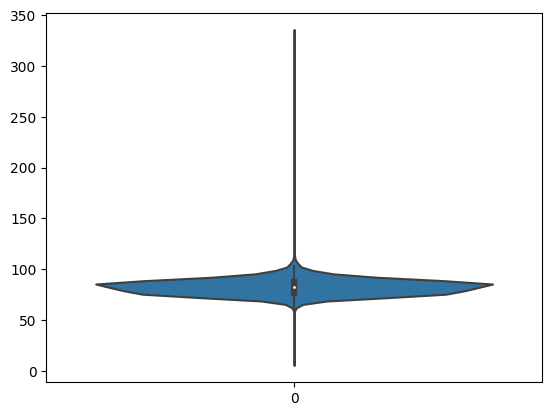

In [ ]:
sns.violinplot(df_plot['Value_numeric'].values)

In [ ]:
table_id = "idc-external-025.terra.nlst-126k-measurements-clinical-acquisition"
region = "T7 vertebra"
feature = "Major axis length"
df_plot = create_df_organ_comparison(region, feature, table_id, project_name, include_laterality=False)

print(np.min(df_plot['Value_numeric'].values))
print(np.max(df_plot['Value_numeric'].values))
max_ind = np.argmax(df_plot['Value_numeric'].values)
min_ind = np.argmin(df_plot['Value_numeric'].values)
print('max_ind: ' + str(max_ind) + ' ' + str(df_plot['SeriesNumber'].values[max_ind]) + ' ' + str(df_plot['viewerUrl'].values[max_ind]))
print('min_ind: ' + str(min_ind) + ' ' + str(df_plot['SeriesNumber'].values[min_ind]) + ' ' + str(df_plot['viewerUrl'].values[min_ind]))



6.928
176.049
max_ind: 65714 6 https://idc-tester-dk-2-server.web.app/viewer/1.2.840.113654.2.55.48598454241585072816223698616432972351!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series
min_ind: 42894 1 https://idc-tester-dk-2-server.web.app/viewer/1.2.840.113654.2.55.180537398961413178547327894160368958417!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series


<Axes: >

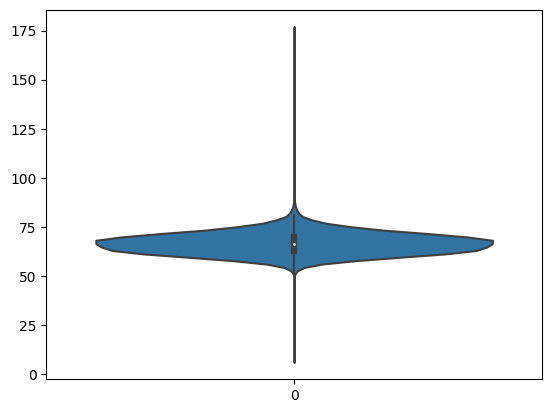

In [ ]:
sns.violinplot(df_plot['Value_numeric'].values)

## Voxel volume vs mesh volume correlation

We can compare the voxel volume and mesh volume and see if we can spot any outliers. In general these should be relatively close to each other.


In [ ]:
# def create_df_bland_altman_voxel_vs_mesh_volume(region, feature1, feature2, table_id, project_name):

#   client = bigquery.Client(project=project_name)

#   query = f"""

#     WITH feature1_series AS (
#       SELECT
#         DISTINCT(sourceSegmentedSeriesUID) AS sourceSegmentedSeriesUID,
#         Value
#       FROM
#         `{table_id}` AS clinical_table
#       JOIN
#         `idc-external-025.terra.segmentation_completeness_table` AS segmentation_completeness
#       ON
#         clinical_table.sourceSegmentedSeriesUID = segmentation_completeness.rssSIUD AND
#         clinical_table.findingSite.CodeMeaning = segmentation_completeness.bodyPart
#       WHERE
#         Quantity.CodeMeaning = @feature1 AND
#         findingSite.CodeMeaning = @region AND
#         segmentation_completeness_check = 'may_be_segmented_fully'
#     ),

#     feature2_series AS (
#       SELECT
#         DISTINCT(sourceSegmentedSeriesUID) as sourceSegmentedSeriesUID,
#         Value
#       FROM
#         `{table_id}` AS clinical_table
#       JOIN
#         `idc-external-025.terra.segmentation_completeness_table` AS segmentation_completeness
#       ON
#         clinical_table.sourceSegmentedSeriesUID = segmentation_completeness.rssSIUD AND
#         clinical_table.findingSite.CodeMeaning = segmentation_completeness.bodyPart
#       WHERE
#         Quantity.CodeMeaning = @feature2 AND
#         findingSite.CodeMeaning = @region AND
#         segmentation_completeness_check = 'may_be_segmented_fully'
#   ),


#   feature_series_both AS (

#     SELECT
#       feature1_series.sourceSegmentedSeriesUID AS sourceSegmentedSeriesUID_1,
#       feature1_series.Value AS Value_1
#     FROM
#       feature1_series

#     UNION ALL

#     SELECT
#       feature2_series.sourceSegmentedSeriesUID AS sourceSegmentedSeriesUID_1,
#       feature2_series.Value AS Value_2
#     FROM
#       feature2_series
#   )


#     SELECT
#       table1.PatientID,
#       table1.StudyInstanceUID,
#       table1.sourceSegmentedSeriesUID,
#       table1.findingSite.CodeMeaning AS findingSite_CodeMeaning,
#       table1.Quantity.CodeMeaning AS Quantity_CodeMeaning,
#       # table1.Value,
#       feature_series_both.Value_1,
#       feature_series_both.Value_2,
#       concat("https://idc-tester-dk-2-server.web.app/viewer/",table1.StudyInstanceUID,"!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_sample_061023/dicomStores/10k-series") as viewer_url
#     FROM
#       `idc-external-025.terra.nlst-126k-measurements-clinical-acquisition` AS table1
#     JOIN
#       feature_series_both
#     ON
#       feature_series_both.sourceSegmentedSeriesUID_1 = table1.sourceSegmentedSeriesUID
#     WHERE
#       table1.findingSite.CodeMeaning = @region
#     ORDER BY
#       table1.PatientID

#   """

#   job_config = bigquery.QueryJobConfig(query_parameters=[
#                                                           bigquery.ScalarQueryParameter("region", "STRING", region),
#                                                           bigquery.ScalarQueryParameter("feature1", "STRING", feature1),
#                                                           bigquery.ScalarQueryParameter("feature2", "STRING", feature2)
#                                                           ])
#   df_plot = client.query(query, job_config=job_config).to_dataframe()



#   # # add the ohif urls

#   # df_left_and_right['viewer_url'] = [None] * len(df_left_and_right)
#   # df_left_and_right['viewer_url'] = [os.path.join('https://idc-tester-dk-2-server.web.app/viewer',
#   #                                                 f + '!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series')
#   #                                     for f in df_left_and_right['StudyInstanceUID_x'].values]
#   # df_plot = df_left_and_right.copy(deep=True)

#   # # https://idc-tester-dk-2-server.web.app/viewer/1.3.6.1.4.1.14519.5.2.1.7009.9004.928330187000432794702104278091!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series

#   # # add the x and y columns

#   # new_column = [np.float32(f) for f in df_plot['Value_x'].values]
#   # df_plot['Value_x_numeric'] = new_column
#   # new_column = [np.float32(f) for f in df_plot['Value_y'].values]
#   # df_plot['Value_y_numeric'] = new_column

#   # df_plot['Value_x_numeric'] = df_plot['Value_x_numeric'] / 1000
#   # df_plot['Value_y_numeric'] = df_plot['Value_y_numeric'] / 1000

#   # df_plot['y'] = df_plot['Value_x_numeric'].values - df_plot['Value_y_numeric'].values
#   # df_plot['x'] = (df_plot['Value_x_numeric'].values + df_plot['Value_y_numeric'].values) / 2

#   return df_plot

In [ ]:
def create_df_bland_altman_voxel_vs_mesh_volume(region, table_id, project_name):

  client = bigquery.Client(project=project_name)

  query = f"""

   SELECT
      StudyInstanceUID,
      sourceSegmentedSeriesUID,
      age,
      gender,
      Value,
      lateralityModifier.CodeMeaning as laterality,
      findingSite.CodeMeaning AS findingSite_CodeMeaning,
      Quantity.CodeMeaning AS Quantity_CodeMeaning,
      segmentation_completeness_check,
      viewerUrl,
      SeriesNumber
    FROM
      `{table_id}` as clinical_table
    JOIN
      `idc-external-025.terra.segmentation_completeness_table` AS segmentation_completeness
    ON
      clinical_table.sourceSegmentedSeriesUID = segmentation_completeness.rssSIUD AND
      clinical_table.findingSite.CodeMeaning = segmentation_completeness.bodyPart
    WHERE
      # Quantity.CodeMeaning = @feature1 AND
      Quantity.CodeMeaning LIKE '%olume' AND
      findingSite.CodeMeaning = @region AND
      segmentation_completeness_check = 'may_be_segmented_fully'
    ORDER BY
      clinical_table.sourceSegmentedSeriesUID;

  """

  job_config = bigquery.QueryJobConfig(query_parameters=[
                                                          bigquery.ScalarQueryParameter("region", "STRING", region),
                                                          ])
  df_plot = client.query(query, job_config=job_config).to_dataframe()

  return df_plot

In [ ]:
def create_seaborn_plot_bland_altman(df_plot, region):

  fig = plt.figure()

  # add 0 line
  x_min = np.min(df_plot['x'].values)
  x_max = np.max(df_plot['x'].values)
  plt.axhline(0, color='black')

  # add bias line
  bias_value = np.mean(df_plot['y'].values)
  plt.axhline(bias_value, color='red')

  # add bias + 2*std line
  loa_top = bias_value + 2*np.std(df_plot['y'].values) # standard deviation of the differences
  plt.axhline(loa_top, color='blue')

  # add bias - 2*std line
  loa_bottom = bias_value - 2*np.std(df_plot['y'].values) # standard deviation of the differences
  plt.axhline(loa_bottom, color='blue')

  # add scatter plot
  sns.scatterplot(data=df_plot, x="x", y="y", s=8) # s=5

  # plt.xlabel('(Left volume + Right volume) / 2')
  # plt.ylabel('Left volume - Right volume')

  plt.xlabel('(Voxel volume + Mesh volume) / 2')
  plt.ylabel('Voxel volume - Mesh volume')

  plt.title(region)

  # plt.show()

  return fig, bias_value, loa_top, loa_bottom

In [ ]:
def create_seaborn_correlation_plot(df_plot, region):

  fig = plt.figure()

  # add x = y line
  x_min = np.min(df_plot['Value_x_numeric'].values)
  x_max = np.max(df_plot['Value_x_numeric'].values)
  y_min = np.min(df_plot['Value_y_numeric'].values)
  y_max = np.max(df_plot['Value_y_numeric'].values)
  plt.plot([x_min,x_max], [y_min,y_max], color='black')

  # add scatter plot
  sns.scatterplot(data=df_plot, x="Value_x_numeric", y="Value_y_numeric", s=8) # s=5
  plt.xlabel('Voxel volume')
  plt.ylabel('Mesh volume')
  plt.title(region)

  # plt.show()

  # Calculate correlation value
  corr_value = np.corrcoef(df_plot['Value_x_numeric'], df_plot['Value_y_numeric'])[0,1]

  return fig, corr_value

In [ ]:
def create_bokeh_plot_bland_altman_outliers(df_plot, bias_value, loa_top, loa_bottom, output_filename):

  ########## create bokeh plot with ohif urls

  # output_notebook()

  # set the seed so jitter will be the same for each run
  np.random.seed(0)
  random.seed(0)

  hover = HoverTool(tooltips=[
    (''.join(["(",'feature',")"]), "($y)")
  ])

  wZoom = WheelZoomTool()
  bZoom = BoxZoomTool()
  reset = ResetTool()
  tap = TapTool()
  pan = PanTool()

  p = figure(tools = [hover, wZoom, bZoom, reset, tap, pan])

  # add scatter plot
  l1 = p.circle(x='x', y='y', source=df_plot, size=3, alpha=1)

  # add 0 line
  x_min = np.min(df_plot['x'].values)
  x_max = np.max(df_plot['x'].values)
  l_0 = p.line([x_min, x_max], [0, 0], color='black')

  # add bias line
  l_bias = p.line([x_min, x_max], [bias_value, bias_value], color="red")

  # add bias + 2*std line
  l_loa_top = p.line([x_min, x_max], [loa_top, loa_top], color='blue')

  # add bias - 2*std line
  l_loa_bottom = p.line([x_min, x_max], [loa_bottom, loa_bottom], color='blue')

  # Add url
  url="@viewer_url"
  taptool = p.select(type=TapTool)
  taptool.callback = OpenURL(url=url)

  # Setup plot titles and such.
  p.title.text = 'Bland-Altman plot'
  # p.xaxis.axis_label = '(Left volume + Right volume) / 2'
  p.xaxis.axis_label = '(Voxel volume + Mesh volume) / 2'
  # p.xgrid.grid_line_color = None
  p.ygrid.grid_line_color = "white"
  p.grid.grid_line_width = 2
  # p.xaxis.major_label_text_font_size="0pt"
  # p.xaxis.major_label_orientation = np.pi/4
  # p.yaxis.axis_label= 'Left volume - Right volume'
  p.yaxis.axis_label = 'Voxel volume - Mesh volume'

  # show the plot
  # show(p)

  output_file(output_filename,mode='inline')
  save(p)

  return

Now run over all vertebrae for now.

In [ ]:
region1_list = ['C1 vertebra', 'C2 vertebra', 'C3 vertebra', 'C4 vertebra', 'C5 vertebra', 'C6 vertebra', 'C7 vertebra', 'T1 vertebra', 'T2 vertebra', 'T3 vertebra', 'T4 vertebra', 'T5 vertebra', 'T6 vertebra', 'T7 vertebra', 'T8 vertebra', 'T9 vertebra', 'T10 vertebra', 'T11 vertebra', 'T12 vertebra', 'L1 vertebra', 'L2 vertebra', 'L3 vertebra', 'L4 vertebra', 'L5 vertebra']

if not os.path.isdir("/content/pdf_figures_voxel_vs_mesh_volume"):
  os.mkdir("/content/pdf_figures_voxel_vs_mesh_volume")
if not os.path.isdir("/content/bokeh_figures_voxel_vs_mesh_volume/"):
  os.mkdir("/content/bokeh_figures_voxel_vs_mesh_volume")

volumes_values_csv = "/content/corr_values_voxel_vs_mesh_volume.csv"

*** region: C1 vertebra ***
/content/pdf_figures_voxel_vs_mesh_volume/BlandAltman_and_correlation_plots_C1 vertebra.pdf
outliers exist, plotting bokeh plot
*** region: C2 vertebra ***
/content/pdf_figures_voxel_vs_mesh_volume/BlandAltman_and_correlation_plots_C2 vertebra.pdf
*** region: C3 vertebra ***
/content/pdf_figures_voxel_vs_mesh_volume/BlandAltman_and_correlation_plots_C3 vertebra.pdf
*** region: C4 vertebra ***
/content/pdf_figures_voxel_vs_mesh_volume/BlandAltman_and_correlation_plots_C4 vertebra.pdf
*** region: C5 vertebra ***
/content/pdf_figures_voxel_vs_mesh_volume/BlandAltman_and_correlation_plots_C5 vertebra.pdf
outliers exist, plotting bokeh plot
*** region: C6 vertebra ***
/content/pdf_figures_voxel_vs_mesh_volume/BlandAltman_and_correlation_plots_C6 vertebra.pdf
outliers exist, plotting bokeh plot
*** region: C7 vertebra ***
/content/pdf_figures_voxel_vs_mesh_volume/BlandAltman_and_correlation_plots_C7 vertebra.pdf
outliers exist, plotting bokeh plot
*** region: T1 v

<ipython-input-113-c2b6312f2780>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


outliers exist, plotting bokeh plot
*** region: T5 vertebra ***
/content/pdf_figures_voxel_vs_mesh_volume/BlandAltman_and_correlation_plots_T5 vertebra.pdf
outliers exist, plotting bokeh plot
*** region: T6 vertebra ***
/content/pdf_figures_voxel_vs_mesh_volume/BlandAltman_and_correlation_plots_T6 vertebra.pdf
outliers exist, plotting bokeh plot
*** region: T7 vertebra ***
/content/pdf_figures_voxel_vs_mesh_volume/BlandAltman_and_correlation_plots_T7 vertebra.pdf
outliers exist, plotting bokeh plot
*** region: T8 vertebra ***
/content/pdf_figures_voxel_vs_mesh_volume/BlandAltman_and_correlation_plots_T8 vertebra.pdf
outliers exist, plotting bokeh plot
*** region: T9 vertebra ***
/content/pdf_figures_voxel_vs_mesh_volume/BlandAltman_and_correlation_plots_T9 vertebra.pdf
outliers exist, plotting bokeh plot
*** region: T10 vertebra ***
/content/pdf_figures_voxel_vs_mesh_volume/BlandAltman_and_correlation_plots_T10 vertebra.pdf
outliers exist, plotting bokeh plot
*** region: T11 vertebra *

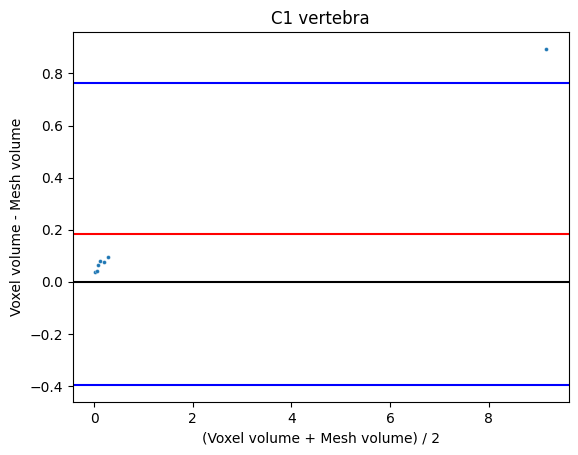

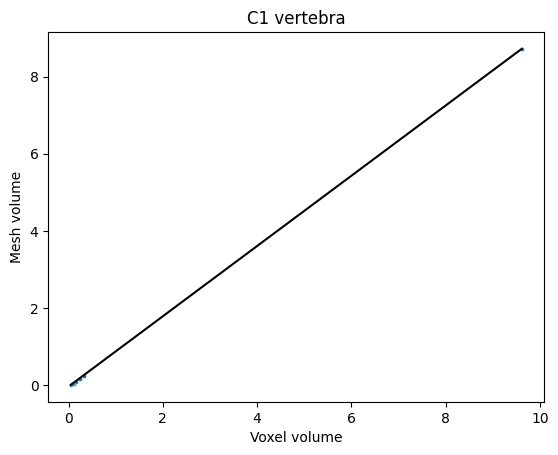

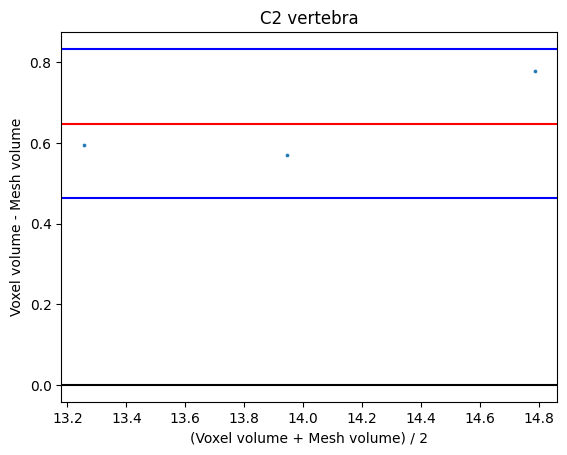

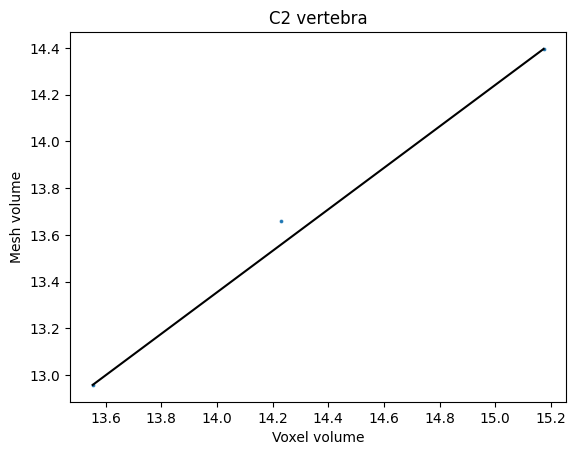

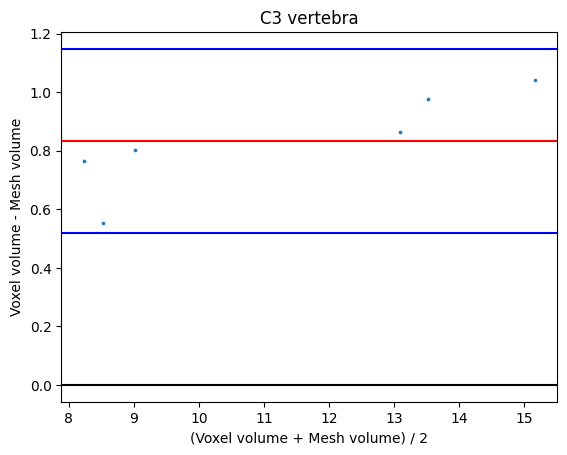

...

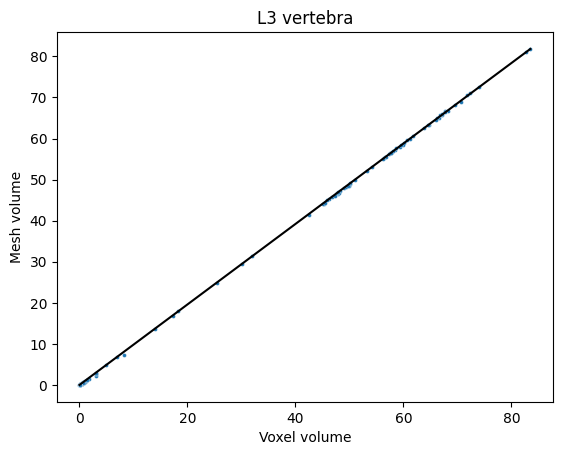

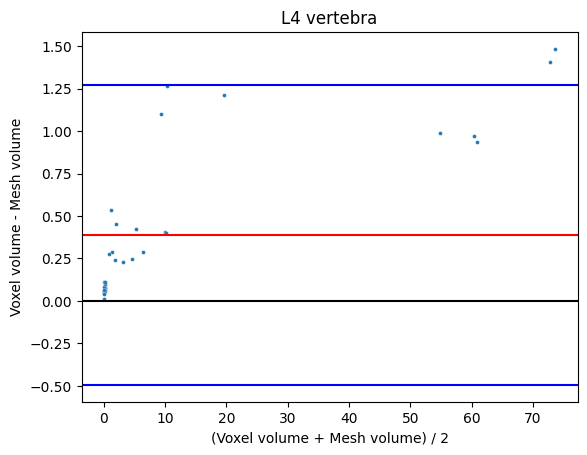

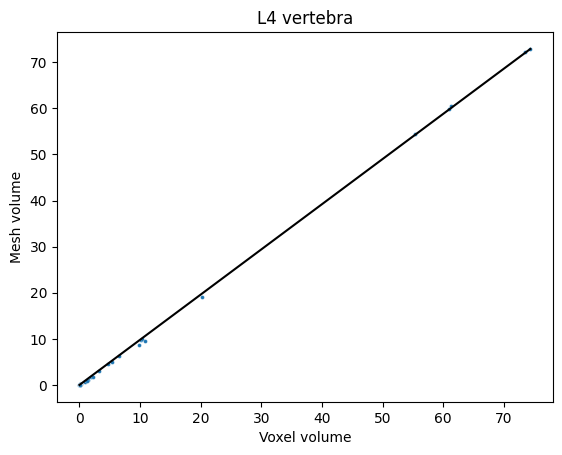

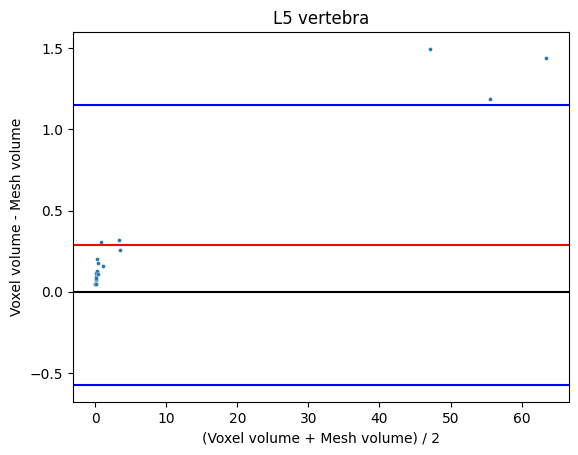

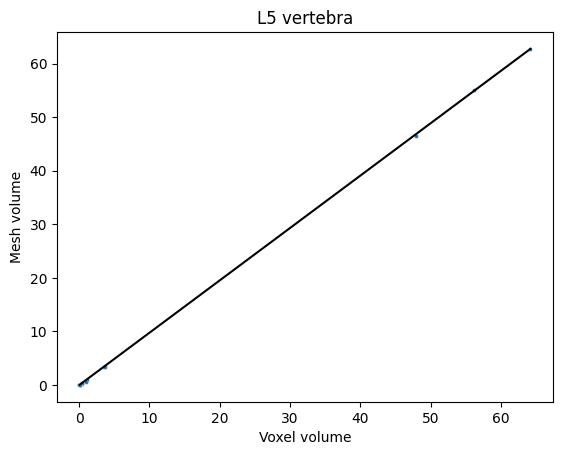

In [ ]:
from matplotlib.backends.backend_pdf import PdfPages

df_csv = pd.DataFrame()
bias_values = []
loa_top_values = []
loa_bottom_values = []
corr_values = []
region_list = []
number_of_patients = []

for region in region1_list:

  print('*** region: ' + str(region) + ' ***')

  pdf_file = '/content/pdf_figures_voxel_vs_mesh_volume/BlandAltman_and_correlation_plots_' + str(region) + '.pdf'
  print(pdf_file)
  pp = PdfPages(pdf_file)

  # BA plot
  df_plot = create_df_bland_altman_voxel_vs_mesh_volume(region, table_id, project_name)

  # Make sure we only keep the series that overlap
  features = list(set(df_plot['Quantity_CodeMeaning'].values))
  series_1 = df_plot[df_plot['Quantity_CodeMeaning'] == features[0]]['sourceSegmentedSeriesUID'].values
  series_2 = df_plot[df_plot['Quantity_CodeMeaning'] == features[1]]['sourceSegmentedSeriesUID'].values
  series_intersect = list(set(series_1) & set(series_2))
  df_plot = df_plot[df_plot['sourceSegmentedSeriesUID'].isin(series_intersect)]

  # now group by sourceSegmentedSeriesUID to have one column for Value_x and one for Value_y

  df_plot_pivoted = df_plot.pivot(index=['StudyInstanceUID', 'sourceSegmentedSeriesUID', 'age', 'gender', 'laterality', 'segmentation_completeness_check', 'findingSite_CodeMeaning', 'SeriesNumber', 'viewerUrl'],
                                columns='Quantity_CodeMeaning',
                                values='Value')
  df_plot_pivoted.reset_index(inplace=True)
  df_plot = df_plot_pivoted.copy(deep=True)
  # rename the columns
  df_plot = df_plot.rename(columns={"Approximate volume": "Value_x", "Volume": "Value_y", "viewerUrl":"viewer_url"})

  # Add in the x and y columns for BA
  new_column = [np.float32(f) for f in df_plot['Value_x'].values]
  df_plot['Value_x_numeric'] = new_column
  new_column = [np.float32(f) for f in df_plot['Value_y'].values]
  df_plot['Value_y_numeric'] = new_column
  df_plot['Value_x_numeric'] = df_plot['Value_x_numeric'] / 1000
  df_plot['Value_y_numeric'] = df_plot['Value_y_numeric'] / 1000
  df_plot['y'] = df_plot['Value_x_numeric'].values - df_plot['Value_y_numeric'].values
  df_plot['x'] = (df_plot['Value_x_numeric'].values + df_plot['Value_y_numeric'].values) / 2

  # Check if empty
  if (df_plot.empty) or (len(df_plot)==1):
    print('no values exist for this organ, skipping')
    continue
  else:
    plot1, bias_value, loa_top, loa_bottom = create_seaborn_plot_bland_altman(df_plot, region)
    number_of_patients.append(len(df_plot))
    region_list.append(region)

  # Get the outliers and only plot these using Bokeh
  df_plot_outliers_top = df_plot[df_plot['y']>loa_top]
  df_plot_outliers_bottom = df_plot[df_plot['y']<loa_bottom]
  df_plot_outliers = pd.concat([df_plot_outliers_top, df_plot_outliers_bottom])
  if not df_plot_outliers.empty:
    print('outliers exist, plotting bokeh plot')
    output_filename = os.path.join("/content/bokeh_figures_voxel_vs_mesh_volume/", str(region) + ".html")
    create_bokeh_plot_bland_altman_outliers(df_plot_outliers, bias_value, loa_top, loa_bottom, output_filename)

  # Correlation of voxel volume vs mesh volume
  plot2, corr_value = create_seaborn_correlation_plot(df_plot, region)

  # Save figures to pdf
  pp.savefig(plot1)
  pp.savefig(plot2)

  # Save values to df_csv
  bias_values.append(bias_value)
  loa_top_values.append(loa_top)
  loa_bottom_values.append(loa_bottom)
  corr_values.append(corr_value)

  pp.close()

In [ ]:
# Save csv
df_csv['region'] = region_list
df_csv['number_of_patients'] = number_of_patients
df_csv['bias'] = bias_values
df_csv['loa_top'] = loa_top_values
df_csv['loa_bottom'] = loa_bottom_values
df_csv['corr'] = corr_values
df_csv.to_csv(volumes_values_csv, index=False)

In [ ]:
# Zip files

!zip -r /content/bokeh_figures_voxel_vs_mesh_volume.zip /content/bokeh_figures_voxel_vs_mesh_volume
!zip -r /content/pdf_figures_voxel_vs_mesh_volume.zip /content/pdf_figures_voxel_vs_mesh_volume


  adding: content/bokeh_figures_voxel_vs_mesh_volume/ (stored 0%)
  adding: content/bokeh_figures_voxel_vs_mesh_volume/L1 vertebra.html (deflated 74%)
  adding: content/bokeh_figures_voxel_vs_mesh_volume/T9 vertebra.html (deflated 80%)
  adding: content/bokeh_figures_voxel_vs_mesh_volume/L4 vertebra.html (deflated 69%)
  adding: content/bokeh_figures_voxel_vs_mesh_volume/T12 vertebra.html (deflated 79%)
  adding: content/bokeh_figures_voxel_vs_mesh_volume/L2 vertebra.html (deflated 71%)
  adding: content/bokeh_figures_voxel_vs_mesh_volume/T7 vertebra.html (deflated 80%)
  adding: content/bokeh_figures_voxel_vs_mesh_volume/T6 vertebra.html (deflated 80%)
  adding: content/bokeh_figures_voxel_vs_mesh_volume/T2 vertebra.html (deflated 79%)
  adding: content/bokeh_figures_voxel_vs_mesh_volume/T5 vertebra.html (deflated 79%)
  adding: content/bokeh_figures_voxel_vs_mesh_volume/T10 vertebra.html (deflated 80%)
  adding: content/bokeh_figures_voxel_vs_mesh_volume/C6 vertebra.html (deflated 69

In [ ]:
# Download files

from google.colab import files
files.download("/content/bokeh_figures_voxel_vs_mesh_volume.zip")
files.download("/content/pdf_figures_voxel_vs_mesh_volume.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
files.download("/content/bokeh_figures_voxel_vs_mesh_volume.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## (SKIP) Check existence of organs between vertebrae

We want to make sure that if a pair of vertebraes exist, then the respective organ segmentations should also exist.

If both T12 and L3 exist -> both Kidneys should exist

If both T11 and T7 exist -> Spleen should exist

Or if T10 exists -> so should average position of Spleen

If T11 and T7 exist -> Liver should exist

Or if T9 exists -> so should average position of Liver

If T5 and T8 exist -> all heart chambers should exist




Query to return the OHIF urls of the cases where the vertebrae exist, but the organ in between does not.

In [ ]:
def check_existence_of_organs(region1, region2, region3, table_id):

  client = bigquery.Client(project=project_name)

  query = f"""

    SELECT
      DISTINCT(sourceSegmentedSeriesUID) as sourceSegmentedSeriesUID,
      CONCAT('https://idc-tester-dk-2-server.web.app/viewer/',
              StudyInstanceUID,
              '!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series') AS viewer_url
    FROM
      `idc-external-025.terra.nlst-126k-measurements-clinical-acquisition`
    WHERE
      findingSite.CodeMeaning IN (@region1, @region2) AND
      sourceSegmentedSeriesUID NOT IN (
        SELECT
          sourceSegmentedSeriesUID
        FROM
          `idc-external-025.terra.nlst-126k-measurements-clinical-acquisition`
        WHERE
          findingSite.CodeMeaning = @region3
    )
    GROUP BY
      sourceSegmentedSeriesUID,
      StudyInstanceUID
    HAVING
      COUNT(DISTINCT findingSite.CodeMeaning) = 2

    """

  job_config = bigquery.QueryJobConfig(query_parameters=[
                                                        bigquery.ScalarQueryParameter("region1", "STRING", region1),
                                                        bigquery.ScalarQueryParameter("region2", "STRING", region2),
                                                        bigquery.ScalarQueryParameter("region3", "STRING", region3),
                                                        ])
  df = client.query(query, job_config=job_config).to_dataframe()

  return df


In [ ]:
# Liver

region1 = "T11 vertebra"
region2 = "T7 vertebra"
region3 = "Liver"
df_plot = check_existence_of_organs(region1, region2, region3, table_id_126k)
print(len(df_plot))

30


In [ ]:
df_plot

,sourceSegmentedSeriesUID,viewer_url
0,1.3.6.1.4.1.14519.5.2.1.7009.9004.259873451115...,https://idc-tester-dk-2-server.web.app/viewer/...
1,1.3.6.1.4.1.14519.5.2.1.7009.9004.164739551667...,https://idc-tester-dk-2-server.web.app/viewer/...
2,1.3.6.1.4.1.14519.5.2.1.7009.9004.290340266774...,https://idc-tester-dk-2-server.web.app/viewer/...
3,1.3.6.1.4.1.14519.5.2.1.7009.9004.117848649117...,https://idc-tester-dk-2-server.web.app/viewer/...
4,1.3.6.1.4.1.14519.5.2.1.7009.9004.257003090421...,https://idc-tester-dk-2-server.web.app/viewer/...
5,1.2.840.113654.2.55.74795148742461421842221498...,https://idc-tester-dk-2-server.web.app/viewer/...
6,1.3.6.1.4.1.14519.5.2.1.7009.9004.788952687319...,https://idc-tester-dk-2-server.web.app/viewer/...
7,1.3.6.1.4.1.14519.5.2.1.7009.9004.140447528397...,https://idc-tester-dk-2-server.web.app/viewer/...
8,1.2.840.113654.2.55.52308100293117708326456221...,https://idc-tester-dk-2-server.web.app/viewer/...
9,1.3.6.1.4.1.14519.5.2.1.7009.9004.182517401252...,https://idc-tester-dk-2-server.web.app/viewer/...


In [ ]:
# Spleen

region1 = "T11 vertebra"
region2 = "T7 vertebra"
region3 = "Spleen"
df_plot = check_existence_of_organs(region1, region2, region3, table_id_126k)
print(len(df_plot))
df_plot

332


,sourceSegmentedSeriesUID,viewer_url
0,1.3.6.1.4.1.14519.5.2.1.7009.9004.326036122819...,https://idc-tester-dk-2-server.web.app/viewer/...
1,1.2.840.113654.2.55.21478611277821797334504866...,https://idc-tester-dk-2-server.web.app/viewer/...
2,1.2.840.113654.2.55.28417161521001195684879083...,https://idc-tester-dk-2-server.web.app/viewer/...
3,1.3.6.1.4.1.14519.5.2.1.7009.9004.270351206424...,https://idc-tester-dk-2-server.web.app/viewer/...
4,1.3.6.1.4.1.14519.5.2.1.7009.9004.143887288450...,https://idc-tester-dk-2-server.web.app/viewer/...
...,...,...
327,1.2.840.113654.2.55.15140793960117243156270007...,https://idc-tester-dk-2-server.web.app/viewer/...
328,1.2.840.113654.2.55.18179041965333823737780527...,https://idc-tester-dk-2-server.web.app/viewer/...
329,1.2.840.113654.2.55.26985042381790391308534297...,https://idc-tester-dk-2-server.web.app/viewer/...
330,1.2.840.113654.2.55.11569470996308468710378888...,https://idc-tester-dk-2-server.web.app/viewer/...


In [ ]:
# Kidneys

region1 = "T12 vertebra"
region2 = "L3 vertebra"
region3 = "Kidney"
df_plot = check_existence_of_organs(region1, region2, region3, table_id_126k)
print(len(df_plot))
df_plot

11


,sourceSegmentedSeriesUID,viewer_url
0,1.2.840.113654.2.55.20010852730469114336858689...,https://idc-tester-dk-2-server.web.app/viewer/...
1,1.2.840.113654.2.55.21907547243334882086615182...,https://idc-tester-dk-2-server.web.app/viewer/...
2,1.2.840.113654.2.55.12014790757043261883223650...,https://idc-tester-dk-2-server.web.app/viewer/...
3,1.2.840.113654.2.55.10041347963794082274806632...,https://idc-tester-dk-2-server.web.app/viewer/...
4,1.3.6.1.4.1.14519.5.2.1.7009.9004.632068019200...,https://idc-tester-dk-2-server.web.app/viewer/...
5,1.2.840.113654.2.55.12445734869934645308232880...,https://idc-tester-dk-2-server.web.app/viewer/...
6,1.2.840.113654.2.55.27512100247079098571248217...,https://idc-tester-dk-2-server.web.app/viewer/...
7,1.2.840.113654.2.55.11147481927766547950279027...,https://idc-tester-dk-2-server.web.app/viewer/...
8,1.2.840.113654.2.55.47155259020137785471385458...,https://idc-tester-dk-2-server.web.app/viewer/...
9,1.2.840.113654.2.55.97315702852783517697869142...,https://idc-tester-dk-2-server.web.app/viewer/...


This one has a lot of noise in the kidney areas! https://idc-tester-dk-2-server.web.app/viewer/1.2.840.113654.2.55.150950988008082165604908485393320003460!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series

# Left atrium

Truong QA, Bamberg F, Mahabadi AA, Toepker M, Lee H, Rogers IS, Seneviratne SK, Schlett CL, Brady TJ, Nagurney JT, Hoffmann U. Left atrial volume and index by multi-detector computed tomography: comprehensive analysis from predictors of enlargement to predictive value for acute coronary syndrome (ROMICAT study). International journal of cardiology. 2011 Jan 21;146(2):171-6.

They show:
1. LA volume increases with age
2. LA volume is significantly different between males and females
3. LA volume is significantly different between those with cardiovascular abnormalities and those without. The LA volume should be larger for those with cardiovascular abnormalities.


In [ ]:
region = "Left atrium"
feature = "Volume"
table_id = table_id_126k

Include only the patients where the left atrium was segmented fully.

In [ ]:
client = bigquery.Client(project=project_name)

query = f"""

    SELECT
      StudyInstanceUID,
      sourceSegmentedSeriesUID,
      PatientID,
      age,
      gender,
      Value,
      nlst_ctab.sct_ab_desc,
      viewerUrl,
      SeriesNumber
    FROM
      `{table_id}` as clinical_table
    JOIN
      `idc-external-025.terra.segmentation_completeness_table` as segmentation_completeness
    ON
      clinical_table.sourceSegmentedSeriesUID = segmentation_completeness.rssSIUD AND
      clinical_table.findingSite.CodeMeaning = segmentation_completeness.bodyPart
    JOIN
      `bigquery-public-data.idc_v15_clinical.nlst_ctab` as nlst_ctab
    ON
      clinical_table.PatientID = nlst_ctab.pid
    WHERE
      findingSite.CodeMeaning = @region AND
      Quantity.CodeMeaning = @feature AND
      segmentation_completeness_check = 'may_be_segmented_fully'
    ORDER BY
      clinical_table.sourceSegmentedSeriesUID

  """

job_config = bigquery.QueryJobConfig(query_parameters=[
                                                      bigquery.ScalarQueryParameter("region", "STRING", region),
                                                      bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                      ])
df = client.query(query, job_config=job_config).to_dataframe()


In [ ]:
# client = bigquery.Client(project=project_name)

# query = f"""

#   SELECT
#      DISTINCT(SOPInstanceUID),
#      StudyInstanceUID,
#      age,
#      gender,
#      Value,
#      nlst_ctab.sct_ab_desc
#   FROM
#     `idc-external-025.terra.nlst-126k-measurements-clinical-acquisition` as clinical_table
#   JOIN
#     `bigquery-public-data.idc_v15_clinical.nlst_ctab` as nlst_ctab
#   ON
#     clinical_table.PatientID = nlst_ctab.pid
#   WHERE
#       findingSite.CodeMeaning = @region AND
#       Quantity.CodeMeaning = @feature;

#   """

# job_config = bigquery.QueryJobConfig(query_parameters=[
#                                                       bigquery.ScalarQueryParameter("region", "STRING", region),
#                                                       bigquery.ScalarQueryParameter("feature", "STRING", feature)
#                                                       ])
# df = client.query(query, job_config=job_config).to_dataframe()



In [ ]:
df_plot = df.copy(deep=True)
df_plot['CV'] = [0]  * len(df_plot)
# df_plot[df_plot['sct_ab_desc']==60]['CV'] = 1
df_plot['CV'] = [1 if x==60 else 0 for x in df_plot['sct_ab_desc']]

In [ ]:
# First add ohif urls to dataframe
df_plot['viewer_url'] = [None] * len(df_plot)
df_plot['viewer_url'] = [os.path.join("https://idc-tester-dk-2-server.web.app/viewer",
                                      f,
                                      "!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series")
                         for f in df_plot['StudyInstanceUID'].values]

# https://idc-tester-dk-2-server.web.app/viewer/1.2.840.113654.2.55.222358418596811829743750475747304078456!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series


In [ ]:
# stats
num_series = len(df_plot)
num_patients = len(set(df_plot['PatientID'].values))
number_of_males_series = len(df_plot[df_plot['gender']=="M"])
number_of_females_series = len(df_plot[df_plot['gender']=="F"])
number_of_male_patients = len(set(df_plot[df_plot['gender']=="M"]['PatientID'].values))
number_of_female_patients = len(set(df_plot[df_plot['gender']=="F"]['PatientID'].values))

# df with just patient age row
df_age = df_plot.drop_duplicates(['PatientID'])
age_mean = np.mean(df_age['age'].values)
age_stddev = np.std(df_age['age'].values)

patients_with_cvd = len(df_age[df_age['CV']==1].values)
patients_with_no_cvd = len(df_age[df_age['CV']==0].values)

print('num_series: ' + str(num_series))
print('num_patients: ' + str(num_patients))
print('num_of_males_series: ' + str(number_of_males_series))
print('num_of_females_series: ' + str(number_of_females_series))
print('num_of_males_patients: ' + str(number_of_male_patients))
print('num_of_females_patients: ' + str(number_of_female_patients))

print('age_mean: ' + str(age_mean))
print('age_stddev: ' + str(age_stddev))

print('patients_with_cvd: ' + str(patients_with_cvd))
print('patients_with_no_cvd: ' + str(patients_with_no_cvd))

num_series: 907556
num_patients: 24264
num_of_males_series: 539776
num_of_females_series: 367780
num_of_males_patients: 14289
num_of_females_patients: 9975
age_mean: 61.54673590504451
age_stddev: 5.044726599534282
patients_with_cvd: 578
patients_with_no_cvd: 23686


## 1., 2. LA volume increases with age, and there are significant differences between males and females

Test to see if the LA volume increases with age.

Test to see if the LA volume for males is higher than for females, and if the difference is significant.

Get the correlation coefficient of age vs volume.

Text(0, 0.5, 'Volume in mL')

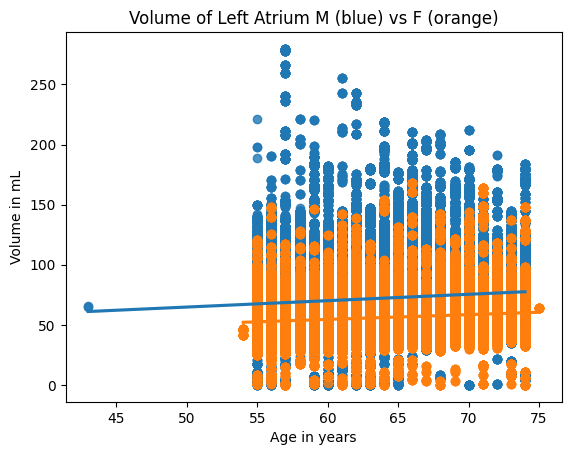

In [ ]:
new_column = [np.float32(f) for f in df_plot['Value'].values]
df_plot['Value_numeric'] = new_column
df_plot['Value_numeric'] = df_plot['Value_numeric'] / 1000.0

new_column = [np.float32(f) for f in df_plot['age'].values]
df_plot['age_numeric'] = new_column

df_plot_males = df_plot[df_plot['gender']=="M"]
df_plot_females = df_plot[df_plot['gender']=="F"]

# lm = sns.lmplot(x = "age_numeric", y = "Value_numeric",
#                 hue = "gender", data = df_plot,
#                 scatter_kws={"s": 10})

fig = plt.figure()

p1 = sns.regplot(data=df_plot_males, x=df_plot_males.age_numeric, y=df_plot_males.Value_numeric)

p2 = sns.regplot(data=df_plot_females, x=df_plot_females.age_numeric, y=df_plot_females.Value_numeric)

p2.set_title('Volume of Left Atrium M (blue) vs F (orange)')
p2.set_xlabel('Age in years')
p2.set_ylabel('Volume in mL')

In [ ]:
fig = plt.figure()

p1 = sns.regplot(data=df_plot_males, x=df_plot_males.age_numeric, y=df_plot_males.Value_numeric)


males_slope, males_intercept, males_r, males_p, males_sterr = scipy.stats.linregress(x=p1.get_lines()[0].get_xdata(),
                                                                                     y=p1.get_lines()[0].get_ydata())

print('males: ')
print('slope: ' + str(males_slope))
print('intercept: ' + str(males_intercept))

plt.close()

male_mean_volume = np.mean(df_plot_males['Value_numeric'].values)
male_stddev_volume = np.std(df_plot_males['Value_numeric'].values)
print('male mean volume: ' + str(male_mean_volume))
print('male stddev volume: ' + str(male_stddev_volume))

males: 
slope: 0.5304157616607925
intercept: 38.268981597602235
male mean volume: 71.27786
male stddev volume: 18.18433


In [ ]:
fig = plt.figure()

p2 = sns.regplot(data=df_plot_females, x=df_plot_females.age_numeric, y=df_plot_females.Value_numeric)

females_slope, females_intercept, females_r, females_p, females_sterr = scipy.stats.linregress(x=p2.get_lines()[0].get_xdata(),
                                                                                               y=p2.get_lines()[0].get_ydata())

print('females: ')
print('slope: ' + str(females_slope))
print('intercept: ' + str(females_intercept))

plt.close()

female_mean_volume = np.mean(df_plot_females['Value_numeric'].values)
female_stddev_volume = np.std(df_plot_females['Value_numeric'].values)
print('female mean volume: ' + str(female_mean_volume))
print('female stddev volume: ' + str(female_stddev_volume))

females: 
slope: 0.3986266031305956
intercept: 30.586876503821607
female mean volume: 55.169025
female stddev volume: 13.113106


Since we have a positive slope for both, the LA volume increases with age.

And since the intercept is higher for males, they have a higher volume compared to females.

Now test to see if significantly different between M and F.

In [ ]:
from scipy.stats import mannwhitneyu

df_plot_males = df_plot[df_plot['gender'] == "M"]["Value_numeric"].values
df_plot_females = df_plot[df_plot['gender'] == "F"]["Value_numeric"].values
U1, p = mannwhitneyu(df_plot_males, df_plot_females)
print(U1)
print(p)


30074304448.5
0.0


Since p << 0.001, statistically significant.

Now get the correlation of the males, for age vs volume. Do the same for females. Both should be weakly correlated.

In [ ]:
corr_coef_males = scipy.stats.pearsonr(df_plot[df_plot['gender']=="M"]["age_numeric"].values,
                                       df_plot[df_plot['gender']=="M"]['Value_numeric'].values)
corr_coef_females = scipy.stats.pearsonr(df_plot[df_plot['gender']=="F"]["age_numeric"].values,
                                       df_plot[df_plot['gender']=="F"]['Value_numeric'].values)

print('corr_coef_males: ' + str(corr_coef_males[0,1]))
print('corr_coef_females: ' + str(corr_coef_females[0,1]))

corr_coef_males: 0.1510435900559237
corr_coef_females: 0.15295050494567505


This shows age vs volume are weakly correlated for both M and F.

In [ ]:
# ########## create bokeh plot with ohif urls

# output_notebook()

# # set the seed so jitter will be the same for each run
# np.random.seed(0)
# random.seed(0)

# #--- create df of the feature we want to plot ---#

# new_column = [np.float32(f) for f in df_plot['Value'].values]
# df_plot['Value_numeric'] = new_column

# colormap, colors = color_list_generator(df_plot, 'gender')
# df_plot['colors'] = colors
# # cats = df_plot.gender.unique()
# cats = list(colormap.keys())
# colors = list(colormap.values())

# # --- scatterplot of age on y axis vs feature on x axis for each gender --- #
# # --- also draw regression lines for each gender --- #

# hover = HoverTool(tooltips=[
#   (''.join(["(",'feature',")"]), "($y)")
# ])

# wZoom = WheelZoomTool()
# bZoom = BoxZoomTool()
# reset = ResetTool()
# tap = TapTool()
# pan = PanTool()

# p = figure(tools = [hover, wZoom, bZoom, reset, tap, pan])

# # add scatter plot
# l1 = p.circle(x='age', y='Value_numeric', source=df_plot, size=3, alpha=1, color='colors')
# legend = Legend(items=[LegendItem(label=dict(field="gender"), renderers=[l1])])
# p.add_layout(legend, 'below')

# # add best fit line for each of the genders - create dataframe for plotting
# df_plot_with_line = pd.DataFrame()
# for g in range(0,len(colors)):
#   df_plot_line = df_plot[df_plot['gender']==cats[g]]
#   x = np.asarray(df_plot_line['age'].values).astype(np.float32)
#   y = np.asarray(df_plot_line['Value_numeric'].values)
#   par = np.polyfit(x, y, 1, full=True)
#   slope=par[0][0]
#   intercept=par[0][1]
#   y_predicted = [slope*i + intercept  for i in x]
#   # add to dataframe
#   df_plot_line['y_predicted'] = y_predicted
#   # df_plot_with_line = pd.concat([df_plot_with_line, df_plot_line])

#   l2 = p.line(x='age',y='y_predicted',source=df_plot_line, alpha=1, line_color=colors[g])



# # Add url
# url="@viewer_url"
# taptool = p.select(type=TapTool)
# taptool.callback = OpenURL(url=url)

# # Setup plot titles and such.
# p.title.text = 'Age vs ' + region + ' ' + feature
# p.xaxis.axis_label = 'Age'
# # p.xgrid.grid_line_color = None
# p.ygrid.grid_line_color = "white"
# p.grid.grid_line_width = 2
# # p.xaxis.major_label_text_font_size="0pt"
# # p.xaxis.major_label_orientation = np.pi/4
# p.yaxis.axis_label= region + ' ' + feature


# # show the plot
# show(p)


## 3.LA volume is significantly different between those with cardiovascular abnormalities and those without. The LA volume should be larger for those with cardiovascular abnormalities.


There should be a significant difference between CVD and no CVD in Volume.

The ones with CVD should be larger.

median with CVD: 67.57875
median with no CVD: 62.168625
CVD mean volume: 70.08097
CVD stddev volume: 19.754879
no CVD mean volume: 64.61472
no CVD stddev volume: 18.072092


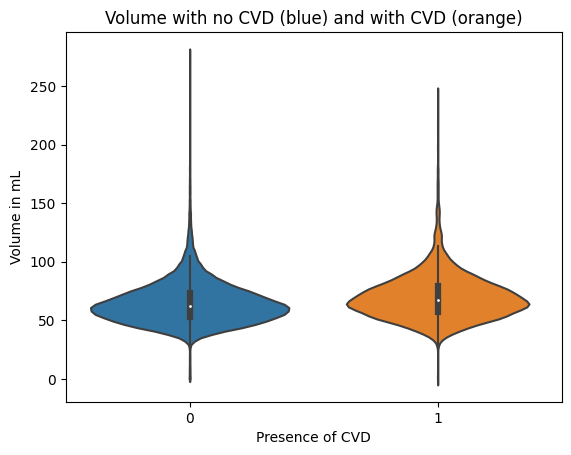

In [ ]:
p = sns.violinplot(data=df_plot, x="CV", y="Value_numeric")
p.set_title('Volume with no CVD (blue) and with CVD (orange)')
p.set_xlabel('Presence of CVD')
p.set_ylabel('Volume in mL')

median_with_CVD = np.median(df_plot[df_plot['CV'] == 1]["Value_numeric"].values)
median_with_no_CVD = np.median(df_plot[df_plot['CV'] == 0]["Value_numeric"].values)

print('median with CVD: ' + str(median_with_CVD))
print('median with no CVD: ' + str(median_with_no_CVD))

cvd_mean_volume = np.mean(df_plot[df_plot['CV'] == 1]["Value_numeric"].values)
cvd_stddev_volume = np.std(df_plot[df_plot['CV'] == 1]["Value_numeric"].values)
no_cvd_mean_volume = np.mean(df_plot[df_plot['CV'] == 0]["Value_numeric"].values)
no_cvd_stddev_volume = np.std(df_plot[df_plot['CV'] == 0]["Value_numeric"].values)

print('CVD mean volume: ' + str(cvd_mean_volume))
print('CVD stddev volume: ' + str(cvd_stddev_volume))
print('no CVD mean volume: ' + str(no_cvd_mean_volume))
print('no CVD stddev volume: ' + str(no_cvd_stddev_volume))

Visually, it seems that those with CV issues have larger volumes.

Now let's see if there is a significant difference:

In [ ]:
from scipy.stats import mannwhitneyu

df_plot_males = df_plot[df_plot['CV'] == 1]["Value_numeric"].values
df_plot_females = df_plot[df_plot['CV'] == 0]["Value_numeric"].values
U1, p = mannwhitneyu(df_plot_males, df_plot_females)
print(U1)
print(p)

11726785513.5
0.0


There is a significant difference between the LA volumes of patients with significant cardiovascular abnormality, and those without!

# Vertebrae analysis

From the paper:

Duan Y, Turner CH, Kim BT, Seeman E. Sexual dimorphism in vertebral fragility is more the result of gender differences in age‐related bone gain than bone loss. Journal of Bone and Mineral Research. 2001 Dec;16(12):2267-75.

1. L3 volume increases with age
2. There is a significant difference in M vs F

(A paper we could think about: Gilsanz V, Boechat MI, Gilsanz R, Loro ML, Roe TF, Goodman WG. Gender differences in vertebral sizes in adults: biomechanical implications. Radiology. 1994 Mar;190(3):678-82.)

In [ ]:
region = "L1 vertebra"
feature = "Volume"
table_id = table_id_126k

Include only the patients where the vertebra was segmented fully.

In [ ]:
client = bigquery.Client(project=project_name)

query = f"""

    SELECT
      StudyInstanceUID,
      sourceSegmentedSeriesUID,
      PatientID,
      age,
      gender,
      Value,
      viewerUrl,
      SeriesNumber
    FROM
      `{table_id}` as clinical_table
    JOIN
      `idc-external-025.terra.segmentation_completeness_table` as segmentation_completeness
    ON
      clinical_table.sourceSegmentedSeriesUID = segmentation_completeness.rssSIUD AND
      clinical_table.findingSite.CodeMeaning = segmentation_completeness.bodyPart
    WHERE
      findingSite.CodeMeaning = @region AND
      Quantity.CodeMeaning = @feature AND
      segmentation_completeness_check = 'may_be_segmented_fully'
    ORDER BY
      clinical_table.sourceSegmentedSeriesUID

  """

job_config = bigquery.QueryJobConfig(query_parameters=[
                                                      bigquery.ScalarQueryParameter("region", "STRING", region),
                                                      bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                      ])
df = client.query(query, job_config=job_config).to_dataframe()


## The volume of vertebrae should be significantly different between males and females

In [ ]:
def create_seaborn_plot_scatterplot_gender(df):

  # Histograms of Volume values F vs M
  histogram = sns.histplot(data=df, x="Value_numeric", hue="gender")
  histogram.set(xlabel = feature + ' in mL', ylabel = "Count", title = region + ' ' + feature + ' M vs F')

  return

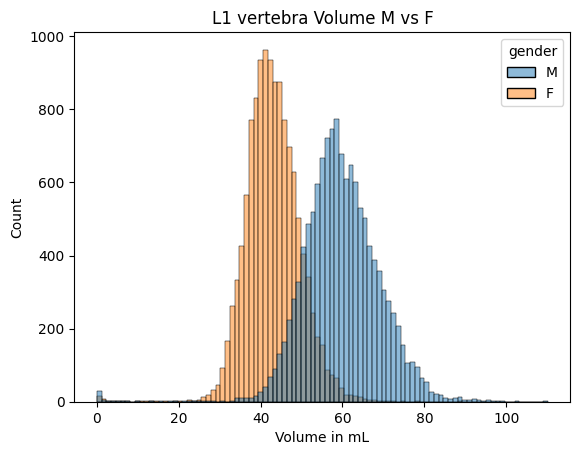

In [ ]:
df['Value_numeric'] = [np.float32(f) for f in df['Value'].values]
df['Value_numeric'] = df['Value_numeric'] / 1000.0
create_seaborn_plot_scatterplot_gender(df)

Text(0, 0.5, 'Volume in mL')

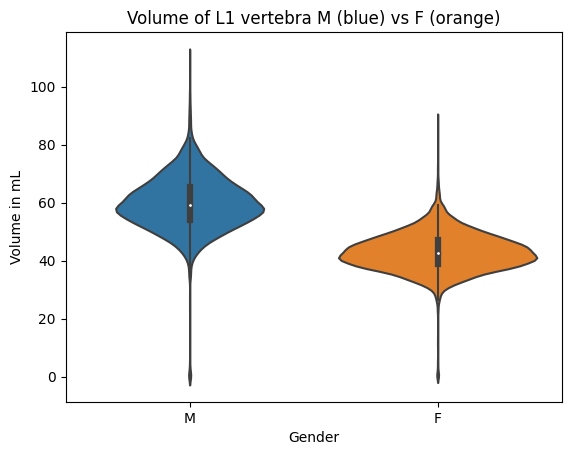

In [ ]:
p = sns.violinplot(data=df_plot, x="gender", y="Value_numeric")
p.set_title('Volume of L1 vertebra M (blue) vs F (orange)')
p.set_xlabel('Gender')
p.set_ylabel('Volume in mL')

In [ ]:
# Get stats

num_series = len(df)
num_patients = len(set(df['PatientID'].values))
num_male_series = len(df[df['gender']=="M"])
df_patient = df.drop_duplicates(['PatientID'])
num_male_patients = len(df_patient[df_patient['gender']=="M"])
age_min = np.min(df['age'].values)
age_max = np.max(df['age'].values)

print('num_series: ' + str(num_series))
print('num_patients: ' + str(num_patients))
print('num_male_series: ' + str(num_male_series))
print('num_males_patients: ' + str(num_male_patients))
print('age_min: ' + str(age_min))
print('age_max: ' + str(age_max))

num_series: 25365
num_patients: 9702
num_male_series: 12889
num_males_patients: 5132
age_min: 43
age_max: 74


## The volume of vertebra L1 increases with age

In [ ]:
df_plot = df.copy(deep=True)

Text(0, 0.5, 'Volume in mL')

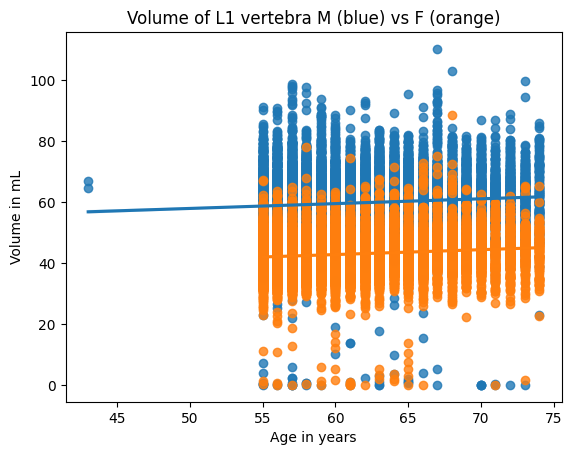

In [ ]:
new_column = [np.float32(f) for f in df_plot['Value'].values]
df_plot['Value_numeric'] = new_column
df_plot['Value_numeric'] = df_plot['Value_numeric'] / 1000.0

new_column = [np.float32(f) for f in df_plot['age'].values]
df_plot['age_numeric'] = new_column

df_plot_males = df_plot[df_plot['gender']=="M"]
df_plot_females = df_plot[df_plot['gender']=="F"]

# lm = sns.lmplot(x = "age_numeric", y = "Value_numeric",
#                 hue = "gender", data = df_plot,
#                 scatter_kws={"s": 10})

fig = plt.figure()

p1 = sns.regplot(data=df_plot_males, x=df_plot_males.age_numeric, y=df_plot_males.Value_numeric)

p2 = sns.regplot(data=df_plot_females, x=df_plot_females.age_numeric, y=df_plot_females.Value_numeric)

p2.set_title('Volume of L1 vertebra M (blue) vs F (orange)')
p2.set_xlabel('Age in years')
p2.set_ylabel('Volume in mL')

In [ ]:
fig = plt.figure()

p1 = sns.regplot(data=df_plot_males, x=df_plot_males.age_numeric, y=df_plot_males.Value_numeric)


males_slope, males_intercept, males_r, males_p, males_sterr = scipy.stats.linregress(x=p1.get_lines()[0].get_xdata(),
                                                                                     y=p1.get_lines()[0].get_ydata())

print('males: ')
print('slope: ' + str(males_slope))
print('intercept: ' + str(males_intercept))

plt.close()

male_mean_volume = np.mean(df_plot_males['Value_numeric'].values)
male_stddev_volume = np.std(df_plot_males['Value_numeric'].values)
print('male mean volume: ' + str(male_mean_volume))
print('male stddev volume: ' + str(male_stddev_volume))

males: 
slope: 0.15794811783409302
intercept: 49.98204476036209
male mean volume: 59.75011
male stddev volume: 9.388227


In [ ]:
fig = plt.figure()

p2 = sns.regplot(data=df_plot_females, x=df_plot_females.age_numeric, y=df_plot_females.Value_numeric)

females_slope, females_intercept, females_r, females_p, females_sterr = scipy.stats.linregress(x=p2.get_lines()[0].get_xdata(),
                                                                                               y=p2.get_lines()[0].get_ydata())

print('females: ')
print('slope: ' + str(females_slope))
print('intercept: ' + str(females_intercept))

plt.close()

female_mean_volume = np.mean(df_plot_females['Value_numeric'].values)
female_stddev_volume = np.std(df_plot_females['Value_numeric'].values)
print('female mean volume: ' + str(female_mean_volume))
print('female stddev volume: ' + str(female_stddev_volume))

females: 
slope: 0.15985205580286416
intercept: 33.16624168377447
female mean volume: 42.982872
female stddev volume: 6.6137505


Since we have a positive slope for both, the LA volume increases with age.

And since the intercept is higher for males, they have a higher volume compared to females.

Now test to see if significantly different between M and F.

In [ ]:
from scipy.stats import mannwhitneyu

df_plot_males = df_plot[df_plot['gender'] == "M"]["Value_numeric"].values
df_plot_females = df_plot[df_plot['gender'] == "F"]["Value_numeric"].values
U1, p = mannwhitneyu(df_plot_males, df_plot_females)
print(U1)
print(p)


151731674.0
0.0


Since p << 0.001, statistically significant.

Now get the correlation of the males, for age vs volume. Do the same for females. Both should be weakly correlated.

In [ ]:
corr_coef_males = scipy.stats.pearsonr(df_plot[df_plot['gender']=="M"]["age_numeric"].values,
                                       df_plot[df_plot['gender']=="M"]['Value_numeric'].values)
corr_coef_females = scipy.stats.pearsonr(df_plot[df_plot['gender']=="F"]["age_numeric"].values,
                                       df_plot[df_plot['gender']=="F"]['Value_numeric'].values)

print('corr_coef_males: ' + str(corr_coef_males))
print('corr_coef_females: ' + str(corr_coef_females))

corr_coef_males: PearsonRResult(statistic=0.08620366387215295, pvalue=1.0823179487536325e-22)
corr_coef_females: PearsonRResult(statistic=0.12211012430930804, pvalue=1.1795965570061902e-42)


This shows age vs volume are weakly correlated for both M and F.

# (OLD) L3 vs age

Duan Y, Turner CH, Kim BT, Seeman E. Sexual dimorphism in vertebral fragility is more the result of gender differences in age‐related bone gain than bone loss. Journal of Bone and Mineral Research. 2001 Dec;16(12):2267-75.


1. The volume of vertebra L3 increases with age
2. The volume of vertebrae should be significantly different between males and females

Volume of L3 increases with age. F = open circles, M = filled circles. Significant differences between the two genders.

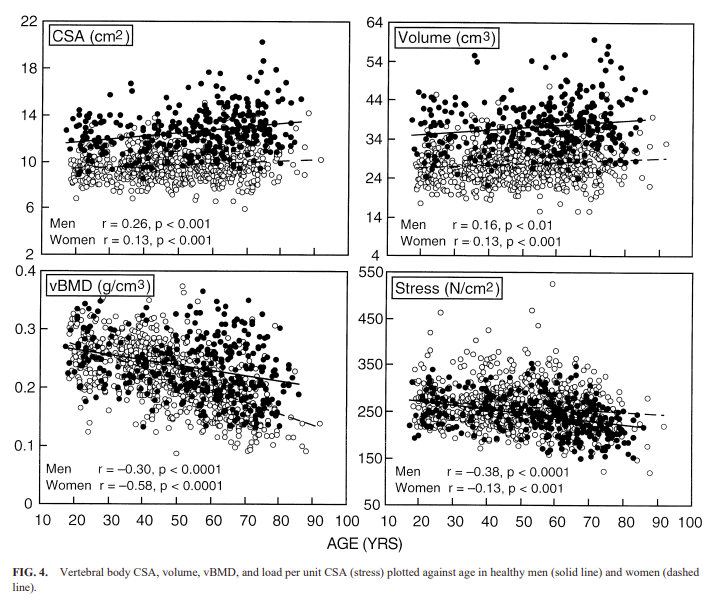

##1.The volume of vertebra L3 increases with age

First let's see how many patients have L3. We might have to pick a vertebrae above, as many might not have been scanned up to L3.

L1 vertebrae = 117138 series

L3 vertebrae = 12343 series

In [ ]:
client = bigquery.Client(project=project_name)

query = f"""

SELECT
    DISTINCT(findingSite.CodeMeaning) AS findingSite_CodeMeaning,
    COUNT(DISTINCT(sourceSegmentedSeriesUID)) AS num_series
FROM
  `{table_id_126k}`
GROUP BY
  findingSite.CodeMeaning
ORDER BY
  findingSite.CodeMeaning;
"""

df = client.query(query).to_dataframe()

In [ ]:
df

,findingSite_CodeMeaning,num_series
0,Adrenal gland,124569
1,Aorta,126050
2,Brain,152
3,C1 vertebra,14
4,C2 vertebra,21
...,...,...
71,Third rib,125780
72,Trachea,125854
73,Twelfth rib,120289
74,Upper lobe of lung,126034


Create plots in seaborn for particular region + feature comparing M and F.

In [ ]:
def create_seaborn_plot_scatterplot_gender(region, feature, table_id):

  client = bigquery.Client(project=project_name)
  print(table_id)

  query = f"""

  SELECT
     DISTINCT(SOPInstanceUID),
     age,
     gender,
     Value
  FROM
    `{table_id}`
  WHERE
      findingSite.CodeMeaning = @region AND
      Quantity.CodeMeaning = @feature;
  """

  job_config = bigquery.QueryJobConfig(query_parameters=[
                                                        bigquery.ScalarQueryParameter("region", "STRING", region),
                                                        bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                        ])
  df = client.query(query, job_config=job_config).to_dataframe()

  # Histograms of Volume values F vs M
  histogram = sns.histplot(data=df, x="Value", hue="gender")
  histogram.set(xlabel = feature, ylabel = "Count", title = feature + ' M vs F')

  return

Instead of L3 like the paper above, we do L1. As some patients may not have been scanned all the way to L3.

idc-external-025.terra.nlst-126k-measurements-clinical-acquisition


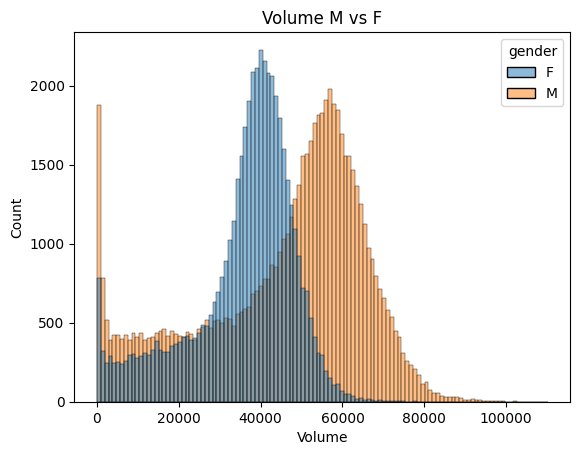

In [ ]:
create_seaborn_plot_scatterplot_gender('L1 vertebra', 'Volume', table_id_126k)

In [ ]:
def create_bokeh_plot_scatterplot_age(region, feature, table_id, viewer_url_string=None):

  client = bigquery.Client(project=project_name)
  print(table_id)

  # if name of table contains 10k, include the viewer_url
  if "10k" in table_id:
    query = f"""
      SELECT
        DISTINCT(SOPInstanceUID),
        StudyInstanceUID,
        PatientID,
        age,
        gender,
        Value,
        viewer_url
      FROM
        `{table_id}`
      WHERE
        findingSite.CodeMeaning = @region AND
        Quantity.CodeMeaning = @feature;
    """
    job_config = bigquery.QueryJobConfig(query_parameters=[
                                                          bigquery.ScalarQueryParameter("region", "STRING", region),
                                                          bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                          ])
    df_plot = client.query(query, job_config=job_config).to_dataframe()

  elif "126k" in table_id:
    query = f"""
      SELECT
        DISTINCT(SOPInstanceUID),
        StudyInstanceUID,
        PatientID,
        age,
        gender,
        Value
      FROM
        `{table_id}`
      WHERE
        findingSite.CodeMeaning = @region AND
        Quantity.CodeMeaning = @feature;
    """
    job_config = bigquery.QueryJobConfig(query_parameters=[
                                                          bigquery.ScalarQueryParameter("region", "STRING", region),
                                                          bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                          ])
    df_plot = client.query(query, job_config=job_config).to_dataframe()

    # add on the viewer_urls
    df_plot['viewer_url'] = [None] * len(df_plot)
    df_plot['viewer_url'] = [os.path.join("https://idc-tester-dk-2-server.web.app/viewer",
                                          f,
                                          "!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series")
                            for f in df_plot['StudyInstanceUID'].values]

  ########## create bokeh plot with ohif urls

  output_notebook()

  # set the seed so jitter will be the same for each run
  np.random.seed(0)
  random.seed(0)

  #--- create df of the feature we want to plot ---#

  new_column = [np.float32(f) for f in df_plot['Value'].values]
  df_plot['Value_numeric'] = new_column

  colormap, colors = color_list_generator(df_plot, 'gender')
  df_plot['colors'] = colors
  # cats = df_plot.gender.unique()
  cats = list(colormap.keys())
  colors = list(colormap.values())

  # --- scatterplot of age on y axis vs feature on x axis for each gender --- #
  # --- also draw regression lines for each gender --- #

  hover = HoverTool(tooltips=[
    (''.join(["(",'feature',")"]), "($y)")
  ])

  wZoom = WheelZoomTool()
  bZoom = BoxZoomTool()
  reset = ResetTool()
  tap = TapTool()
  pan = PanTool()

  p = figure(tools = [hover, wZoom, bZoom, reset, tap, pan])

  # add scatter plot
  l1 = p.circle(x='age', y='Value_numeric', source=df_plot, size=3, alpha=1, color='colors')
  legend = Legend(items=[LegendItem(label=dict(field="gender"), renderers=[l1])])
  p.add_layout(legend, 'below')

  # add best fit line for each of the genders - create dataframe for plotting
  df_plot_with_line = pd.DataFrame()
  for g in range(0,len(colors)):
    df_plot_line = df_plot[df_plot['gender']==cats[g]]
    x = np.asarray(df_plot_line['age'].values).astype(np.float32)
    y = np.asarray(df_plot_line['Value_numeric'].values)
    par = np.polyfit(x, y, 1, full=True)
    slope=par[0][0]
    intercept=par[0][1]
    y_predicted = [slope*i + intercept  for i in x]
    # add to dataframe
    df_plot_line['y_predicted'] = y_predicted
    # df_plot_with_line = pd.concat([df_plot_with_line, df_plot_line])

    l2 = p.line(x='age',y='y_predicted',source=df_plot_line, alpha=1, line_color=colors[g])



  # Add url
  url="@viewer_url"
  taptool = p.select(type=TapTool)
  taptool.callback = OpenURL(url=url)

  # Setup plot titles and such.
  p.title.text = 'Age vs ' + region + ' ' + feature
  p.xaxis.axis_label = 'Age'
  # p.xgrid.grid_line_color = None
  p.ygrid.grid_line_color = "white"
  p.grid.grid_line_width = 2
  # p.xaxis.major_label_text_font_size="0pt"
  # p.xaxis.major_label_orientation = np.pi/4
  p.yaxis.axis_label= region + ' ' + feature


  # show the plot
  show(p)



  return df_plot


This looks similar to the plot from the paper, similar trend.

In [ ]:
df_plot = create_bokeh_plot_scatterplot_age("L1 vertebra", "Volume", table_id_10k)


idc-external-025.terra.10k-series-data-061023-measurements-clinical-viewer_table_Deepa


In [ ]:
# view for 126k - memory issues

# df_plot = create_bokeh_plot_scatterplot_age("L1 vertebra", "Volume", table_id_126k)


idc-external-025.terra.nlst-126k-measurements-clinical-acquisition
in 126k
created df for 126k


idc-external-025.terra.nlst-126k-measurements-clinical-acquisition


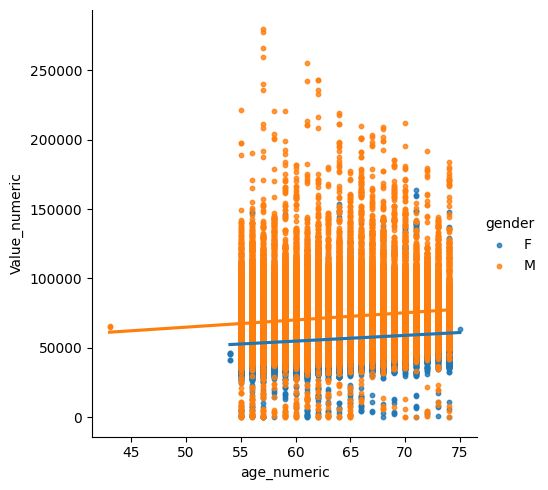

In [ ]:
client = bigquery.Client(project=project_name)
print(table_id)

query = f"""
  SELECT
    DISTINCT(SOPInstanceUID),
    StudyInstanceUID,
    PatientID,
    age,
    gender,
    Value
  FROM
    `{table_id}`
  WHERE
    findingSite.CodeMeaning = @region AND
    Quantity.CodeMeaning = @feature;
"""
job_config = bigquery.QueryJobConfig(query_parameters=[
                                                      bigquery.ScalarQueryParameter("region", "STRING", region),
                                                      bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                      ])
df_plot = client.query(query, job_config=job_config).to_dataframe()

# add on the viewer_urls
df_plot['viewer_url'] = [None] * len(df_plot)
df_plot['viewer_url'] = [os.path.join("https://idc-tester-dk-2-server.web.app/viewer",
                                      f,
                                      "!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_total_070823/dicomStores/126k-series")
                        for f in df_plot['StudyInstanceUID'].values]

new_column = [np.float32(f) for f in df_plot['Value'].values]
df_plot['Value_numeric'] = new_column
new_column = [np.float32(f) for f in df_plot['age'].values]
df_plot['age_numeric'] = new_column
sns.lmplot(x = "age_numeric", y = "Value_numeric",
           hue = "gender", data = df_plot,
          scatter_kws={"s": 10})

## 2.The volume of vertebrae should be significantly different between males and females

There should be a significant difference between M and F

In [ ]:
from scipy.stats import mannwhitneyu

df_plot_males = df_plot[df_plot['gender'] == "M"]["Value_numeric"].values
df_plot_females = df_plot[df_plot['gender'] == "F"]["Value_numeric"].values
U1, p = mannwhitneyu(df_plot_males, df_plot_females)
print(U1)
print(p)


15497933.5
1.4060121899580003e-296


The p value is small, so there is a significant difference!

# Lung analysis with emphysema

1. Those with emphysema have larger lung volumes
2. Those with emphysema have a reduction in surface to volume ratio
3. Emphysema is identified by higher percentage of lower attenuation areas
4. There is more thickening of the lumen in airways in those with emphysema - difference in trachea??

1. https://respiratory-research.biomedcentral.com/articles/10.1186/s12931-019-1047-5 Tanabe N, Sato S, Oguma T, Shima H, Sato A, Muro S, Hirai T. Associations of airway tree to lung volume ratio on computed tomography with lung function and symptoms in chronic obstructive pulmonary disease. Respiratory Research. 2019 Dec;20:1-8.

2. https://www.atsjournals.org/doi/epdf/10.1164/ajrccm.159.3.9805067?role=tab Coxson HO, Rogers RM, Whittall KP, D'YACHKOVA YU, Pare PD, Sciurba FC, Hogg JC. A quantification of the lung surface area in emphysema using computed tomography. American journal of respiratory and critical care medicine. 1999 Mar 1;159(3):851-6.

3. https://erj.ersjournals.com/content/18/4/720 Madani A, Keyzer C, Gevenois PA. Quantitative computed tomography assessment of lung structure and function in pulmonary emphysema. European Respiratory Journal. 2001 Oct 1;18(4):720-30.

4. https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1994221/pdf/AJRCCM1763243.pdf Martinez FJ, Curtis JL, Sciurba F, Mumford J, Giardino ND, Weinmann G, Kazerooni E, Murray S, Criner GJ, Sin DD, Hogg J. Sex differences in severe pulmonary emphysema. American journal of respiratory and critical care medicine. 2007 Aug 1;176(3):243-52.

other:
https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4213995/

## 1.Those with emphysema have larger lung volume

In [ ]:
def query_for_condition(region, feature, table_id, project_name):

  client = bigquery.Client(project=project_name)
  print(table_id)

  query = f"""
    SELECT
      DISTINCT(SOPInstanceUID),
      StudyInstanceUID,
      age,
      gender,
      Value,
      nlst_ctab.sct_ab_desc
    FROM
      `idc-external-025.terra.nlst-126k-measurements-clinical-acquisition` as clinical_table
    JOIN
      `bigquery-public-data.idc_v15_clinical.nlst_ctab` as nlst_ctab
    ON
      clinical_table.PatientID = nlst_ctab.pid
    WHERE
        findingSite.CodeMeaning = @region AND
        Quantity.CodeMeaning = @feature;

    """
  job_config = bigquery.QueryJobConfig(query_parameters=[
                                                        bigquery.ScalarQueryParameter("region", "STRING", region),
                                                        bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                        ])
  df = client.query(query, job_config=job_config).to_dataframe()

  return df


In [ ]:
table_id = table_id_126k
region = "Lower lobe of lung"
feature = "Volume"
df = query_for_condition(region, feature, table_id, project_name)

idc-external-025.terra.nlst-126k-measurements-clinical-acquisition


median with emphysema: 1299520.1
median without emphysema: 1285630.9


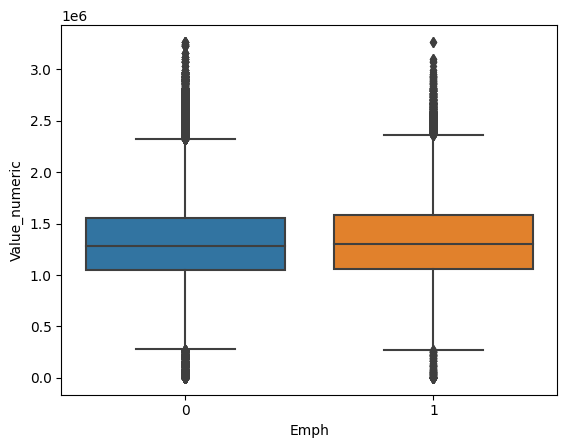

In [ ]:
df_plot = df.copy(deep=True)
df_plot['Emph'] = [0]  * len(df_plot)
df_plot['Emph'] = [1 if x==59 else 0 for x in df_plot['sct_ab_desc']]

new_column = [np.float32(f) for f in df_plot['Value'].values]
df_plot['Value_numeric'] = new_column
new_column = [np.float32(f) for f in df_plot['age'].values]
df_plot['age_numeric'] = new_column

sns.boxplot(data=df_plot, x="Emph", y="Value_numeric")

median_with = np.median(df_plot[df_plot['Emph'] == 1]["Value_numeric"].values)
median_without = np.median(df_plot[df_plot['Emph'] == 0]["Value_numeric"].values)
print ('median with emphysema: ' + str(median_with))
print ('median without emphysema: ' + str(median_without))


In [ ]:
from scipy.stats import mannwhitneyu

df_plot_with = df_plot[df_plot['Emph'] == 1]["Value_numeric"].values
df_plot_without = df_plot[df_plot['Emph'] == 0]["Value_numeric"].values
U1, p = mannwhitneyu(df_plot_with, df_plot_without)
print(U1)
print(p)

39541081068.0
9.072456773251902e-39


There is a significant difference in the lung volume between those with and without emphysema.

## 2.Those with emphysema have a reduction in the surface area to volume ratio

Let's see if there is a reduction in the Surface to volume ratio for those with emphysema compared to those without

In [ ]:
# Lower lobe of lung
# Middle lobe of right lung
# Upper lobe of lung

In [ ]:
table_id = table_id_126k
region = "Upper lobe of lung"
feature = "Surface to volume ratio"
df = query_for_condition(region, feature, table_id, project_name)

idc-external-025.terra.nlst-126k-measurements-clinical-acquisition


median with emphysema: 0.068
median without emphysema: 0.069


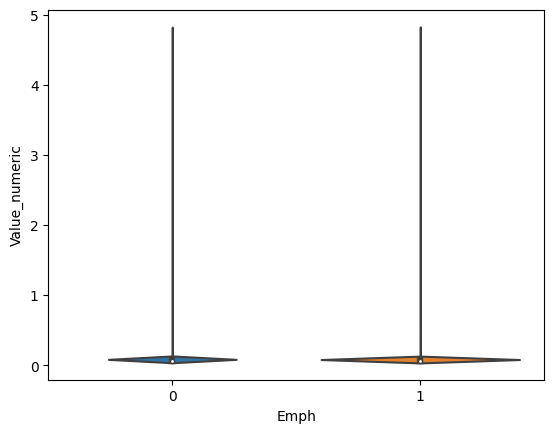

In [ ]:
df_plot = df.copy(deep=True)
df_plot['Emph'] = [0]  * len(df_plot)
df_plot['Emph'] = [1 if x==59 else 0 for x in df_plot['sct_ab_desc']]

new_column = [np.float32(f) for f in df_plot['Value'].values]
df_plot['Value_numeric'] = new_column
new_column = [np.float32(f) for f in df_plot['age'].values]
df_plot['age_numeric'] = new_column

# sns.boxplot(data=df_plot, x="Emph", y="Value_numeric")
sns.violinplot(data=df_plot, x="Emph", y="Value_numeric")

median_with = np.median(df_plot[df_plot['Emph'] == 1]["Value_numeric"].values)
median_without = np.median(df_plot[df_plot['Emph'] == 0]["Value_numeric"].values)

print ('median with emphysema: ' + str(median_with))
print ('median without emphysema: ' + str(median_without))


In [ ]:
from scipy.stats import mannwhitneyu

df_plot_with = df_plot[df_plot['Emph'] == 1]["Value_numeric"].values
df_plot_without = df_plot[df_plot['Emph'] == 0]["Value_numeric"].values
U1, p = mannwhitneyu(df_plot_with, df_plot_without)
print(U1)
print(p)

31313333674.0
0.0


In [ ]:
print(np.mean(df_plot_without))
print(np.mean(df_plot_with))

0.0703302
0.06906892


There is a significant difference in the surface area to volume ratio, though the means/median don't appear too different.

## 3.Emphysema is identified by more lower attenuation areas

Maybe we can check Median or Minimum gray level, so far not sure. Though we are getting significant results.

In [ ]:
# Lower lobe of lung
# Middle lobe of right lung
# Upper lobe of lung

In [ ]:
table_id = table_id_126k
region = "Upper lobe of lung"
# feature = "Minimum grey level"
feature = "Median"
df = query_for_condition(region, feature, table_id, project_name)

idc-external-025.terra.nlst-126k-measurements-clinical-acquisition


<Axes: xlabel='Emph', ylabel='Value_numeric'>

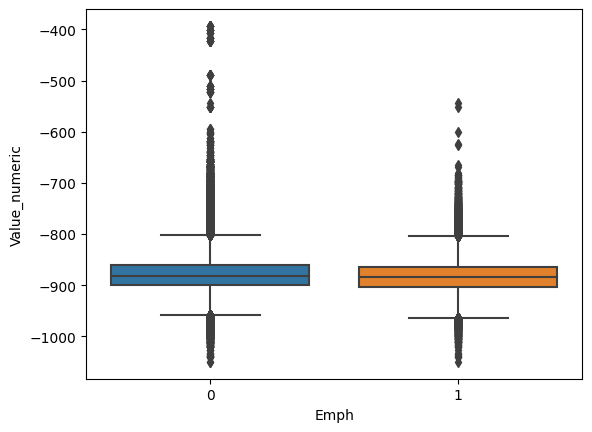

In [ ]:
df_plot = df.copy(deep=True)
df_plot['Emph'] = [0]  * len(df_plot)
df_plot['Emph'] = [1 if x==59 else 0 for x in df_plot['sct_ab_desc']]

new_column = [np.float32(f) for f in df_plot['Value'].values]
df_plot['Value_numeric'] = new_column
new_column = [np.float32(f) for f in df_plot['age'].values]
df_plot['age_numeric'] = new_column

sns.boxplot(data=df_plot, x="Emph", y="Value_numeric")

In [ ]:
from scipy.stats import mannwhitneyu

df_plot_with = df_plot[df_plot['Emph'] == 1]["Value_numeric"].values
df_plot_without = df_plot[df_plot['Emph'] == 0]["Value_numeric"].values
U1, p = mannwhitneyu(df_plot_with, df_plot_without)
print(U1)
print(p)

35557334842.0
0.0


In [ ]:
print(np.median(df_plot_without))
print(np.median(df_plot_with))

-881.15247
-884.8685


## 4.See if the trachea changes shape with emphysema

Let's see if the trachea changes shape too those with emphysema, if there are differences between males and females

In [ ]:
region = "Trachea"
feature = "Volume"

client = bigquery.Client(project=project_name)
print(table_id)

query = f"""
  SELECT
     DISTINCT(SOPInstanceUID),
     StudyInstanceUID,
     age,
     gender,
     Value,
     nlst_ctab.sct_ab_desc
  FROM
    `idc-external-025.terra.nlst-126k-measurements-clinical-acquisition` as clinical_table
  JOIN
    `bigquery-public-data.idc_v15_clinical.nlst_ctab` as nlst_ctab
  ON
    clinical_table.PatientID = nlst_ctab.pid
  WHERE
      findingSite.CodeMeaning = @region AND
      Quantity.CodeMeaning = @feature;

  """
job_config = bigquery.QueryJobConfig(query_parameters=[
                                                      bigquery.ScalarQueryParameter("region", "STRING", region),
                                                      bigquery.ScalarQueryParameter("feature", "STRING", feature)
                                                      ])
df = client.query(query, job_config=job_config).to_dataframe()

idc-external-025.terra.nlst-126k-measurements-clinical-acquisition


In [ ]:
df_plot = df.copy(deep=True)
df_plot['Emph'] = [0]  * len(df_plot)
df_plot['Emph'] = [1 if x==59 else 0 for x in df_plot['sct_ab_desc']]

In [ ]:
new_column = [np.float32(f) for f in df_plot['Value'].values]
df_plot['Value_numeric'] = new_column
new_column = [np.float32(f) for f in df_plot['age'].values]
df_plot['age_numeric'] = new_column

In [ ]:
df_plot = df_plot[df_plot['Emph']==1]

<Axes: xlabel='gender', ylabel='Value_numeric'>

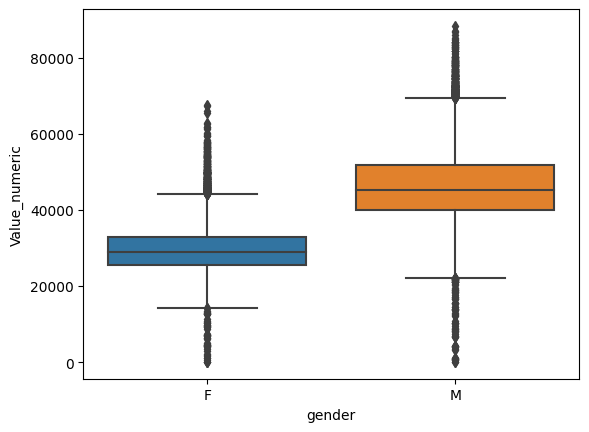

In [ ]:
sns.boxplot(data=df_plot, x="gender", y="Value_numeric")


In [ ]:
df_plot_males_with = df_plot[df_plot['gender']== "M"]["Value_numeric"].values
df_plot_females_with = df_plot[df_plot['gender']== "F"]["Value_numeric"].values

from scipy.stats import mannwhitneyu

U1, p = mannwhitneyu(df_plot_males_with, df_plot_females_with)
print(U1)
print(p)

719026743.5
0.0


Significant differences between males and females for feature for Trachea -- have to do with airway thickening?? Ability of seg?

# Convolutional kernel analysis

1. Features should be stable between sharp and smooth kernels
2. Are there differences in stability between the different manufacturers?
3. Are there differences in stability depending on the type of abnormality?

https://www.ncbi.nlm.nih.gov/pmc/articles/PMC8010534/pdf/bjr.20200947.pdf

- For each of the 4 manufacturers, divide into sharp and smooth kernels
- For each study analyze, keep it if it has one series with smooth and one series with sharp. Pick only 1 if more.
- Pick a region - lung lobe.


## Difference between manufacturers

In [ ]:
# Philips, GE, Siemens -- what about Toshiba
sharp_kernels = ['C', 'STANDARD', 'B30f']
smooth_kernels = ['D', 'LUNG', 'B50f']

In [ ]:
# def query_for_conv(Manufacturer, kernel1, kernel2, region, feature, laterality, table_id):

#   # I only want to include the studies that have series that have both STANDARD and LUNG

#   client = bigquery.Client(project=project_name)

#   query = f"""

#   WITH study_conv1 AS (
#     SELECT
#       DISTINCT(sourceSegmentedSeriesUID),
#       StudyInstanceUID
#     FROM
#       `{table_id}` as clinical_table
#     JOIN
#       `idc-external-025.terra.segmentation_completeness_table` as segmentation_completeness
#     ON
#       clinical_table.sourceSegmentedSeriesUID = segmentation_completeness.rssSIUD AND
#       clinical_table.findingSite.CodeMeaning = segmentation_completeness.bodyPart
#     WHERE
#       Manufacturer = @Manufacturer AND
#       ConvolutionKernel = @kernel1 AND
#       clinical_table.findingSite.CodeMeaning = @region AND
#       clinical_table.lateralityModifier.CodeMeaning = @laterality AND
#       clinical_table.Quantity.CodeMeaning = @feature AND
#       segmentation_completeness.segmentation_completeness_check = 'may_be_segmented_fully'
#   ),

#   study_conv2 AS (
#     SELECT
#       DISTINCT(sourceSegmentedSeriesUID),
#       StudyInstanceUID
#     FROM
#       `{table_id}` as clinical_table
#     JOIN
#       `idc-external-025.terra.segmentation_completeness_table` as segmentation_completeness
#     ON
#       clinical_table.sourceSegmentedSeriesUID = segmentation_completeness.rssSIUD AND
#       clinical_table.findingSite.CodeMeaning = segmentation_completeness.bodyPart
#     WHERE
#       Manufacturer = @Manufacturer AND
#       ConvolutionKernel = @kernel2 AND
#       clinical_table.findingSite.CodeMeaning = @region AND
#       clinical_table.lateralityModifier.CodeMeaning = @laterality AND
#       clinical_table.Quantity.CodeMeaning = @feature AND
#       segmentation_completeness.segmentation_completeness_check = 'may_be_segmented_fully'
#   ),

#   study_conv_both AS (
#     SELECT
#       study_conv1.StudyInstanceUID as StudyInstanceUID,
#       ANY_VALUE(study_conv1.sourceSegmentedSeriesUID) as series_id_1,
#       ANY_VALUE(study_conv2.sourceSegmentedSeriesUID) as series_id_2
#     FROM
#       study_conv1
#     JOIN
#       study_conv2
#     ON
#       study_conv1.StudyInstanceUID = study_conv2.StudyInstanceUID
#     GROUP BY
#       study_conv1.StudyInstanceUID
#   ),

#   series_conv_both AS (

#     SELECT
#       StudyInstanceUID,
#       series_id_1 as SeriesInstanceUID
#     FROM
#       study_conv_both

#     UNION ALL

#     SELECT
#       StudyInstanceUID,
#       series_id_2 as SeriesInstanceUID
#     FROM
#       study_conv_both

#   )


#   SELECT
#     clinical_table.PatientID,
#     clinical_table.StudyInstanceUID,
#     clinical_table.sourceSegmentedSeriesUID,
#     clinical_table.ConvolutionKernel,
#     clinical_table.Manufacturer,
#     clinical_table.SliceThickness,
#     clinical_table.findingSite.CodeMeaning AS findingSite_CodeMeaning,
#     clinical_table.Quantity.CodeMeaning AS Quantity_CodeMeaning,
#     clinical_table.Value,
#     segmentation_completeness.SeriesNumber,
#     segmentation_completeness.viewerUrl
#     # concat("https://idc-tester-dk-2-server.web.app/viewer/",table1.StudyInstanceUID,"!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_sample_061023/dicomStores/10k-series") as viewer_url
#   FROM
#     `idc-external-025.terra.nlst-126k-measurements-clinical-acquisition` AS clinical_table
#   JOIN
#     series_conv_both
#   ON
#     series_conv_both.SeriesInstanceUID = clinical_table.sourceSegmentedSeriesUID
#   JOIN
#     `idc-external-025.terra.segmentation_completeness_table` as segmentation_completeness
#   ON
#     clinical_table.sourceSegmentedSeriesUID = segmentation_completeness.rssSIUD AND
#     clinical_table.findingSite.CodeMeaning = segmentation_completeness.bodyPart
#   WHERE
#     clinical_table.findingSite.CodeMeaning = @region AND
#     clinical_table.lateralityModifier.CodeMeaning = @laterality AND
#     clinical_table.Quantity.CodeMeaning = @feature AND
#     segmentation_completeness_check = 'may_be_segmented_fully'
#   ORDER BY
#     clinical_table.PatientID

#   """

#   job_config = bigquery.QueryJobConfig(query_parameters=[
#                                                         bigquery.ScalarQueryParameter("region", "STRING", region),
#                                                         bigquery.ScalarQueryParameter("feature", "STRING", feature),
#                                                         bigquery.ScalarQueryParameter("laterality", "STRING", laterality),
#                                                         bigquery.ScalarQueryParameter("kernel1", "STRING", kernel1),
#                                                         bigquery.ScalarQueryParameter("kernel2", "STRING", kernel2),
#                                                         bigquery.ScalarQueryParameter("Manufacturer", "STRING", Manufacturer)
#                                                         ])
#   df = client.query(query, job_config=job_config).to_dataframe()

#   return df


In [ ]:
def query_for_conv(Manufacturer, kernel1, kernel2, region, feature, laterality, table_id):

  # I only want to include the studies that have series that have both STANDARD and LUNG

  client = bigquery.Client(project=project_name)

  query = f"""

  WITH study_conv1 AS (
    SELECT
      DISTINCT(sourceSegmentedSeriesUID),
      StudyInstanceUID
    FROM
      `{table_id}`
    WHERE
      Manufacturer = @Manufacturer AND
      ConvolutionKernel = @kernel1
  ),

  study_conv2 AS (
    SELECT
      DISTINCT(sourceSegmentedSeriesUID),
      StudyInstanceUID
    FROM
      `{table_id}`
    WHERE
      Manufacturer = @Manufacturer AND
      ConvolutionKernel = @kernel2
  ),

  study_conv_both AS (
    SELECT
      study_conv1.StudyInstanceUID as StudyInstanceUID,
      ANY_VALUE(study_conv1.sourceSegmentedSeriesUID) as series_id_1,
      ANY_VALUE(study_conv2.sourceSegmentedSeriesUID) as series_id_2
    FROM
      study_conv1
    JOIN
      study_conv2
    ON
      study_conv1.StudyInstanceUID = study_conv2.StudyInstanceUID
    GROUP BY
      study_conv1.StudyInstanceUID
  ),

  series_conv_both AS (

    SELECT
      StudyInstanceUID,
      series_id_1 as SeriesInstanceUID
    FROM
      study_conv_both

    UNION ALL

    SELECT
      StudyInstanceUID,
      series_id_2 as SeriesInstanceUID
    FROM
      study_conv_both

  )


  SELECT
    table1.PatientID,
    table1.StudyInstanceUID,
    table1.sourceSegmentedSeriesUID,
    table1.ConvolutionKernel,
    table1.Manufacturer,
    table1.SliceThickness,
    table1.findingSite.CodeMeaning AS findingSite_CodeMeaning,
    table1.Quantity.CodeMeaning AS Quantity_CodeMeaning,
    table1.Value,
    concat("https://idc-tester-dk-2-server.web.app/viewer/",table1.StudyInstanceUID,"!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_sample_061023/dicomStores/10k-series") as viewer_url
  FROM
    `idc-external-025.terra.nlst-126k-measurements-clinical-acquisition` AS table1
  JOIN
    series_conv_both
  ON
    series_conv_both.SeriesInstanceUID = table1.sourceSegmentedSeriesUID
  WHERE
    table1.findingSite.CodeMeaning = @region AND
    table1.lateralityModifier.CodeMeaning = @laterality AND
    table1.Quantity.CodeMeaning = @feature
  ORDER BY
    table1.PatientID

  """

  job_config = bigquery.QueryJobConfig(query_parameters=[
                                                        bigquery.ScalarQueryParameter("region", "STRING", region),
                                                        bigquery.ScalarQueryParameter("feature", "STRING", feature),
                                                        bigquery.ScalarQueryParameter("laterality", "STRING", laterality),
                                                        bigquery.ScalarQueryParameter("kernel1", "STRING", kernel1),
                                                        bigquery.ScalarQueryParameter("kernel2", "STRING", kernel2),
                                                        bigquery.ScalarQueryParameter("Manufacturer", "STRING", Manufacturer)
                                                        ])
  df = client.query(query, job_config=job_config).to_dataframe()

  return df


[Text(0.5, 0, 'Median'),
 Text(0, 0.5, 'Count'),
 Text(0.5, 1.0, 'Median ConvolutionKernel')]

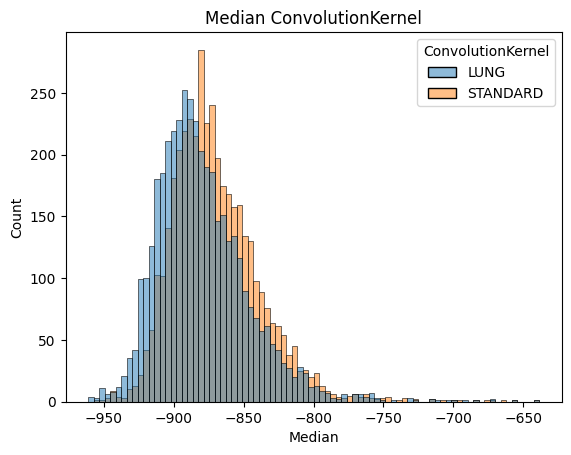

In [ ]:
### GE ###

table_id = "idc-external-025.terra.nlst-126k-measurements-clinical-acquisition"
Manufacturer = "GE MEDICAL SYSTEMS"
kernel1 = 'STANDARD'
kernel2 = 'LUNG'
region = "Upper lobe of lung"
feature = "Median"
laterality = "Left"
df_plot = query_for_conv(Manufacturer, kernel1, kernel2, region, feature, laterality, table_id)

# calculate correlation
# later calculate actual ICC

df_plot["Value_numeric"] = [np.float32(f) for f in df_plot["Value"].values]

# r = np.corrcoef(df_plot[df_plot["ConvolutionKernel"]==kernel1]['Value_numeric'].values,
#                 df_plot[df_plot["ConvolutionKernel"]==kernel2]['Value_numeric'].values)
# print('correlation is: ' + str(r[0,1]))

# histogram

histogram = sns.histplot(data=df_plot, x="Value_numeric", hue="ConvolutionKernel")
histogram.set(xlabel = feature, ylabel = "Count", title = feature + ' ConvolutionKernel')

In [ ]:
print(len(df_plot[df_plot['ConvolutionKernel']=="STANDARD"]))
print(len(df_plot[df_plot['ConvolutionKernel']=="LUNG"]))

4136
4136


In [ ]:
from scipy.stats import mannwhitneyu

df_plot_standard = df_plot[df_plot["ConvolutionKernel"] == "STANDARD"]["Value_numeric"].values
df_plot_lung = df_plot[df_plot["ConvolutionKernel"] == "LUNG"]["Value_numeric"].values
U1, p = mannwhitneyu(df_plot_standard, df_plot_lung)
print(U1)
print(p)

10263638.5
6.895069511707895e-56


correlation is: 0.9272475207786263


[Text(0.5, 0, 'Median'),
 Text(0, 0.5, 'Count'),
 Text(0.5, 1.0, 'Median ConvolutionKernel')]

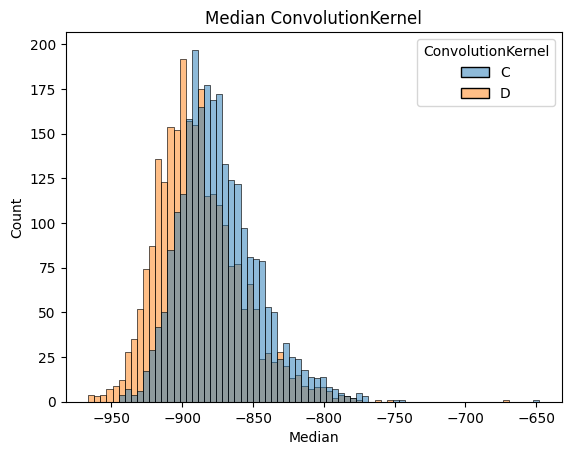

In [ ]:
### Philips ###

table_id = "idc-external-025.terra.nlst-126k-measurements-clinical-acquisition"
Manufacturer = "Philips"
kernel1 = 'C'
kernel2 = 'D'
region = "Upper lobe of lung"
feature = "Median"
laterality = "Left"
df_plot = query_for_conv(Manufacturer, kernel1, kernel2, region, feature, laterality, table_id)

# calculate correlation
# later calculate actual ICC

df_plot["Value_numeric"] = [np.float32(f) for f in df_plot["Value"].values]

r = np.corrcoef(df_plot[df_plot["ConvolutionKernel"]==kernel1]['Value_numeric'].values,
                df_plot[df_plot["ConvolutionKernel"]==kernel2]['Value_numeric'].values)
print('correlation is: ' + str(r[0,1]))

# histogram

histogram = sns.histplot(data=df_plot, x="Value_numeric", hue="ConvolutionKernel")
histogram.set(xlabel = feature, ylabel = "Count", title = feature + ' ConvolutionKernel')

In [ ]:
from scipy.stats import mannwhitneyu

df_plot_standard = df_plot[df_plot["ConvolutionKernel"] == "C"]["Value_numeric"].values
df_plot_lung = df_plot[df_plot["ConvolutionKernel"] == "D"]["Value_numeric"].values
U1, p = mannwhitneyu(df_plot_standard, df_plot_lung)
print(U1)
print(p)

4158328.0
8.388326645622334e-79


In [ ]:
## Siemens ##

table_id = "idc-external-025.terra.nlst-126k-measurements-clinical-acquisition"
Manufacturer = "SIEMENS"
kernel1 = 'B30f'
kernel2 = 'B50f'
region = "Upper lobe of lung"
feature = "Median"
laterality = "Left"
df_plot = query_for_conv(Manufacturer, kernel1, kernel2, region, feature, laterality, table_id)

# calculate correlation
# later calculate actual ICC

df_plot["Value_numeric"] = [np.float32(f) for f in df_plot["Value"].values]

r = np.corrcoef(df_plot[df_plot["ConvolutionKernel"]==kernel1]['Value_numeric'].values,
                df_plot[df_plot["ConvolutionKernel"]==kernel2]['Value_numeric'].values)
print('correlation is: ' + str(r[0,1]))

# histogram

histogram = sns.histplot(data=df_plot, x="Value_numeric", hue="ConvolutionKernel")
histogram.set(xlabel = feature, ylabel = "Count", title = feature + ' ConvolutionKernel')

ValueError: ignored

## Difference across abnormalities

In [ ]:
def query_for_conv_abnormalities(Manufacturer, kernel1, kernel2, region, feature, laterality, table_id):

  # I only want to include the studies that have series that have both STANDARD and LUNG

  client = bigquery.Client(project=project_name)

  query = f"""

  WITH study_conv1 AS (
    SELECT
      DISTINCT(sourceSegmentedSeriesUID),
      StudyInstanceUID
    FROM
      `{table_id}`
    WHERE
      Manufacturer = @Manufacturer AND
      ConvolutionKernel = @kernel1
  ),

  study_conv2 AS (
    SELECT
      DISTINCT(sourceSegmentedSeriesUID),
      StudyInstanceUID
    FROM
      `{table_id}`
    WHERE
      Manufacturer = @Manufacturer AND
      ConvolutionKernel = @kernel2
  ),

  study_conv_both AS (
    SELECT
      study_conv1.StudyInstanceUID as StudyInstanceUID,
      ANY_VALUE(study_conv1.sourceSegmentedSeriesUID) as series_id_1,
      ANY_VALUE(study_conv2.sourceSegmentedSeriesUID) as series_id_2
    FROM
      study_conv1
    JOIN
      study_conv2
    ON
      study_conv1.StudyInstanceUID = study_conv2.StudyInstanceUID
    GROUP BY
      study_conv1.StudyInstanceUID
  ),

  series_conv_both AS (

    SELECT
      StudyInstanceUID,
      series_id_1 as SeriesInstanceUID
    FROM
      study_conv_both

    UNION ALL

    SELECT
      StudyInstanceUID,
      series_id_2 as SeriesInstanceUID
    FROM
      study_conv_both

  )


  SELECT
    table1.PatientID,
    nlst_ctab.sct_ab_desc,
    table1.StudyInstanceUID,
    table1.sourceSegmentedSeriesUID,
    table1.ConvolutionKernel,
    table1.Manufacturer,
    table1.SliceThickness,
    table1.findingSite.CodeMeaning AS findingSite_CodeMeaning,
    table1.Quantity.CodeMeaning AS Quantity_CodeMeaning,
    table1.Value,
    concat("https://idc-tester-dk-2-server.web.app/viewer/",table1.StudyInstanceUID,"!secondGoogleServer=/projects/idc-external-025/locations/us-central1/datasets/total_segmentator_nlst_sample_061023/dicomStores/10k-series") as viewer_url
  FROM
    `idc-external-025.terra.nlst-126k-measurements-clinical-acquisition` AS table1
  JOIN
    series_conv_both
  ON
    series_conv_both.SeriesInstanceUID = table1.sourceSegmentedSeriesUID
  JOIN
    `bigquery-public-data.idc_v15_clinical.nlst_ctab` as nlst_ctab
  ON
    table1.PatientID = nlst_ctab.pid
  WHERE
    table1.findingSite.CodeMeaning = @region AND
    table1.lateralityModifier.CodeMeaning = @laterality AND
    table1.Quantity.CodeMeaning = @feature
  ORDER BY
    table1.PatientID

  """

  job_config = bigquery.QueryJobConfig(query_parameters=[
                                                        bigquery.ScalarQueryParameter("region", "STRING", region),
                                                        bigquery.ScalarQueryParameter("feature", "STRING", feature),
                                                        bigquery.ScalarQueryParameter("laterality", "STRING", laterality),
                                                        bigquery.ScalarQueryParameter("kernel1", "STRING", kernel1),
                                                        bigquery.ScalarQueryParameter("kernel2", "STRING", kernel2),
                                                        bigquery.ScalarQueryParameter("Manufacturer", "STRING", Manufacturer)
                                                        ])
  df = client.query(query, job_config=job_config).to_dataframe()

  return df


# (IGNORE) Convolutional kernel analysis old

In [ ]:
# SELECT
#   DISTINCT(ConvolutionKernel),
#   COUNT(DISTINCT(sourceSegmentedSeriesUID)) as num_series,
#   Manufacturer
# FROM
#   `idc-external-025.terra.nlst-126k-measurements-clinical-acquisition`
# GROUP BY
#   ConvolutionKernel,
#   Manufacturer
# ORDER BY
#   num_series DESC

https://www.ncbi.nlm.nih.gov/pmc/articles/PMC8010534/pdf/bjr.20200947.pdf

- For each of the 4 manufacturers, divide into sharp and smooth kernels
- For each study analyzed, we can keep the series that have at least 1 sharp and 1 smooth kernel, pick only 1 if more
- Pick a region - lung lobe, calculate ICC between sharp and smooth kernels across patients for a particular manufacturer
   - now divide across lung abnormality
- Bokeh plot - sharp distribution vs smooth distribution for a particular region, for a particular feature

In [ ]:
# Philips, GE, Siemens -- what about Toshiba
sharp_kernels = ['C', 'STANDARD', 'B30f']
smooth_kernels = ['D', 'LUNG', 'B50f']

In [ ]:
!pip install pandas-gbq

In [ ]:
import pandas_gbq

table_id_conv_explore = "idc-external-018.terra.conv-kernel-explore"

query = f"""

  SELECT
    *
  FROM
    `{table_id_conv_explore}`
"""
df = pandas_gbq.read_gbq(query, project_id=project_name)



Downloading:   3%|▎         |

KeyboardInterrupt: ignored

In [ ]:
set(df['ConvolutionKernel'].values)

In [ ]:
def create_seaborn_plot_conv_kernel_comparison(df):

  histogram = sns.histplot(data=df_plot, x="Value", hue="ConvolutionKernel")
  histogram.set(xlabel = 'ConvolutionKernel', ylabel = "Count", title = 'Upper lobe of lung - for STANDARD vs LUNG kernel for GE')

  return df_plot

In [ ]:
df_plot = df[df['lateralityModifier_CodeMeaning']=='Right']
df_plot = df_plot[df_plot["Quantity_CodeMeaning"]=='Mean']
# Not much difference across both kernels -- shows that this feature (intensity feature) is stable
create_seaborn_plot_conv_kernel_comparison(df_plot)

In [ ]:
# What about across abnormalities?

df_plot = df[df['lateralityModifier_CodeMeaning']=='Right']
df_plot = df_plot[df_plot["Quantity_CodeMeaning"]=='Mean']
df_plot = df_plot[df_plot["sct_ab_desc"]==51]
# Not much difference across both kernels --
create_seaborn_plot_conv_kernel_comparison(df_plot)